# ECG pipeline notebook – bővített 1ch / 2ch / 12ch workflow

Ez a notebook a teljes EKG-feldolgozó workflow-t **közvetlen függvényhívásokkal** futtatja.  
A fő újdonság, hogy a korábbi 1 csatornás baseline-ok mellett bekerült:

- **MIT-BIH 2 csatornás CNN**
- **INCART 12 csatornás CNN**
- bővített összehasonlítás a compare szekcióban

**Rövid értelmezés**
- A **feature extraction**, a **morphology** és a **QC** továbbra is 1 csatornás baseline-on fut.
- A **CNN** viszont már tud külön 1ch / 2ch / 12ch változatban tanulni.
- Így a klasszikus és a deep learning alapú megközelítés tisztán összehasonlítható.

**Használat**
- Egy szekció újrafuttatásához: `reset_section("mitbih")`
- Egy adott lépés automatikusan skipelődik, ha már completed
- Kényszerített újrafuttatáshoz a notebook util logikát használd vagy töröld az adott szekció checkpointját

In [1]:
## System setup

import os
import sys
import traceback
import subprocess
from datetime import datetime
from pathlib import Path
import shutil
## Mount gdrive and clone github repo
from google.colab import drive
drive.mount('/content/drive')
GDRIVE_ROOT = Path("/content/drive/MyDrive/ecg_project")
GDRIVE_DATA_DIR = GDRIVE_ROOT / "data" / "raw"
GDRIVE_DATA_DIR.mkdir(parents=True, exist_ok=True)
GDRIVE_OUTPUT_DIR = GDRIVE_ROOT / "outputs"
GDRIVE_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

PROJECT_ROOT = Path("/content/ECG")
REPO_URL = 'https://github.com/csambrus/ECG.git'

FORCE_REPO_CLONE = True
if FORCE_REPO_CLONE:
    if PROJECT_ROOT.exists():
        shutil.rmtree(PROJECT_ROOT)
        
if PROJECT_ROOT.exists() and not FORCE_REPO_CLONE:
    print(f'Repo already exists at {PROJECT_ROOT}, skipping clone.')
else:
    print(f'Cloning {REPO_URL} -> {PROJECT_ROOT} ...')
    result = subprocess.run(['git', 'clone', REPO_URL, str(PROJECT_ROOT)])
    if result.returncode != 0:
        raise RuntimeError(
            'Git clone failed.'
        )

os.chdir(PROJECT_ROOT)

## Install dependencies
req_file = PROJECT_ROOT / 'requirements.txt'
if req_file.exists():
    subprocess.run([sys.executable, '-m', 'pip', 'install', '-r', str(req_file)], check=True)
else:
    raise FileNotFoundError(f'Missing requirements file: {req_file}')

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

## Hogy a config-py-ben is lássuk:
os.environ["PROJECT_ROOT"] = str(PROJECT_ROOT)

## Just to make sure ...
print('PROJECT_ROOT:', PROJECT_ROOT)
print("cwd:", os.getcwd())
print("sys.path[0]:", sys.path[0])

## Nice to have an error logger
def notebook_error_logger(exc_type, exc_value, exc_traceback):
    from src.config import LOGS_DIR
    ts = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
    logfile = LOGS_DIR / f'notebook_error_{ts}.log'

    with open(logfile, 'w', encoding='utf-8') as f:
        f.write('Jupyter Notebook Error Log\n')
        f.write('=' * 60 + '\n')
        f.write(f'Time: {ts}\n\n')
        traceback.print_exception(exc_type, exc_value, exc_traceback, file=f)

    print(f'Error happened. Log saved to: {logfile}')

    # Keep normal traceback in notebook output.
    traceback.print_exception(exc_type, exc_value, exc_traceback)

sys.excepthook = notebook_error_logger
print('Global error logger is active.')


Mounted at /content/drive
Cloning https://github.com/csambrus/ECG.git -> /content/ECG ...
PROJECT_ROOT: /content/ECG
cwd: /content/ECG
sys.path[0]: /content/ECG
Global error logger is active.


In [2]:
## Download datasets – no GPU needed here !!
from pathlib import Path

from src.notebook_utils import run_step_if_needed, reset_section, checkpoint_path, load_checkpoint
from src.download_mitbih_paralel import sync_mitbih_with_gdrive
from src.download_incart_paralel import sync_incart_with_gdrive

# Ha a GDRIVE_DATA_DIR-ben (…/data/raw/mitbih vagy …/incart) megvan az adat, másolás a DATA_DIR/raw/… alá.
# Ha nincs, letöltés, majd bemásoljuk a helyi nyers adatot a GDRIVE_DATA_DIR megfelelő almappájába.
print("MIT-BIH: Drive / letöltés szinkron …")
sync_mitbih_with_gdrive(GDRIVE_DATA_DIR, verbose=True)

print("INCART: Drive / letöltés szinkron …")
sync_incart_with_gdrive(GDRIVE_DATA_DIR, verbose=True)
print("Done.")


MIT-BIH: Drive / letöltés szinkron …
[MITBIH] Drive-on lévő másolás: /content/drive/MyDrive/ecg_project/data/raw/mitbih -> /content/ECG/data/raw/mitbih
INCART: Drive / letöltés szinkron …
[INCART] Drive-on lévő másolás: /content/drive/MyDrive/ecg_project/data/raw/incart -> /content/ECG/data/raw/incart
Done.


In [3]:
# -------------------------
# IMPORTOK – core függvények
# -------------------------

from src.notebook_utils import run_step_if_needed, reset_section, checkpoint_path, load_checkpoint
from src.config import OUTPUT_DIR
from src.config import get_ds_par

from src.qc_dataset_ext import qc_dataset_ext
from src.plot_preprocessing_comparison import plot_preprocessing_comparison

from src.prepare_mitbih_datasets import prepare_mitbih_datasets
from src.prepare_mitbih_datasets_2ch import prepare_mitbih_datasets_2ch
from src.prepare_incart_datasets import prepare_incart_datasets
from src.prepare_incart_datasets_12ch import prepare_incart_datasets_12ch

from src.build_general_features import build_general_features
from src.build_morphology_features import build_morphology_features
from src.report_features import report_features
from src.train_featurext import train_featurext
from src.plot_dataset_tsne import plot_dataset_tsne
from src.plot_tsne_featurext_vs_cnn import plot_tsne_featurext_vs_cnn
from src.train_cnn import train_cnn

from src.prepare_cross_dataset_splits import prepare_cross_dataset_splits
from src.plot_cross_dataset_tsne import plot_cross_dataset_tsne
from src.compare_models_extended import compare_dataset_models_extended

In [4]:
## Setup for GPU and plotting
from src.runtime import setup_tensorflow_runtime

if setup_tensorflow_runtime() == False:
    print("No GPU available. Using CPU will be VERY SLOW !!!")
    print("Switch to GPU and re-run the notebook.")
    raise SystemExit(f"Leállítva. Nincs GPU.")

%matplotlib inline


TF version: 2.20.0
Num GPUs Available: 1
GPUs:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
CPU cores:  12
CUDA_VISIBLE_DEVICES = None
TF version = 2.20.0
Built with CUDA = True
GPUs = [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Logical GPUs = [LogicalDevice(name='/device:GPU:0', device_type='GPU')]
GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU matmul done in 0.25398802757263184 sec


## MIT-BIH

Ebben a szekcióban először lefut a **szokásos 1 csatornás baseline** teljes feldolgozása, majd külön elkészül a **2 csatornás CNN input** és a hozzá tartozó tanítás.  
Így a compare résznél közvetlenül összehasonlítható lesz:

- FeatureXt
- CNN 1ch
- CNN 2ch

[RUN ] qc_dataset_ext::{"dataset": "mitbih"}
Running extended QC on MIT-BIH Arrhythmia Database...
[INFO] Total records: 48
[INFO] QC plot mode: random | plotting 12 record(s)
[INFO] QC random seed: 42
[QC 1/48] 100
[QC 2/48] 101
[QC 3/48] 102
[QC 4/48] 103
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/103_qc_row.png


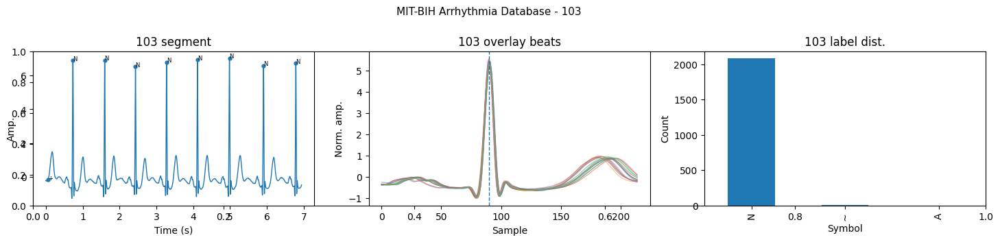

[QC 5/48] 104
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/104_qc_row.png


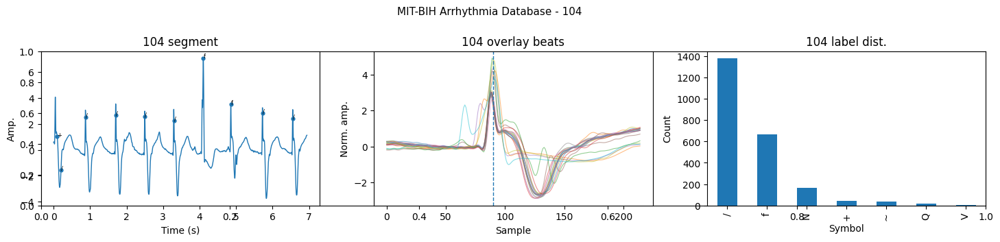

[QC 6/48] 105
[QC 7/48] 106
[QC 8/48] 107
[QC 9/48] 108
[QC 10/48] 109
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/109_qc_row.png


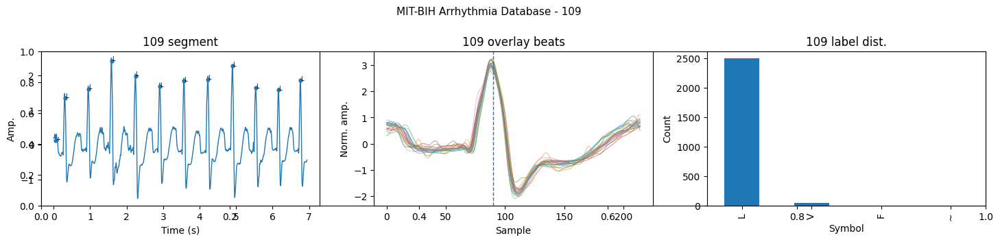

[QC 11/48] 111
[QC 12/48] 112
[QC 13/48] 113
[QC 14/48] 114
[QC 15/48] 115
[QC 16/48] 116
[QC 17/48] 117
[QC 18/48] 118
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/118_qc_row.png


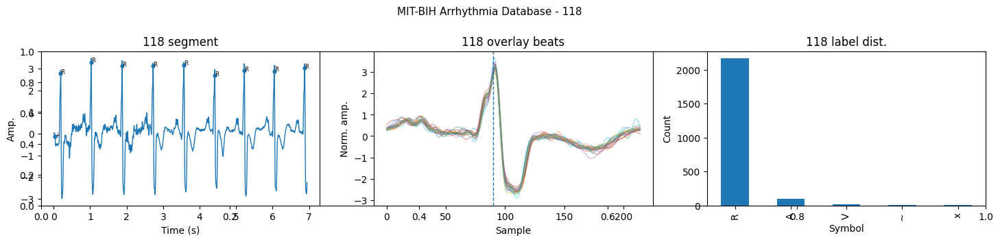

[QC 19/48] 119
[QC 20/48] 121
[QC 21/48] 122
[QC 22/48] 123
[QC 23/48] 124
[QC 24/48] 200
[QC 25/48] 201
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/201_qc_row.png


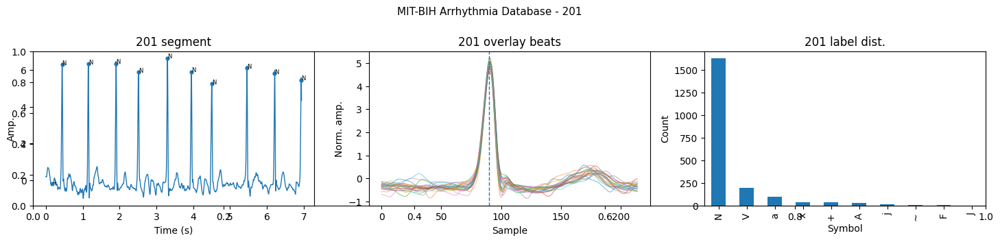

[QC 26/48] 202
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/202_qc_row.png


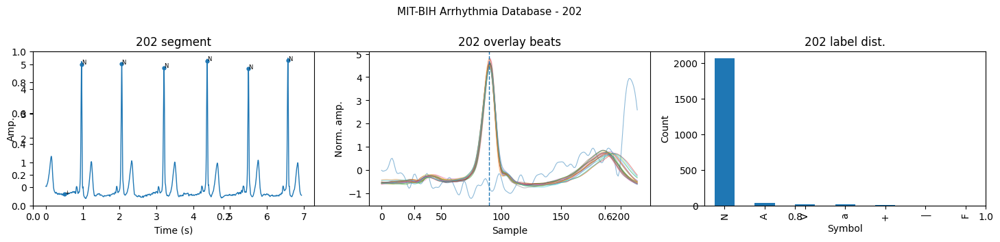

[QC 27/48] 203
[QC 28/48] 205
[QC 29/48] 207
[QC 30/48] 208
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/208_qc_row.png


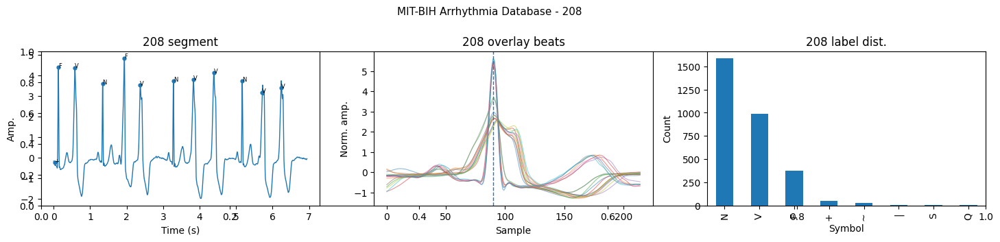

[QC 31/48] 209
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/209_qc_row.png


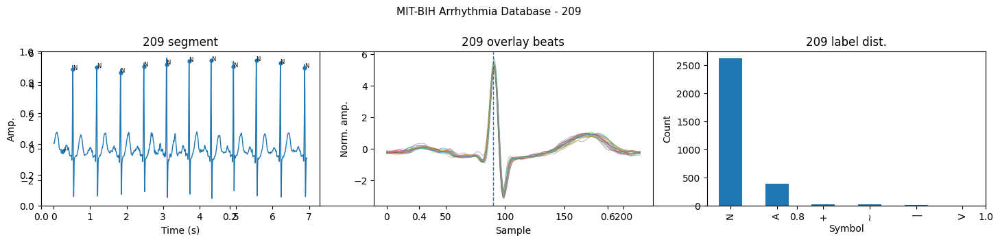

[QC 32/48] 210
[QC 33/48] 212
[QC 34/48] 213
[QC 35/48] 214
[QC 36/48] 215
[QC 37/48] 217
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/217_qc_row.png


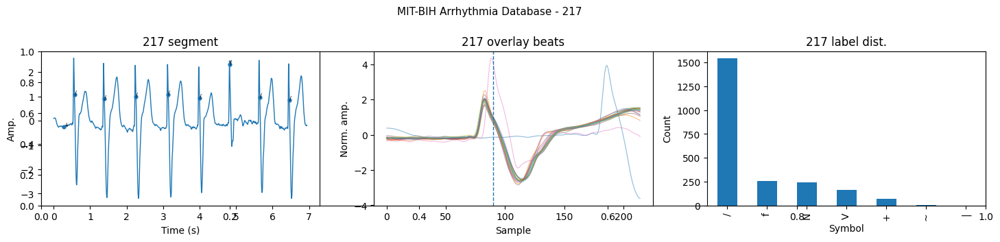

[QC 38/48] 219
[QC 39/48] 220
[QC 40/48] 221
[QC 41/48] 222
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/222_qc_row.png


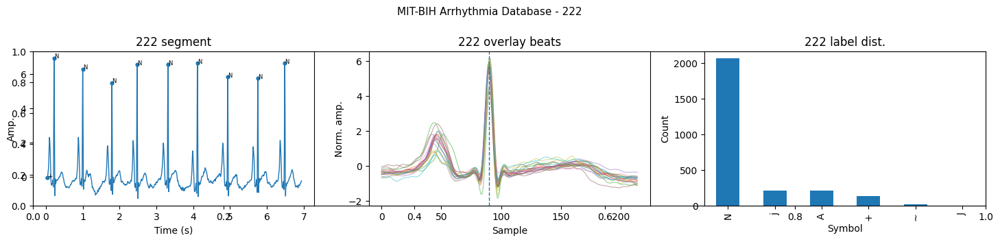

[QC 42/48] 223
[QC 43/48] 228
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/228_qc_row.png


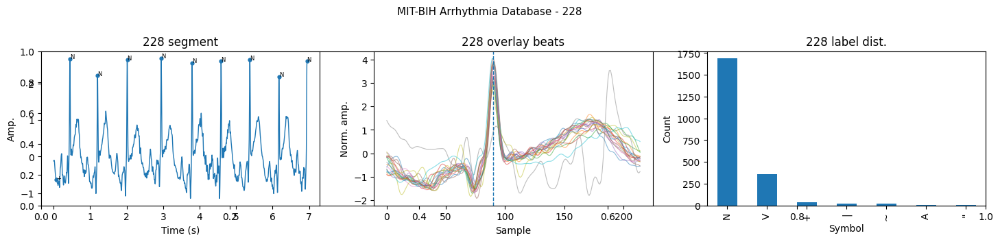

[QC 44/48] 230
[QC 45/48] 231
[QC 46/48] 232
[QC 47/48] 233
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/233_qc_row.png


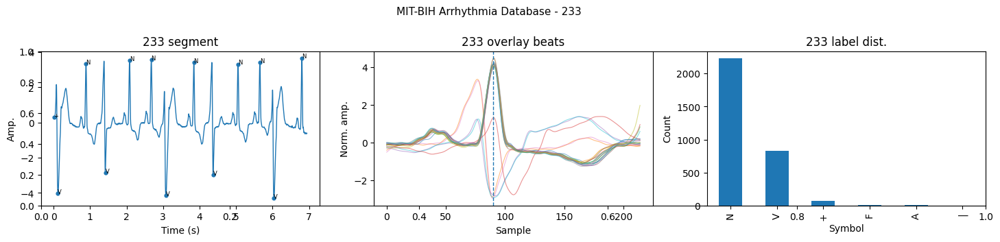

[QC 48/48] 234
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/global_beat_symbol_distribution.png


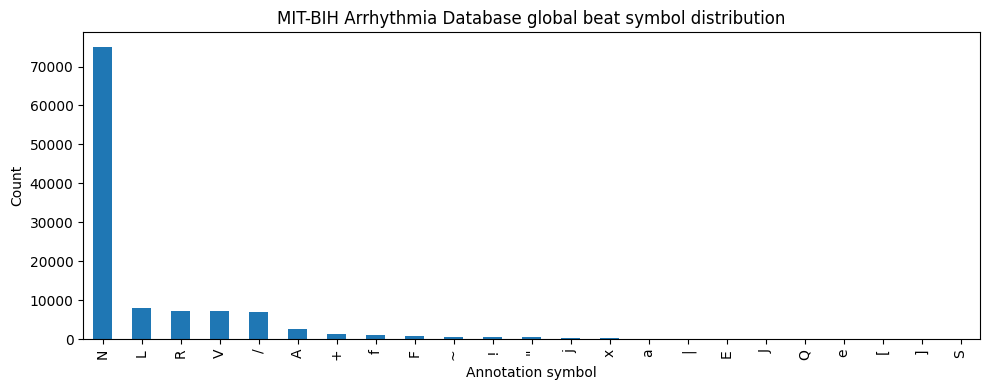

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs/global_aami_distribution.png


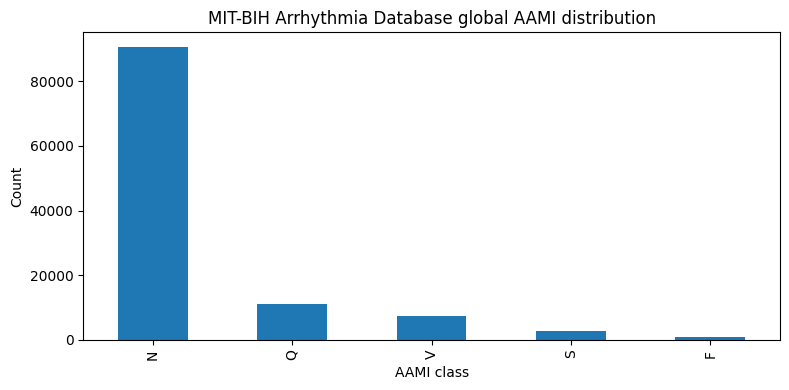


Saved:
- /content/ECG/outputs/ternary_n_v_other/mitbih_qc/qc_summary.csv
- /content/ECG/data/interim/ternary_n_v_other/beat_annotations.csv
- /content/ECG/outputs/ternary_n_v_other/mitbih_qc/problems.csv
- figures in /content/ECG/outputs/ternary_n_v_other/mitbih_qc/graphs
- plotted records: 12 / 48
[DONE] qc_dataset_ext::{"dataset": "mitbih"}
[RUN ] plot_preprocessing_comparison::{"dataset": "mitbih", "record_name": "100"}
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih/preprocessing_comparison/mitbih_100_ch0_preprocessing_comparison.png


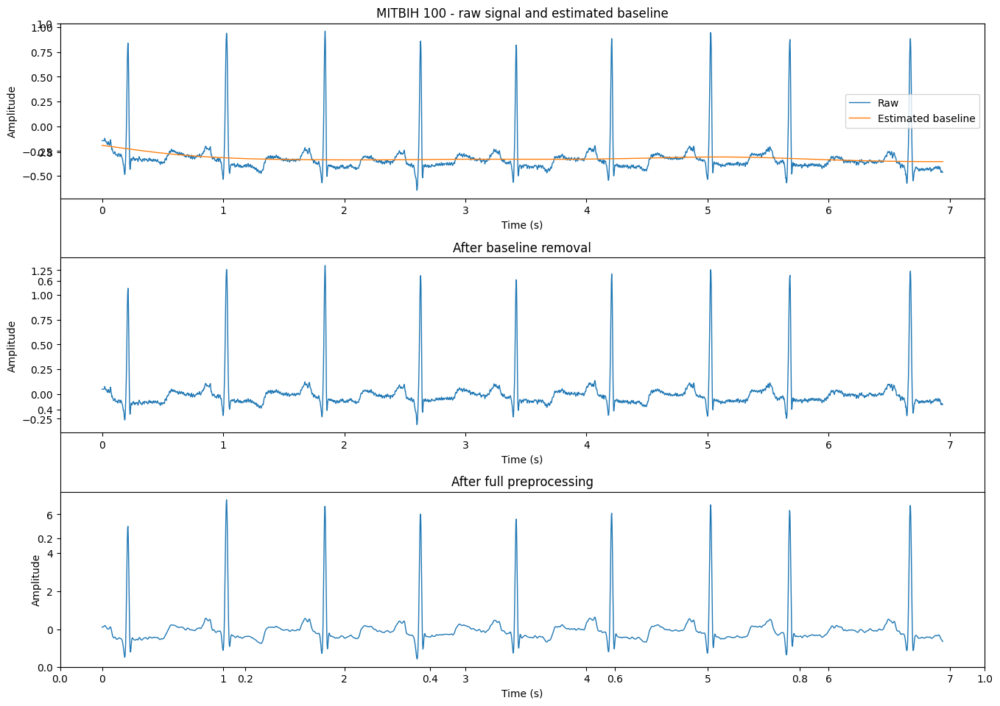

[OK] Saved figure to: /content/ECG/outputs/ternary_n_v_other/mitbih/preprocessing_comparison/mitbih_100_ch0_preprocessing_comparison.png
[DONE] plot_preprocessing_comparison::{"dataset": "mitbih", "record_name": "100"}
[RUN ] prepare_mitbih_datasets::{}
[OK] Saved to: /content/ECG/data/interim/ternary_n_v_other/mitbih_beats
[DONE] prepare_mitbih_datasets::{}
[RUN ] build_general_features::{"dataset": "mitbih"}
DATA DIR: /content/ECG/data/interim/ternary_n_v_other/mitbih_beats
OUT DIR: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_general
[OK] Saved: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_general/train_general_features.csv
[OK] Saved: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_general/val_general_features.csv
[OK] Saved: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_general/test_general_features.csv
[OK] Manifest: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_general/manifest_general_features.json
[OK] Repor

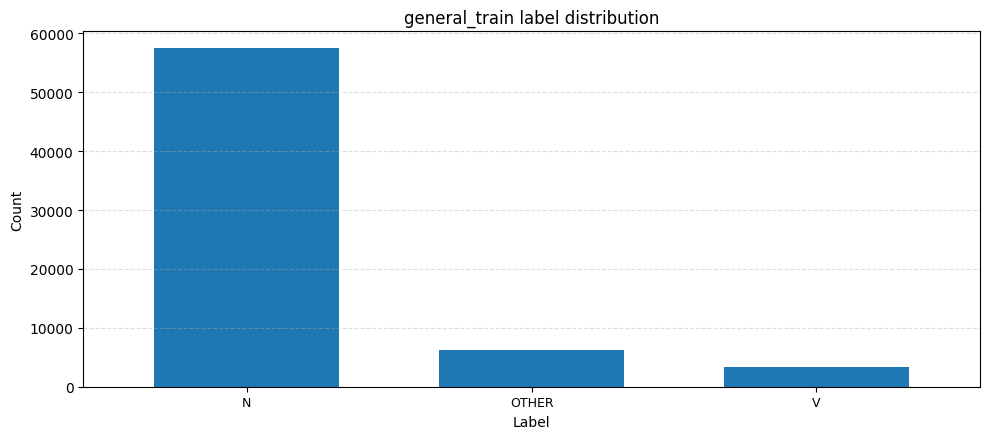

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_train_hist_record_id.png


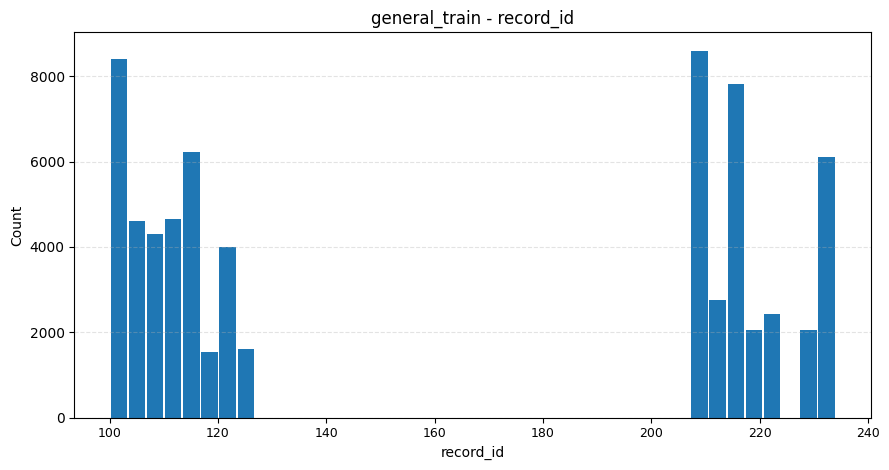

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_train_hist_mean.png


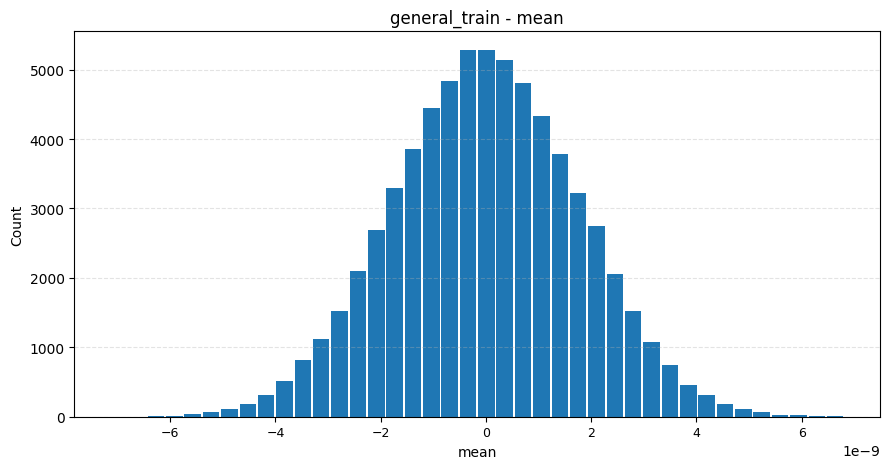

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_train_hist_std.png


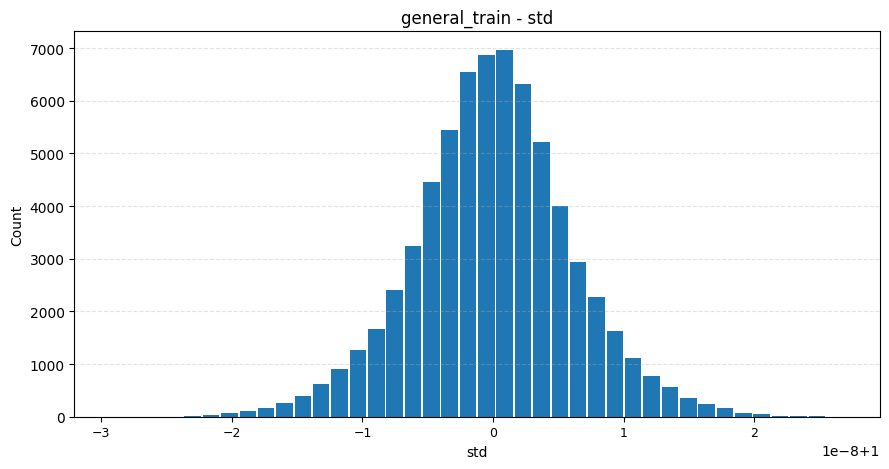

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_train_hist_min.png


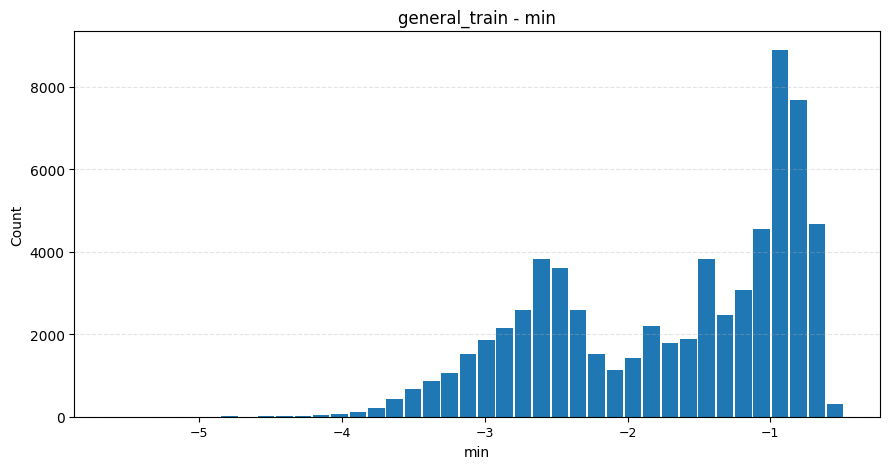

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_train_hist_max.png


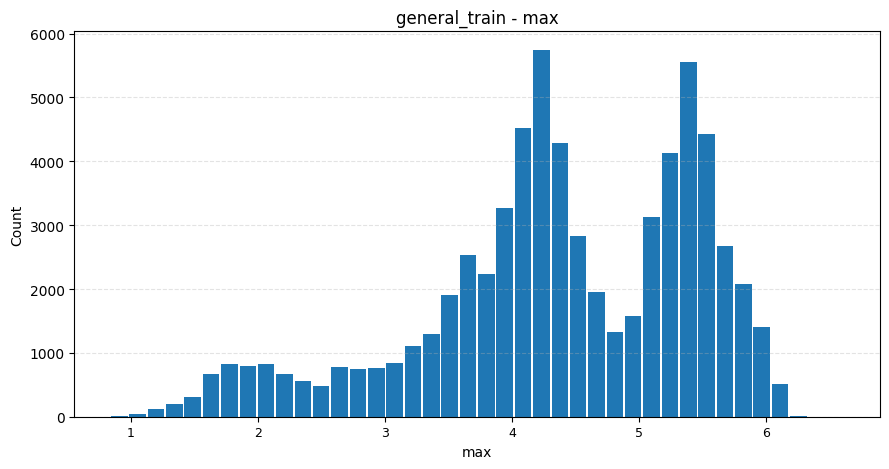

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_train_hist_ptp.png


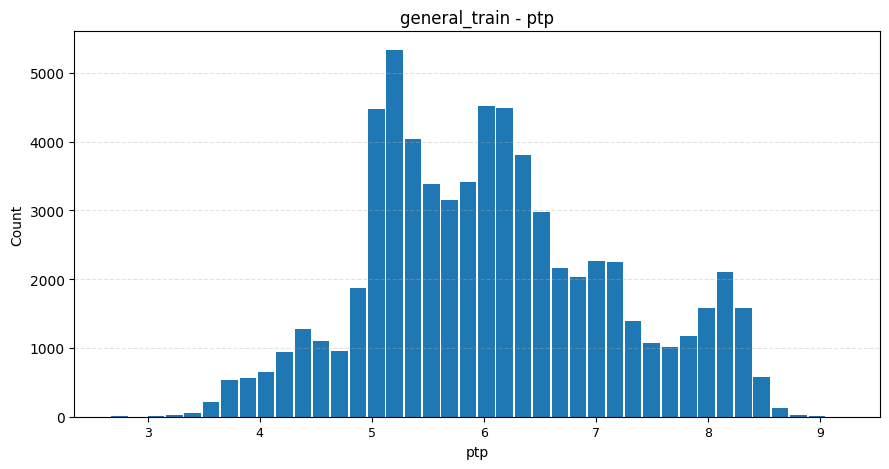

[INFO] Reporting general/val: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_general/val_general_features.csv | shape=(19790, 29)
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_label_distribution.png


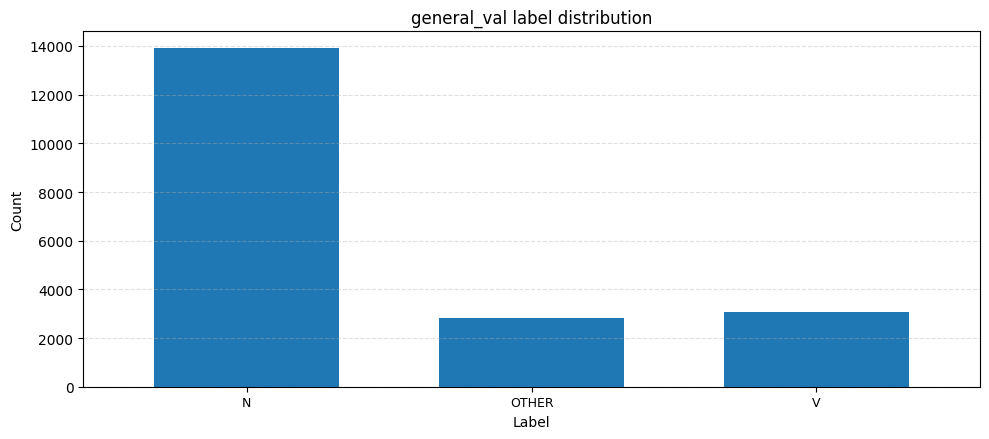

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_hist_record_id.png


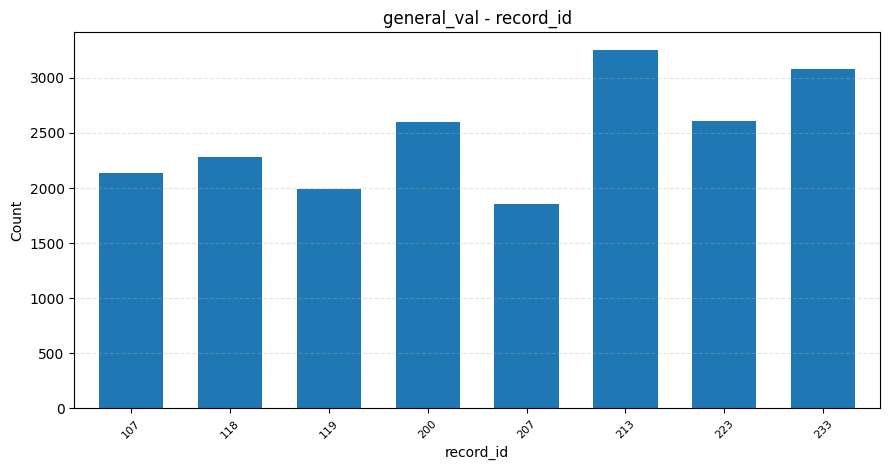

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_hist_mean.png


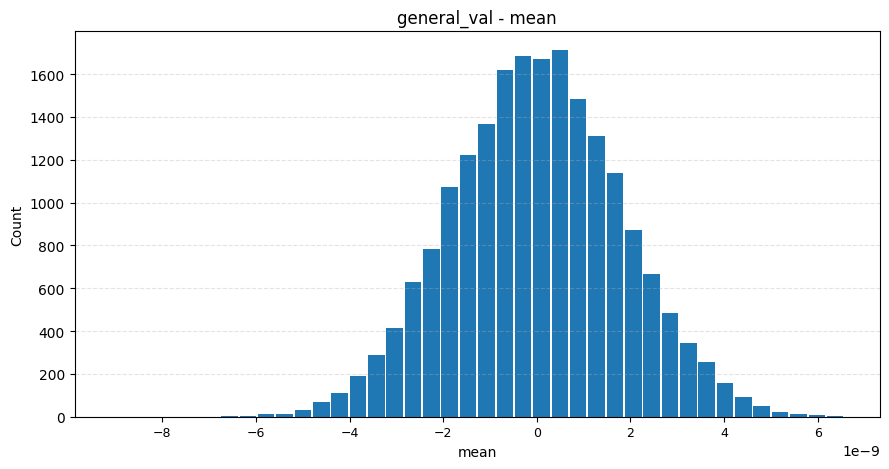

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_hist_std.png


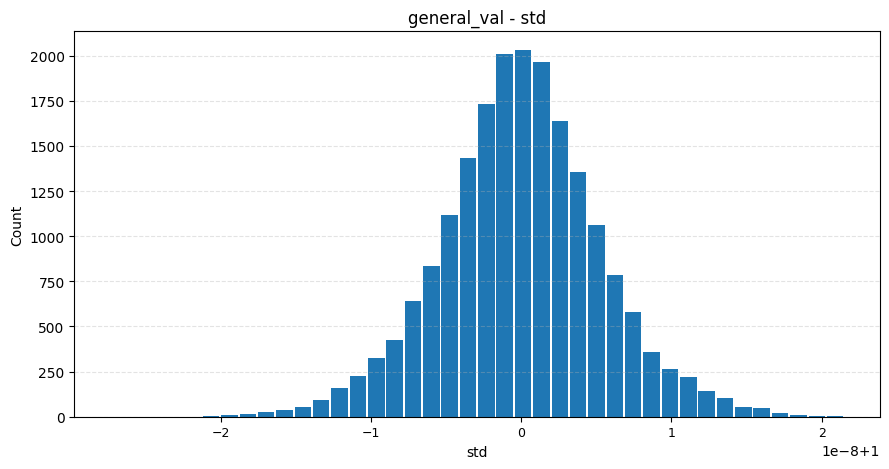

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_hist_min.png


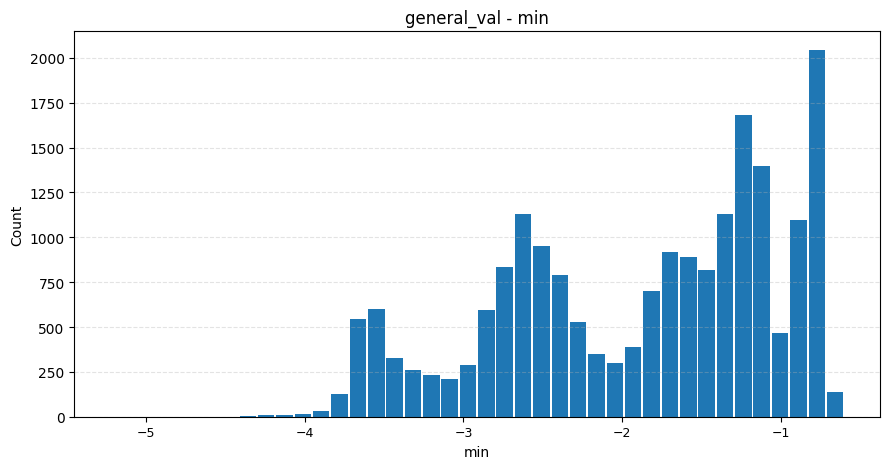

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_hist_max.png


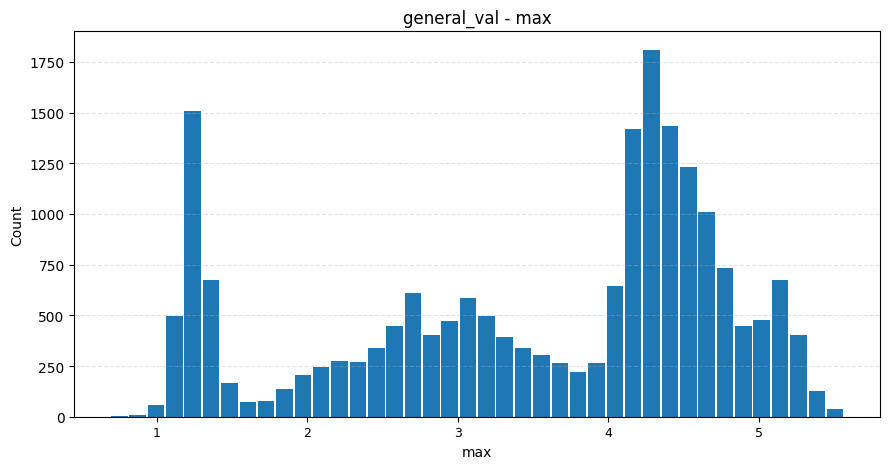

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_val_hist_ptp.png


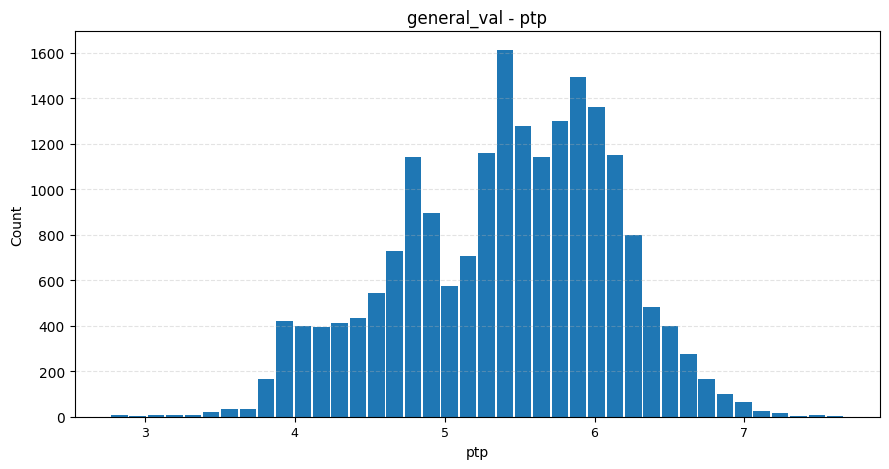

[INFO] Reporting general/test: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_general/test_general_features.csv | shape=(22503, 29)
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_label_distribution.png


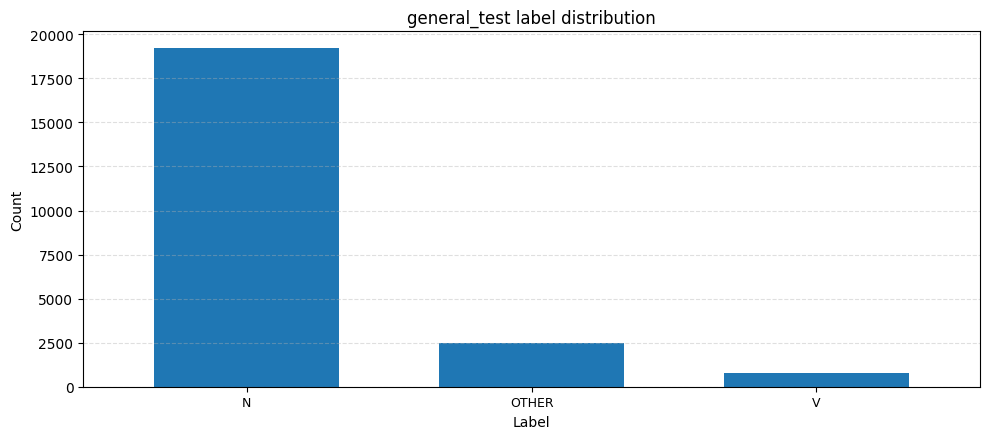

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_hist_record_id.png


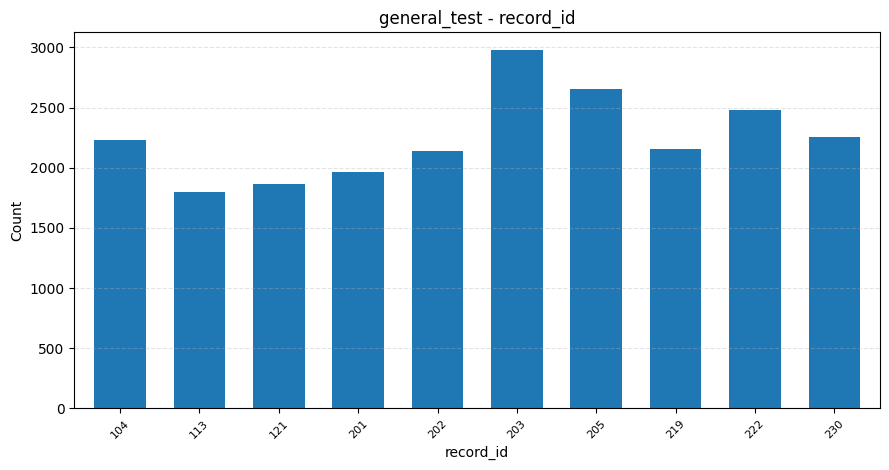

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_hist_mean.png


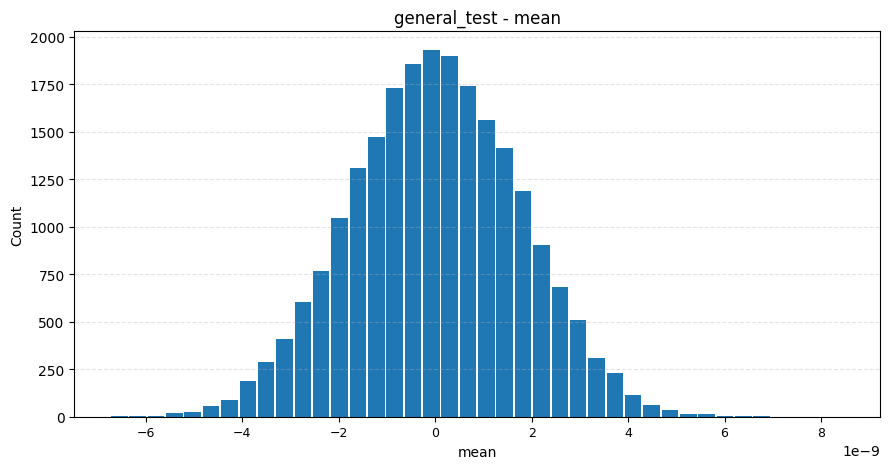

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_hist_std.png


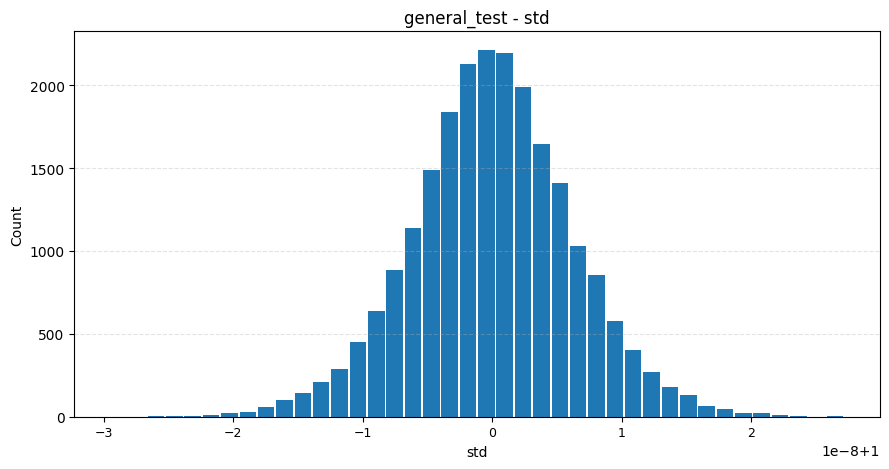

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_hist_min.png


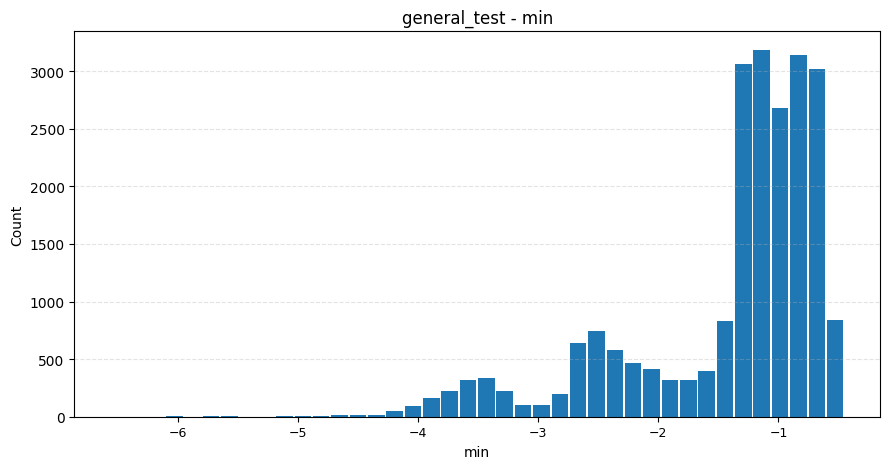

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_hist_max.png


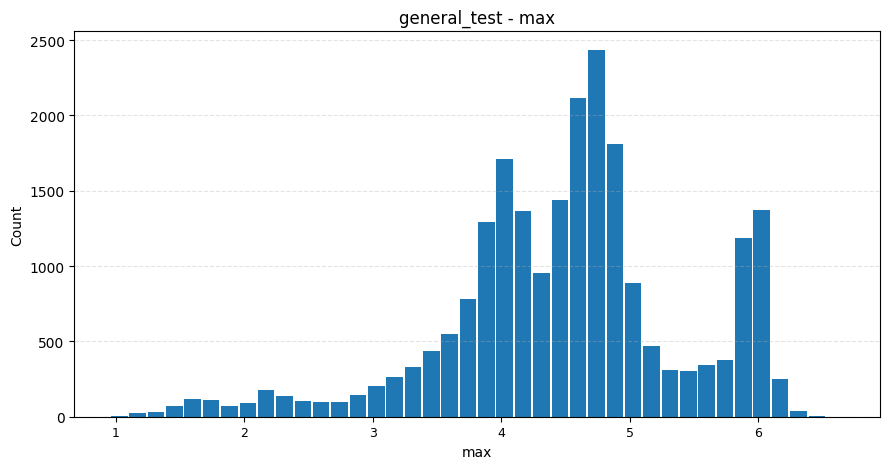

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/general_test_hist_ptp.png


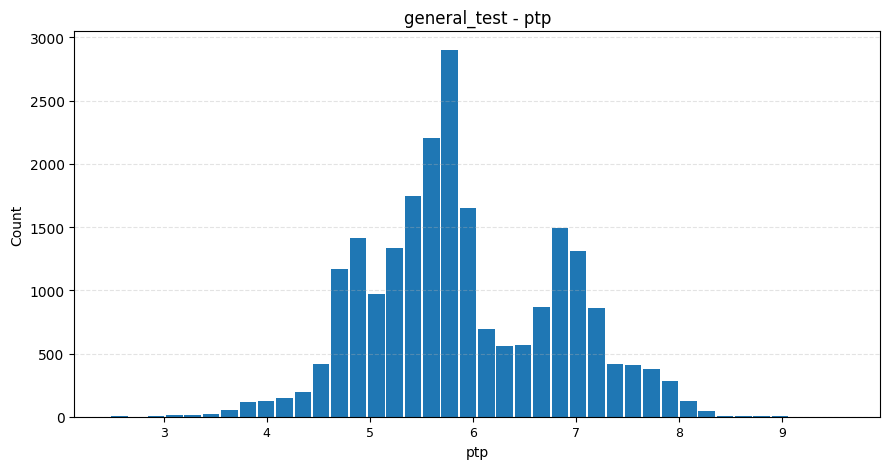

[INFO] Reporting morphology/train: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_morphology/train_morphology_features.csv | shape=(67160, 36)
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_label_distribution.png


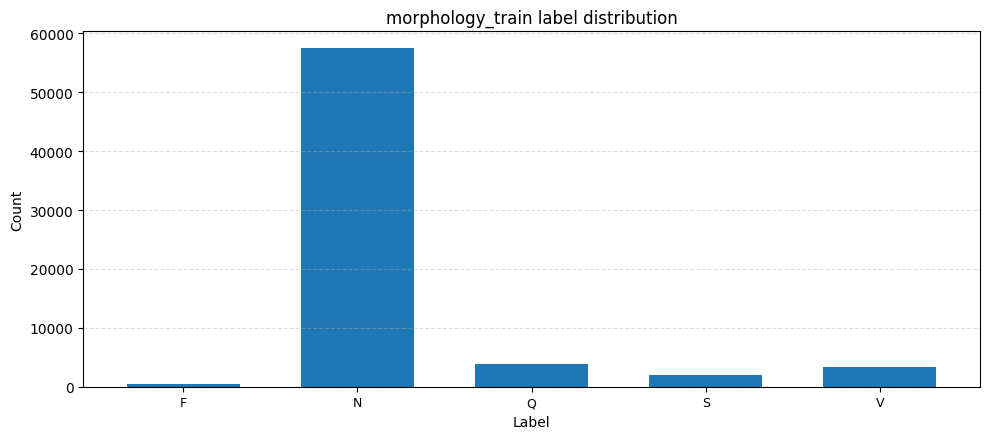

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_hist_record_id.png


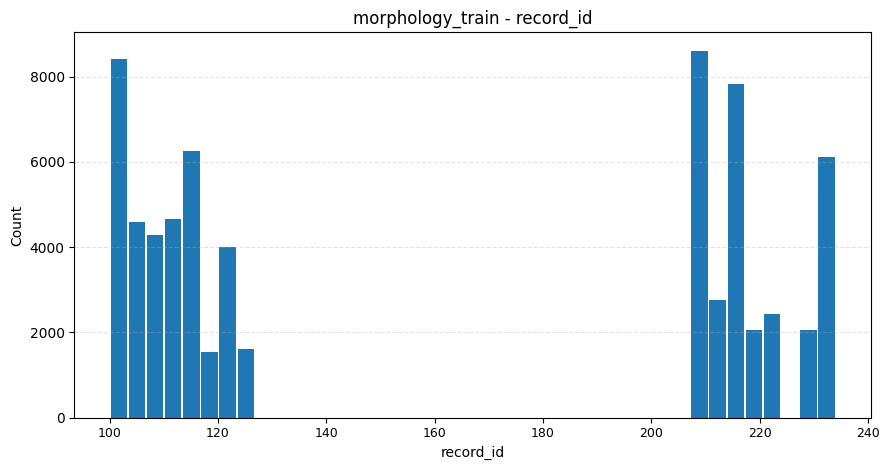

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_hist_beat_len.png


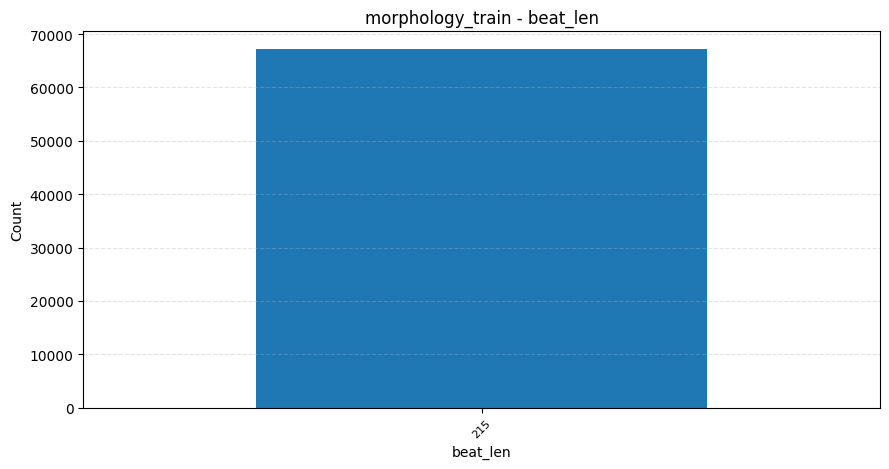

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_hist_beat_center_sample.png


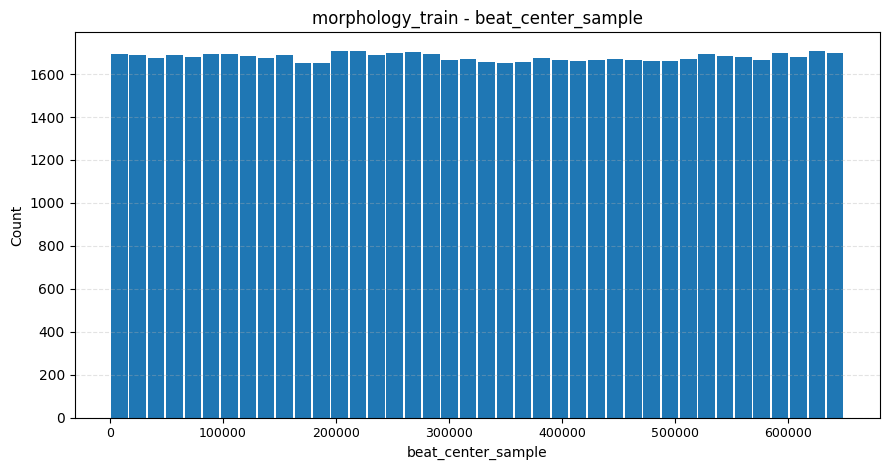

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_hist_rr_prev.png


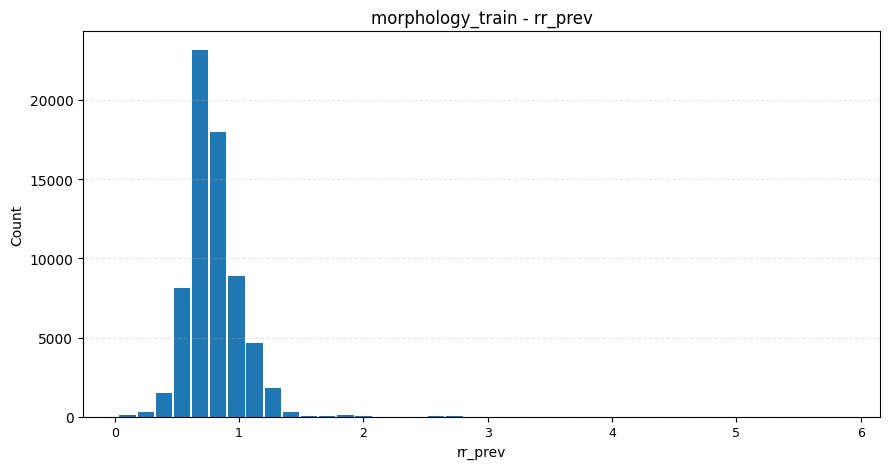

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_hist_rr_next.png


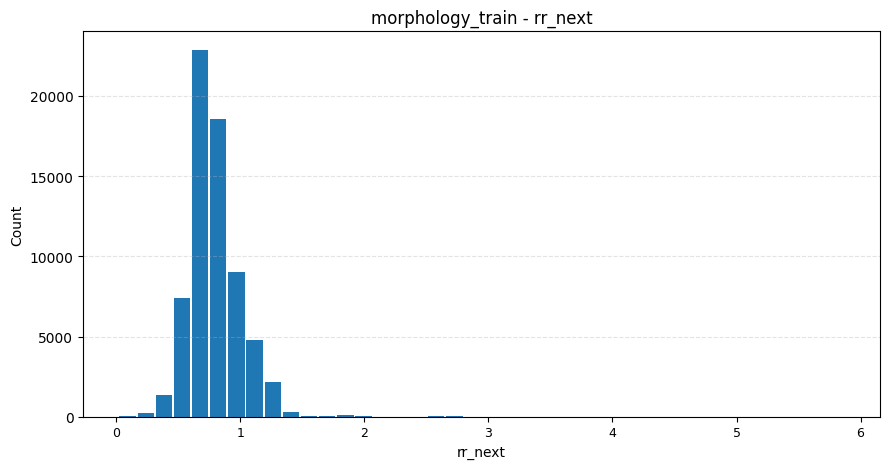

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_train_hist_r_amp.png


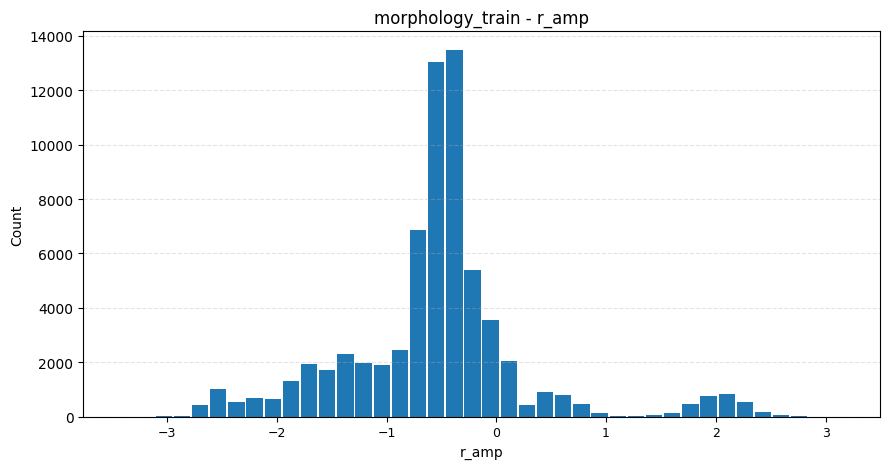

[INFO] Reporting morphology/val: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_morphology/val_morphology_features.csv | shape=(19792, 36)
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_label_distribution.png


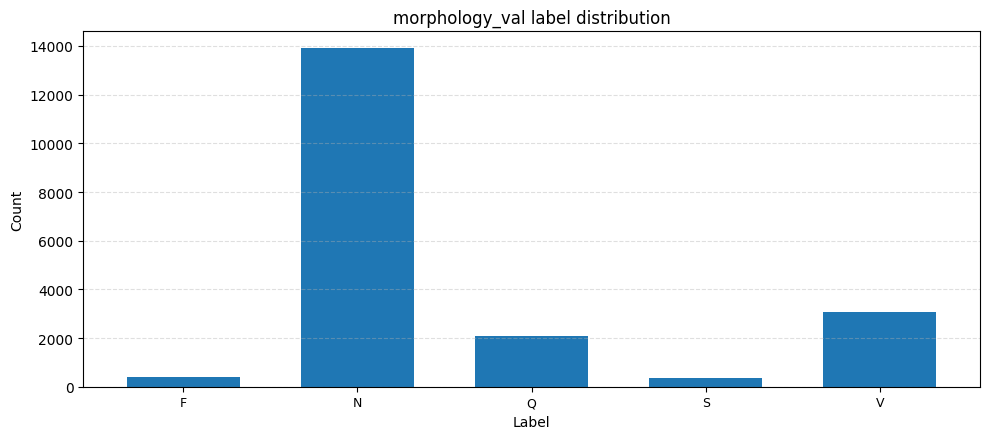

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_hist_record_id.png


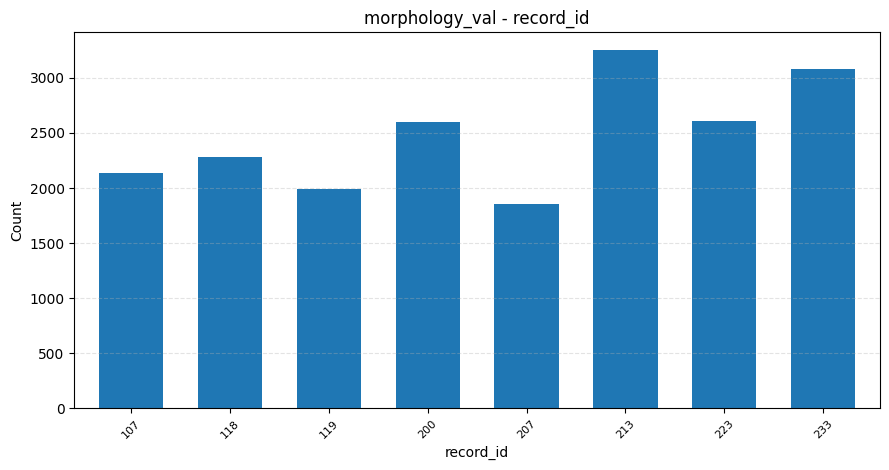

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_hist_beat_len.png


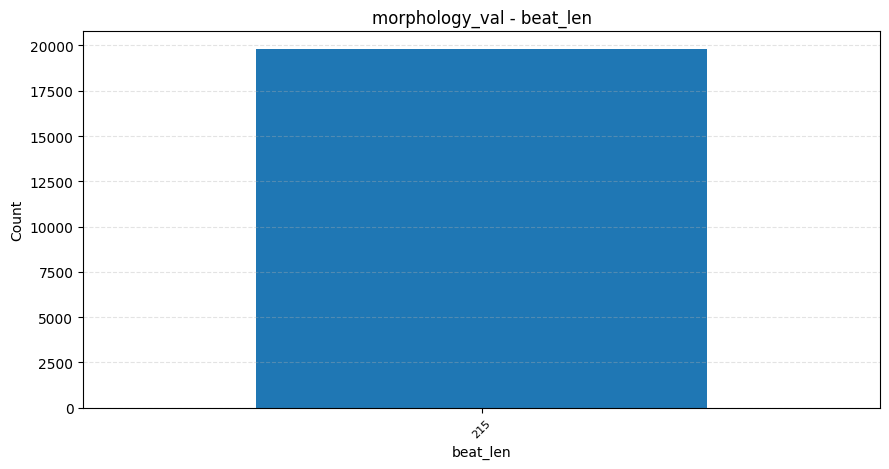

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_hist_beat_center_sample.png


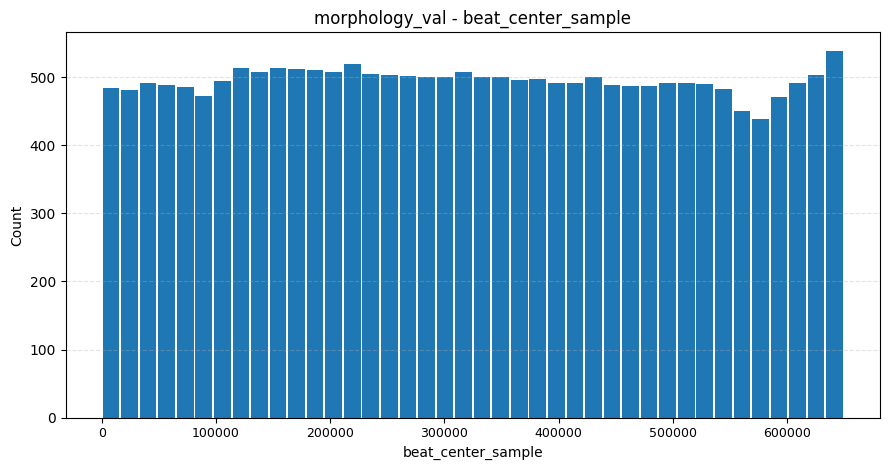

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_hist_rr_prev.png


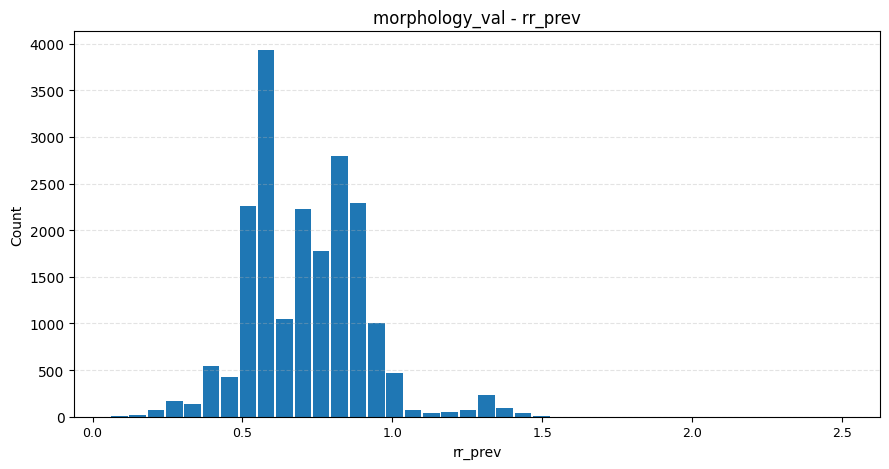

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_hist_rr_next.png


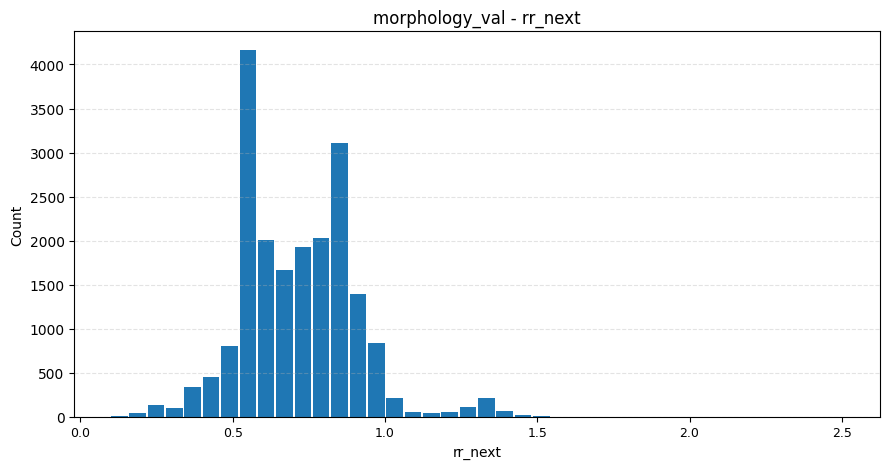

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_val_hist_r_amp.png


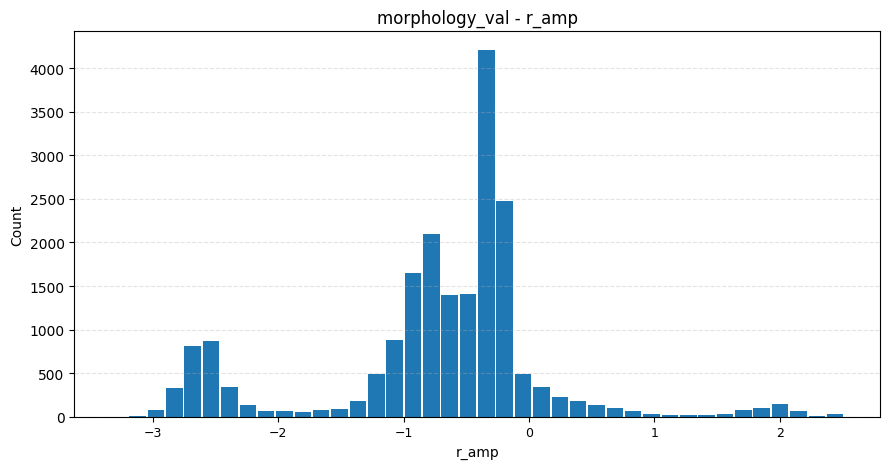

[INFO] Reporting morphology/test: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_morphology/test_morphology_features.csv | shape=(22508, 36)
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_label_distribution.png


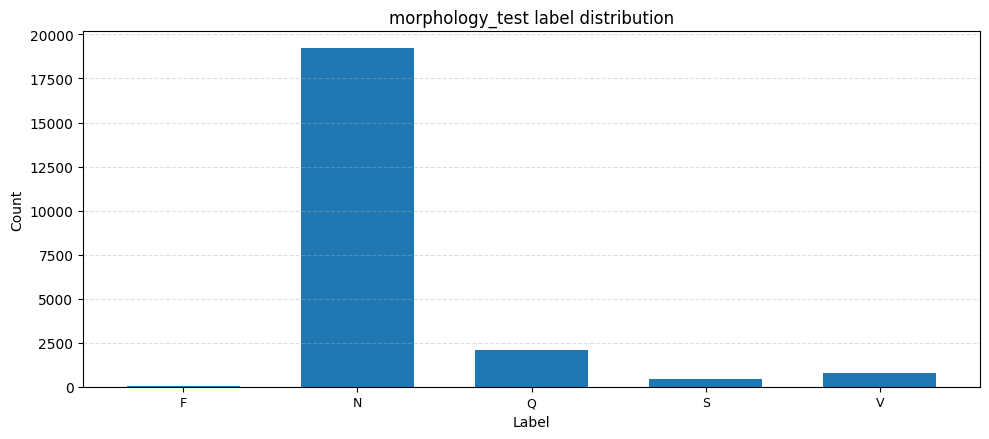

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_hist_record_id.png


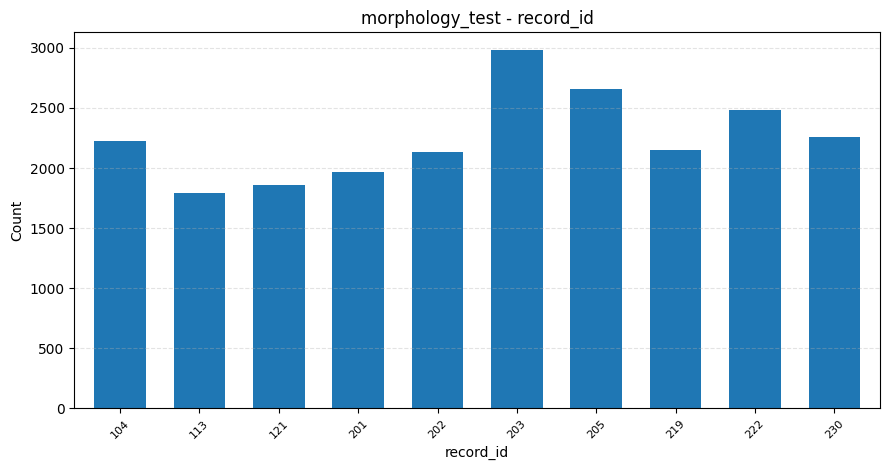

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_hist_beat_len.png


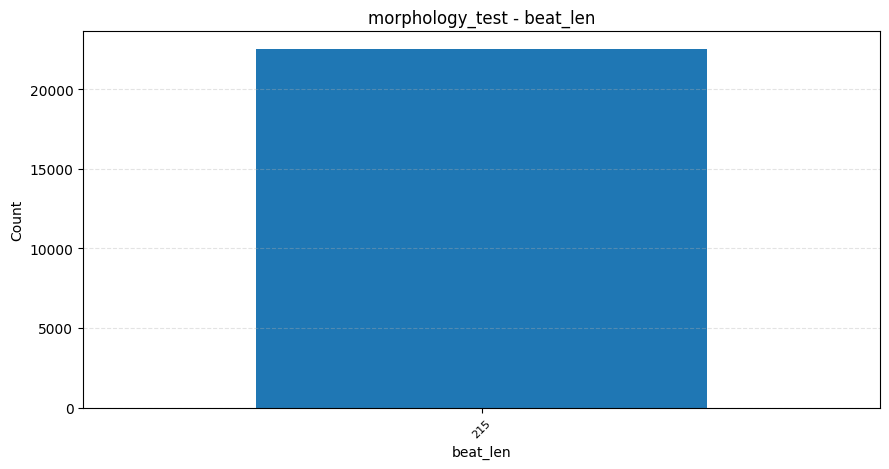

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_hist_beat_center_sample.png


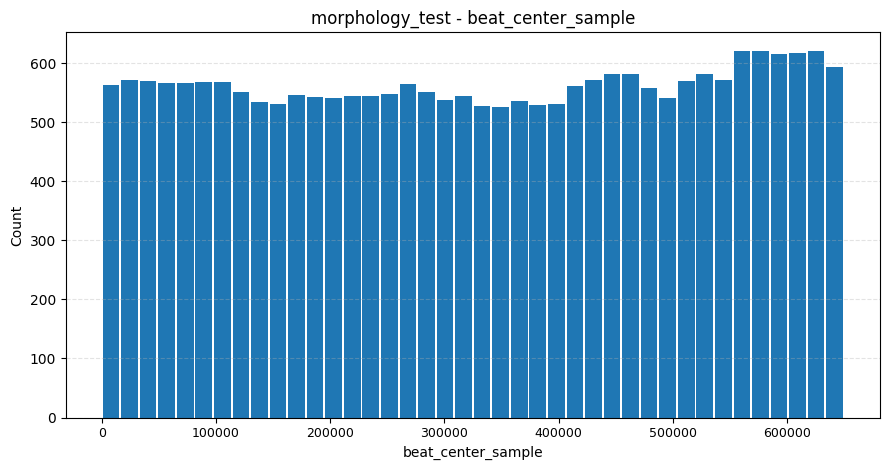

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_hist_rr_prev.png


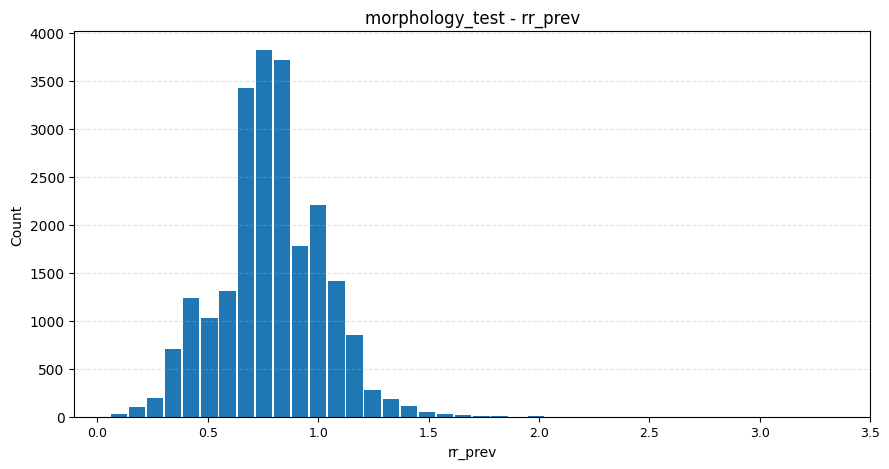

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_hist_rr_next.png


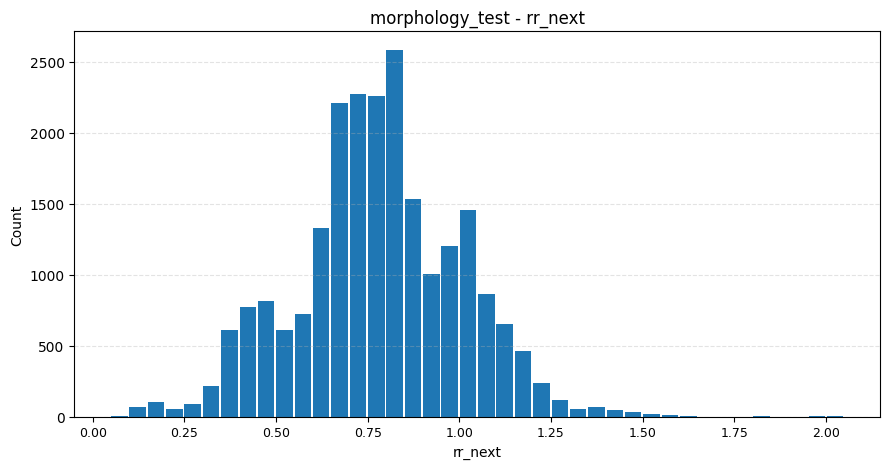

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/morphology_test_hist_r_amp.png


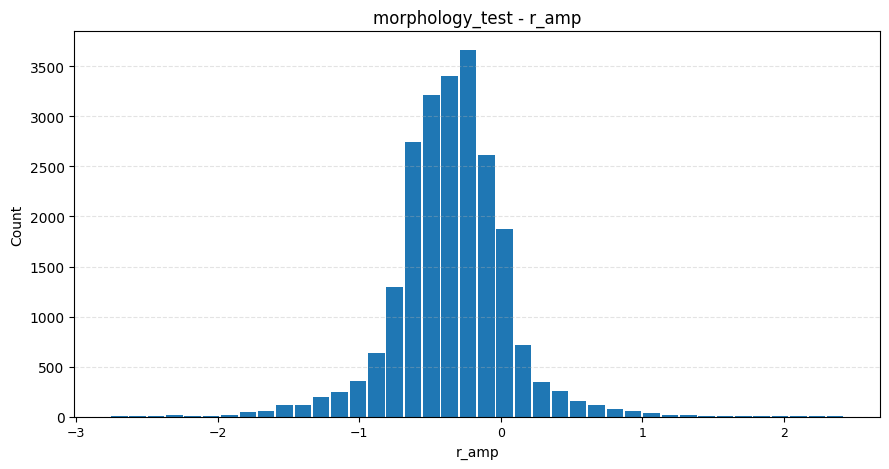

[TABLE] /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/feature_report_summary.csv
[OK] Feature report JSON: /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/report_input_features.json
[OK] Feature report summary: /content/ECG/outputs/ternary_n_v_other/mitbih_feature_reports/feature_report_summary.csv
[DONE] report_features::{"dataset": "mitbih"}
[RUN ] train_featurext::{"dataset": "mitbih"}

Training model: logreg
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_featurext/logreg_train_confusion_matrix.png


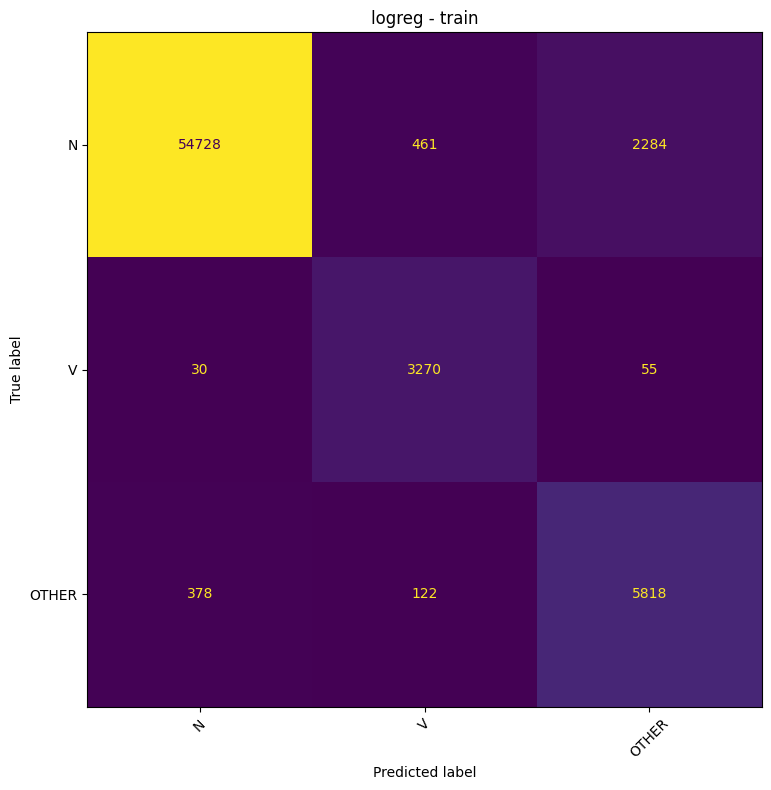

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_featurext/logreg_val_confusion_matrix.png


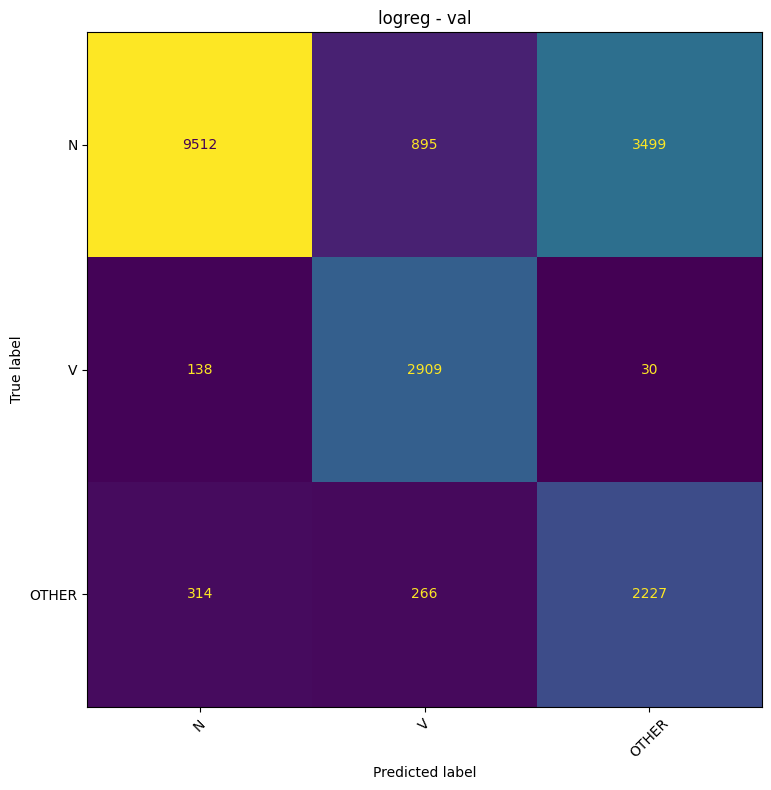

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_featurext/logreg_test_confusion_matrix.png


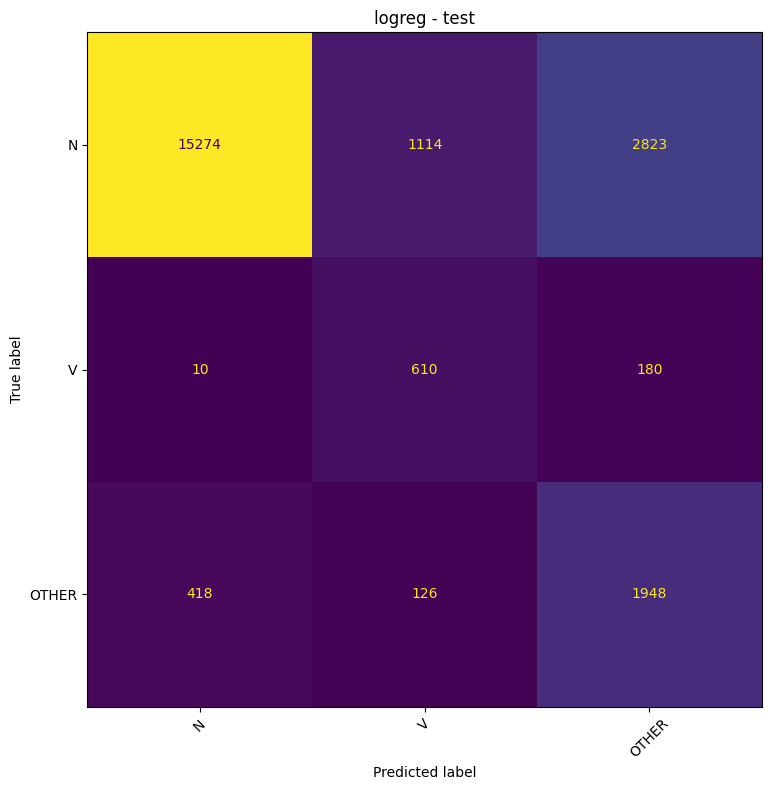


Training model: rf
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_featurext/rf_train_confusion_matrix.png


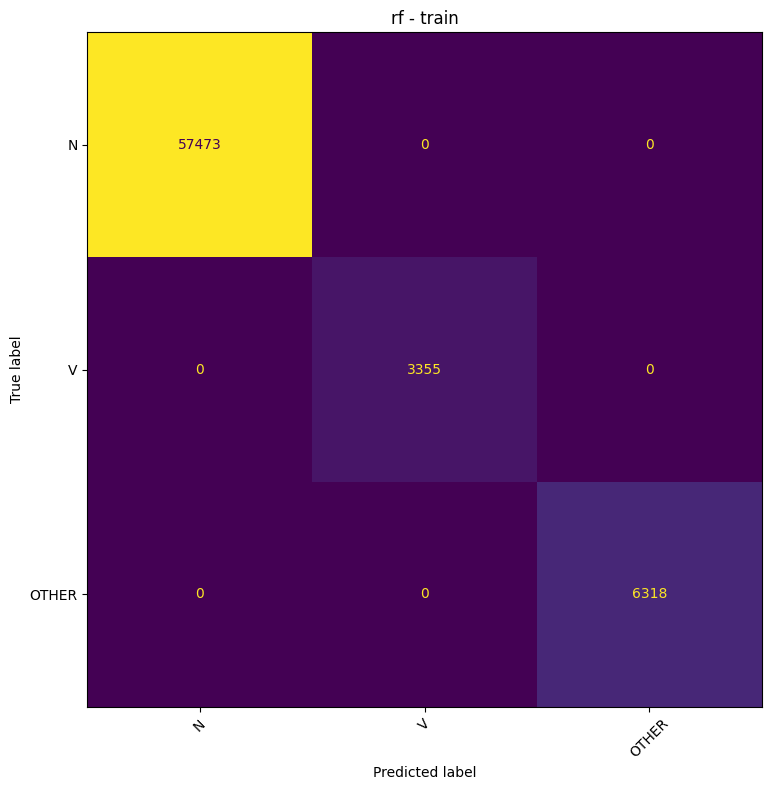

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_featurext/rf_val_confusion_matrix.png


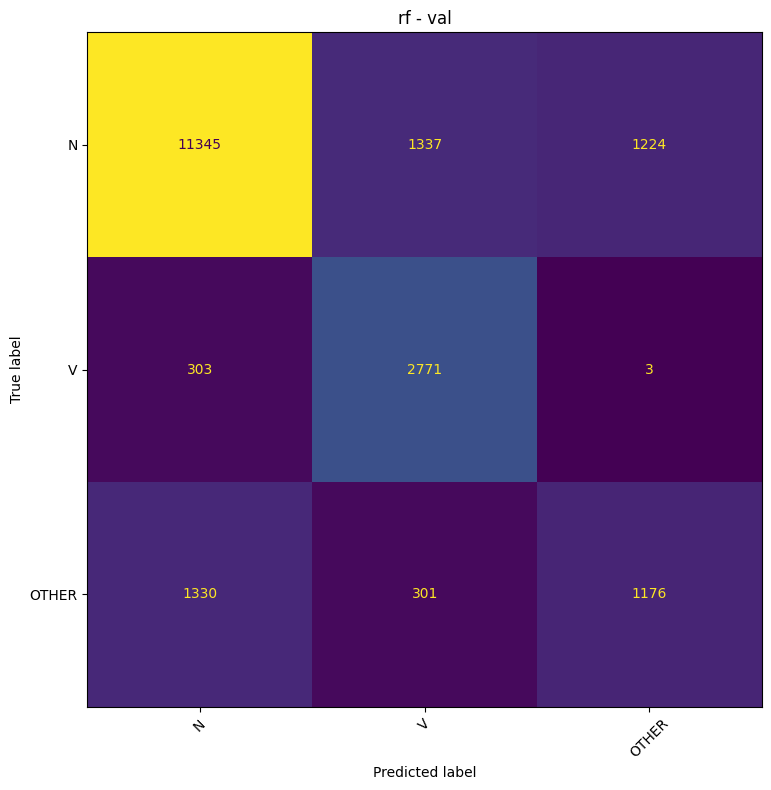

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_featurext/rf_test_confusion_matrix.png


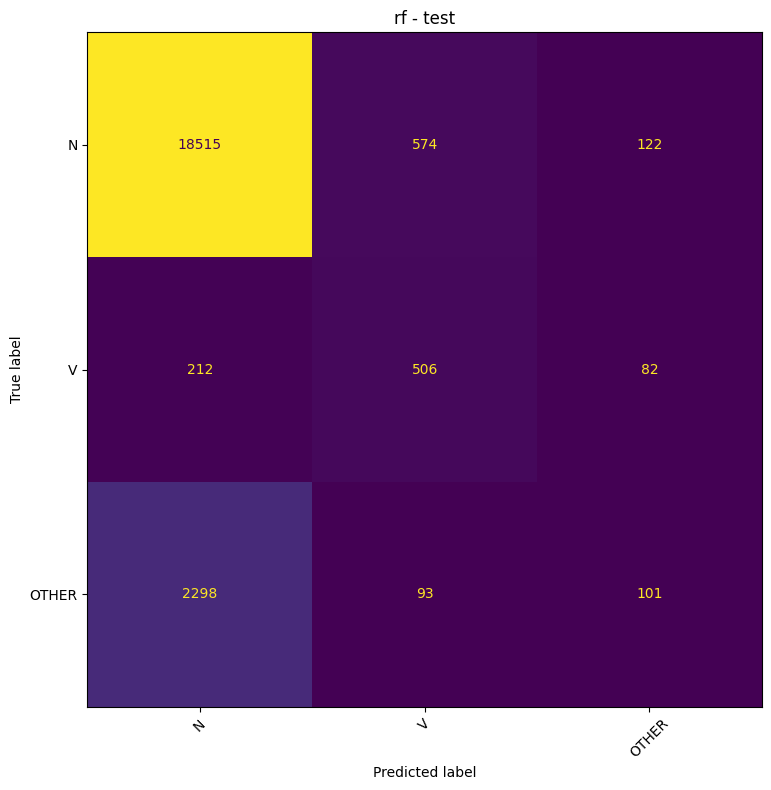

           model  split  n_samples  accuracy  macro_f1  weighted_f1
0  logreg_mitbih  train      67146  0.950407  0.894398     0.952949
1  logreg_mitbih    val      19790  0.740172  0.710392     0.760370
2  logreg_mitbih   test      22503  0.792428  0.619599     0.821307
3      rf_mitbih  train      67146  1.000000  1.000000     1.000000
4      rf_mitbih    val      19790  0.772713  0.678584     0.772196
5      rf_mitbih   test      22503  0.849753  0.501822     0.811918
[OK] Saved to: /content/ECG/outputs/ternary_n_v_other/mitbih_featurext
[DONE] train_featurext::{"dataset": "mitbih"}
[RUN ] plot_dataset_tsne::{"dataset": "mitbih"}
Starting t-SNE visualization for mitbih splits...
[INFO] Dataset dir: /content/ECG/data/interim/ternary_n_v_other/mitbih_beats
[INFO] Results dir: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne
Processing dataset: mitbih
Processing split:   train
Input file:         /content/ECG/data/interim/ternary_n_v_other/mitbih_beats/train.npz
Original X shape: (67

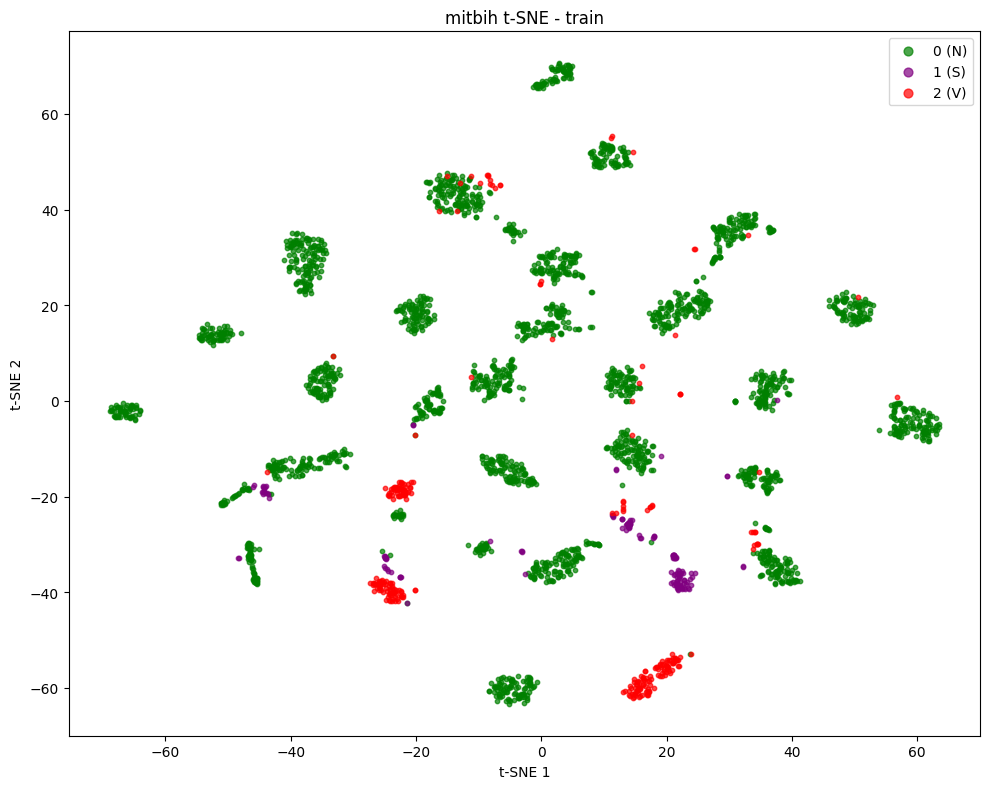

Saved plot: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_train.png
Processing dataset: mitbih
Processing split:   val
Input file:         /content/ECG/data/interim/ternary_n_v_other/mitbih_beats/val.npz
Original X shape: (19790, 215)
Original y shape: (19790,)
Label distribution:
  0 (N): 13906
  1 (S): 3077
  2 (V): 2807
Flattened X shape: (19790, 215)
Subsampled X shape: (3000, 215)
Subsampled y shape: (3000,)
Label distribution:
  0 (N): 2109
  1 (S): 466
  2 (V): 425
Running t-SNE...
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_val.png


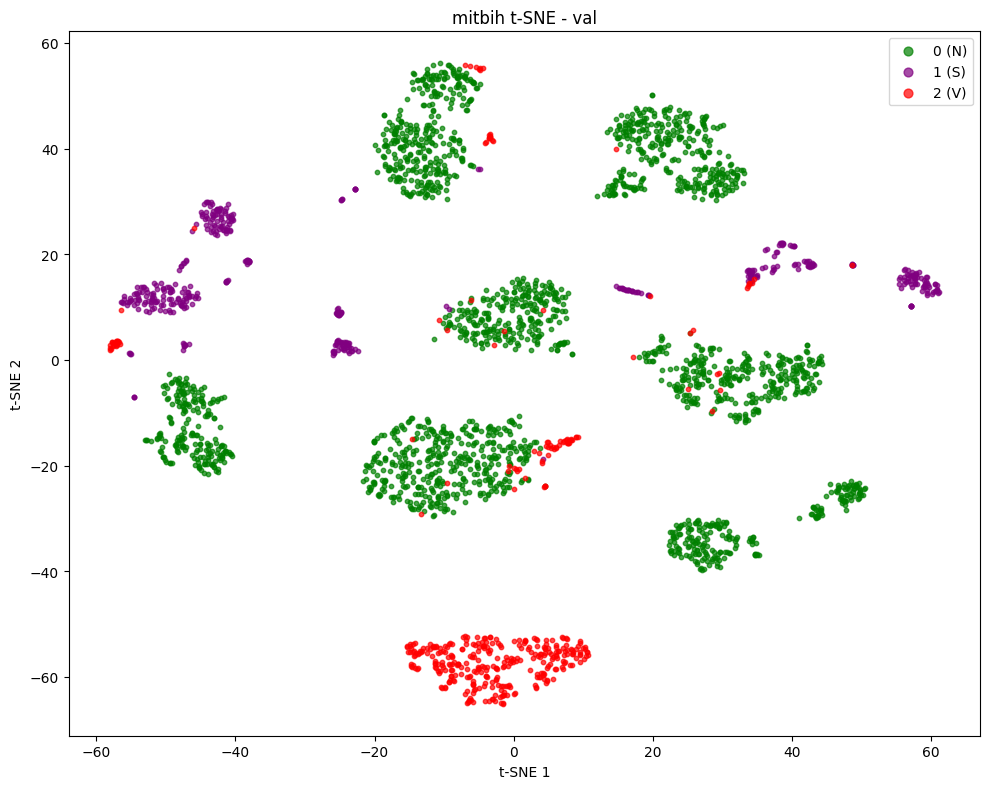

Saved plot: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_val.png
Processing dataset: mitbih
Processing split:   test
Input file:         /content/ECG/data/interim/ternary_n_v_other/mitbih_beats/test.npz
Original X shape: (22503, 215)
Original y shape: (22503,)
Label distribution:
  0 (N): 19211
  1 (S): 800
  2 (V): 2492
Flattened X shape: (22503, 215)
Subsampled X shape: (3000, 215)
Subsampled y shape: (3000,)
Label distribution:
  0 (N): 2562
  1 (S): 106
  2 (V): 332
Running t-SNE...
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_test.png


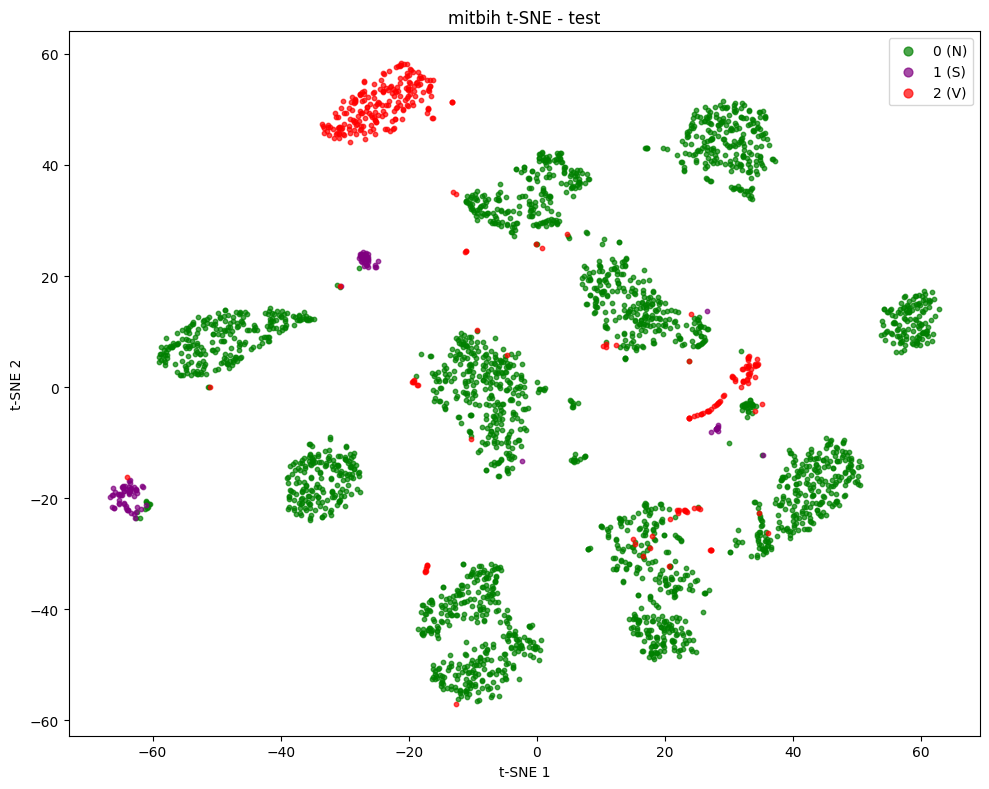

Saved plot: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_test.png
Done.
[DONE] plot_dataset_tsne::{"dataset": "mitbih"}
[RUN ] plot_tsne_featurext_vs_cnn::{"dataset": "mitbih"}
Starting featurext vs CNN t-SNE comparison...
Dataset dir: /content/ECG/data/interim/ternary_n_v_other/mitbih_beats
Feature dir: /content/ECG/data/interim/ternary_n_v_other/mitbih_features_general
Results dir: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne
Processing split: train
Merged sample count: 67146
Subsampled count:    3000
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_featurext_vs_cnn_train.png


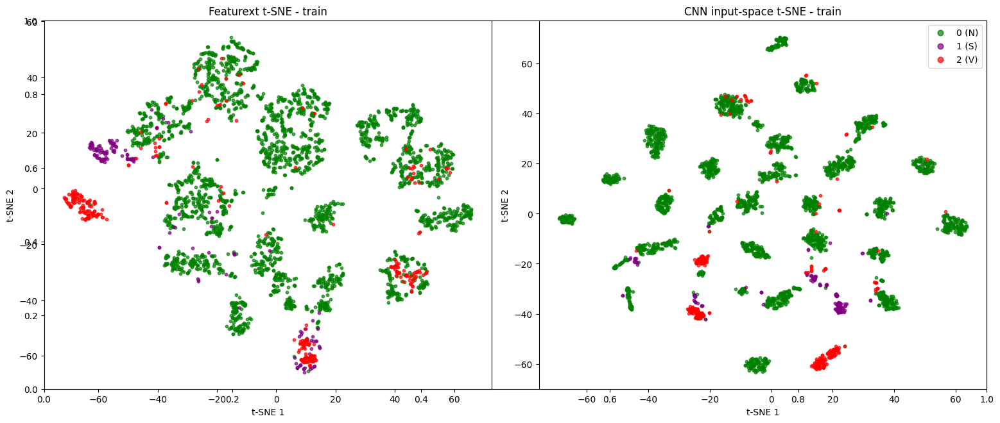

Saved plot: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_featurext_vs_cnn_train.png
Saved table: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_featurext_vs_cnn_train.csv
Processing split: val
Merged sample count: 19790
Subsampled count:    3000
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_featurext_vs_cnn_val.png


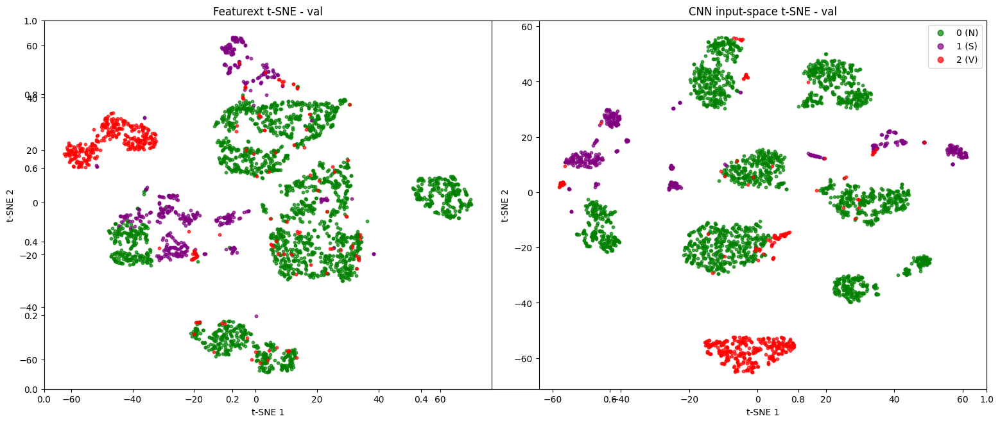

Saved plot: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_featurext_vs_cnn_val.png
Saved table: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_featurext_vs_cnn_val.csv
Processing split: test
Merged sample count: 22503
Subsampled count:    3000
[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_featurext_vs_cnn_test.png


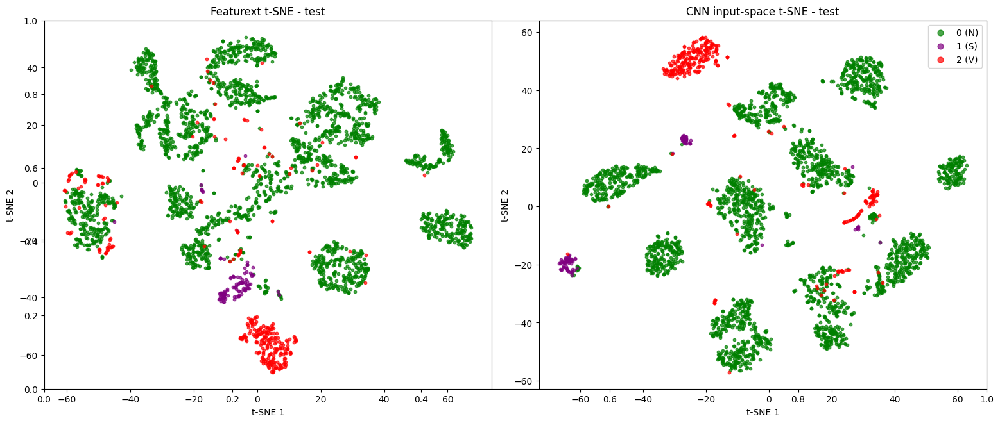

Saved plot: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_featurext_vs_cnn_test.png
Saved table: /content/ECG/outputs/ternary_n_v_other/mitbih_tsne/tsne_featurext_vs_cnn_test.csv
Done.
[DONE] plot_tsne_featurext_vs_cnn::{"dataset": "mitbih"}
[RUN ] train_cnn::{"dataset": "mitbih"}
Epoch 1/20
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.7372 - loss: 0.5974 — val_macro_f1: 0.089759
132/132 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - accuracy: 0.8200 - loss: 0.4332 - val_accuracy: 0.1555 - val_loss: 2.7498 - val_macro_f1: 0.0898 - learning_rate: 0.0010
Epoch 2/20
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8539 - loss: 0.4470 — val_macro_f1: 0.491206
132/132 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8698 - loss: 0.3614 - val_accuracy: 0.7219 - val_loss: 0.6880 - val_macro_f1: 0.4912 - learning_rate: 0.0010
Epoch 3/20
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8577 - loss: 0.4378 — val_macro_f1: 0.491206 (előző érték megtartva)
132/132 ━━━━━━━━━━━━

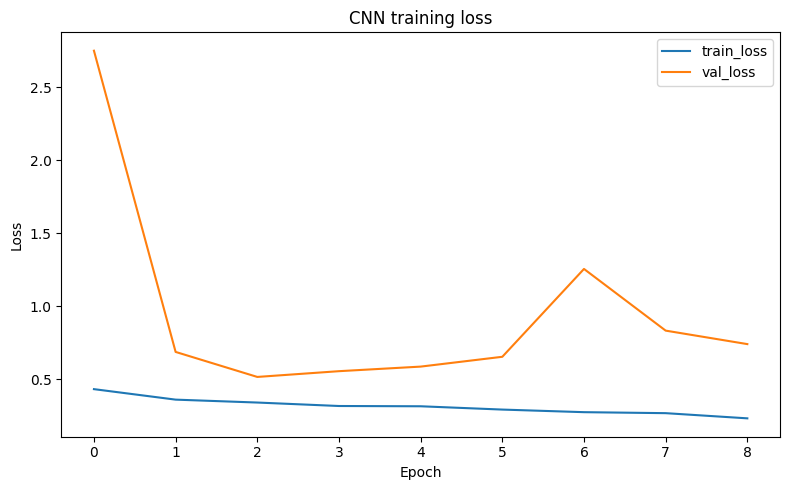

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/training_accuracy.png


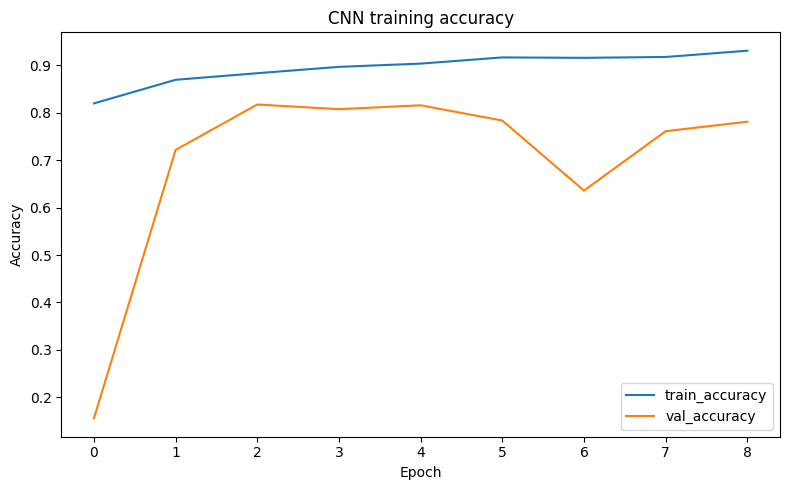

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/validation_macro_f1.png


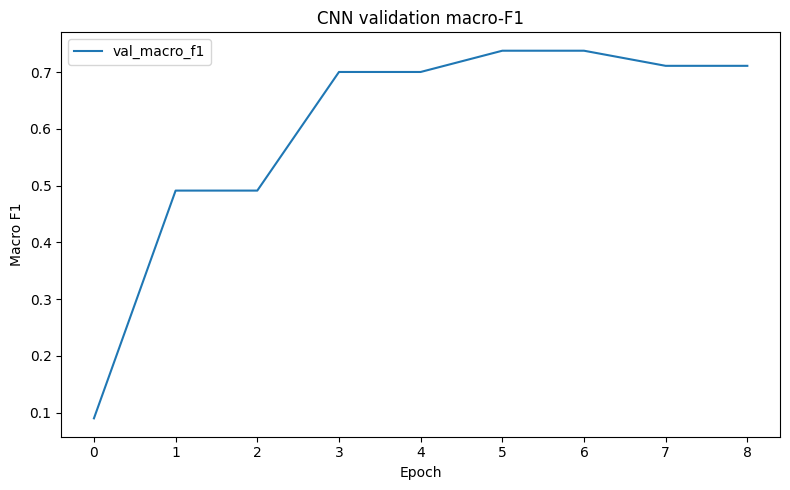

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/cnn_train_confusion_matrix.png


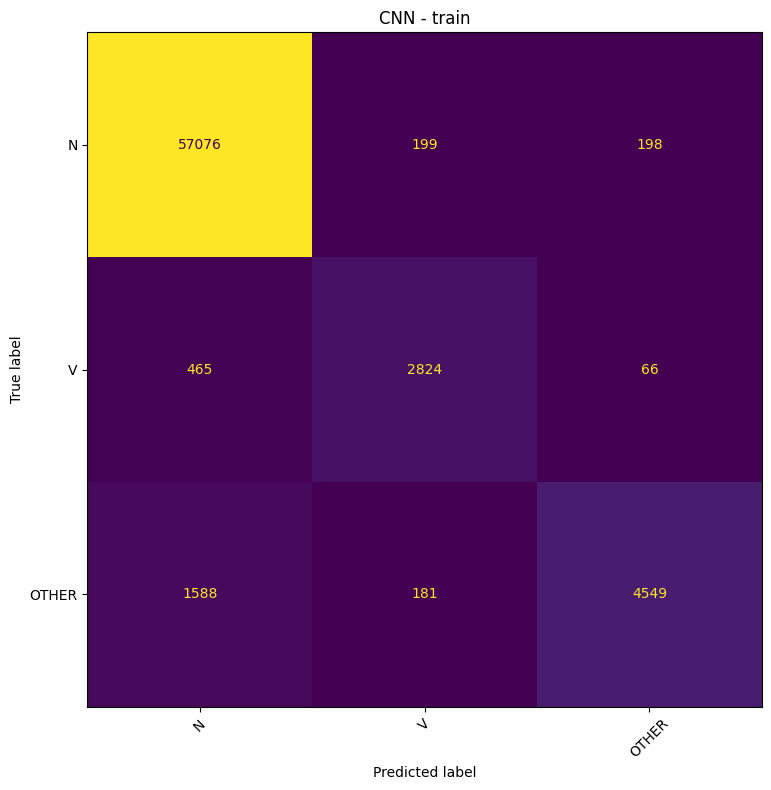

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/cnn_val_confusion_matrix.png


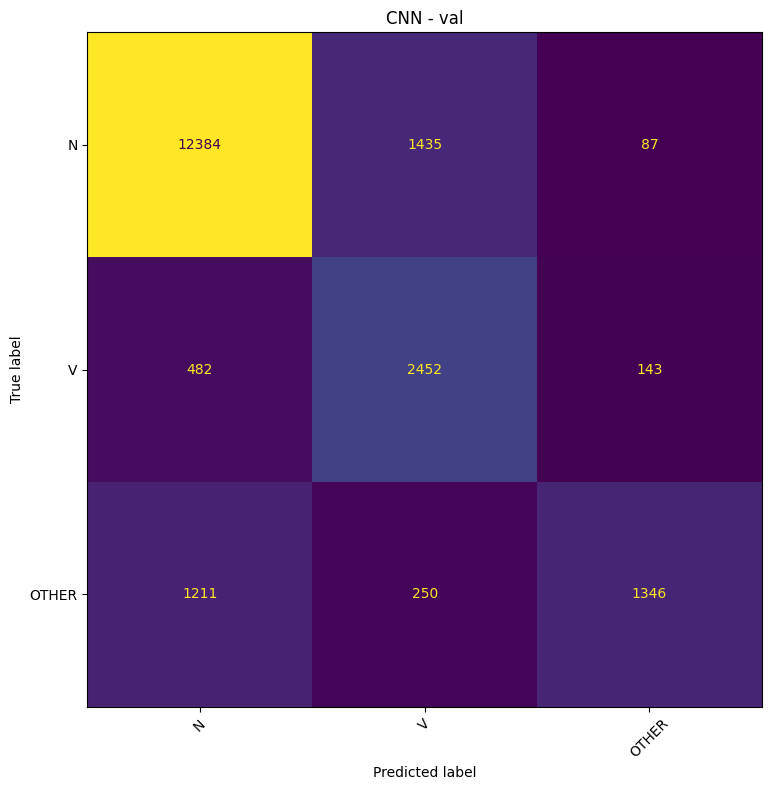

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/cnn_test_confusion_matrix.png


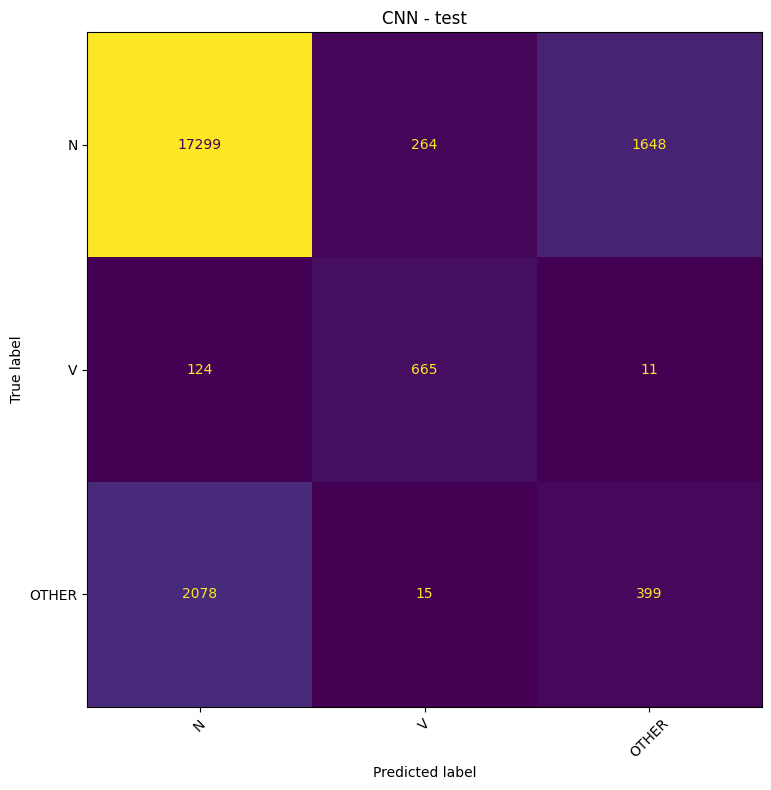

            model  split  n_samples  accuracy  macro_f1  weighted_f1  \
0  cnn_mitbih_1ch  train      67146  0.959834  0.885817     0.957890   
1  cnn_mitbih_1ch    val      19790  0.817686  0.726363     0.814758   
2  cnn_mitbih_1ch   test      22503  0.816025  0.610576     0.809517   

   macro_precision  macro_recall  
0         0.930609      0.851609  
1         0.775498      0.722315  
2         0.595136      0.630612  
[OK] Saved outputs to: /content/ECG/outputs/ternary_n_v_other/mitbih_cnn
[DONE] train_cnn::{"dataset": "mitbih"}
[RUN ] prepare_mitbih_datasets_2ch::{}
[BUILD-2CH] 217
[BUILD-2CH] 210
[BUILD-2CH] 105
[BUILD-2CH] 116
[BUILD-2CH] 209
[BUILD-2CH] 212
[BUILD-2CH] 214
[BUILD-2CH] 109
[BUILD-2CH] 122
[BUILD-2CH] 108
[BUILD-2CH] 215
[BUILD-2CH] 114
[BUILD-2CH] 208
[BUILD-2CH] 103
[BUILD-2CH] 220
[BUILD-2CH] 231
[BUILD-2CH] 106
[BUILD-2CH] 124
[BUILD-2CH] 115
[BUILD-2CH] 221
[BUILD-2CH] 228
[BUILD-2CH] 102
[BUILD-2CH] 234
[BUILD-2CH] 117
[BUILD-2CH] 123
[BUILD-2CH] 112
[BU

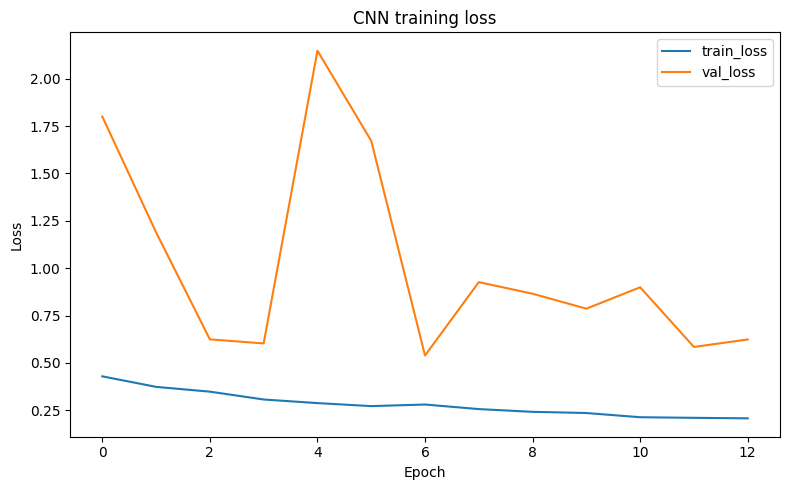

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/training_accuracy.png


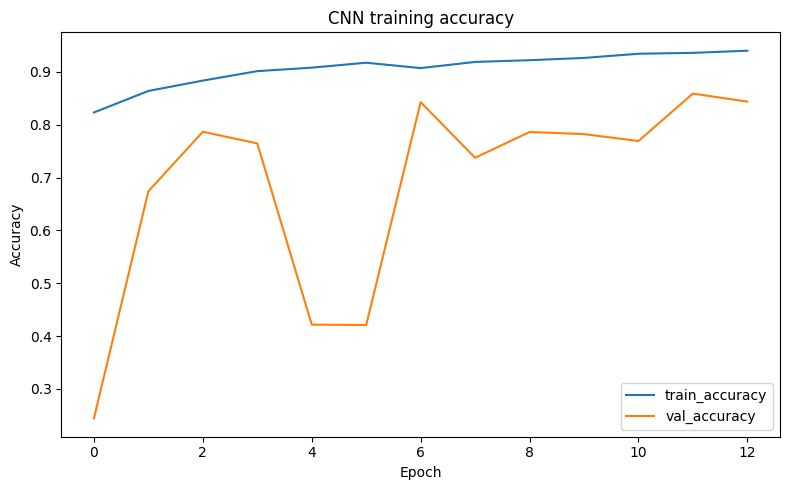

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/validation_macro_f1.png


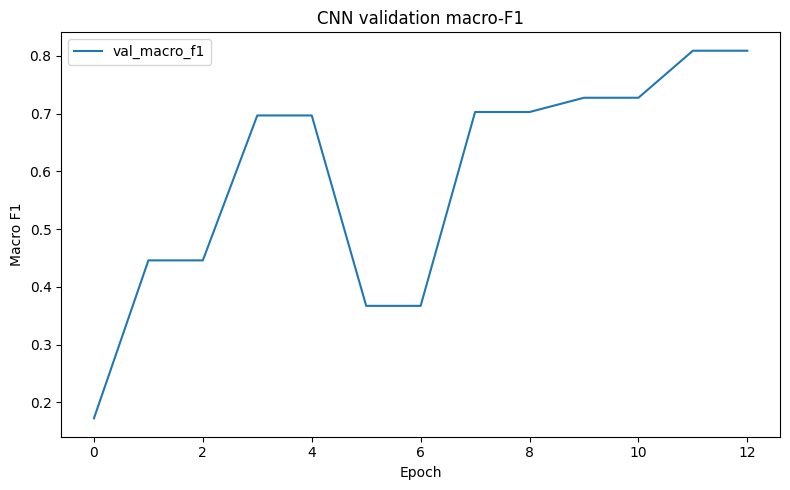

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/cnn_train_confusion_matrix.png


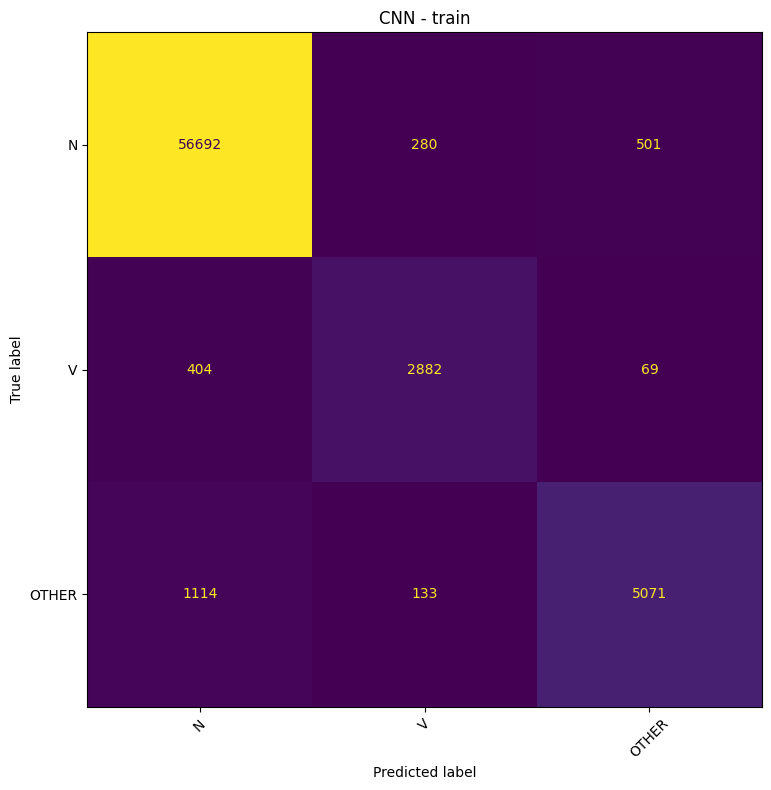

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/cnn_val_confusion_matrix.png


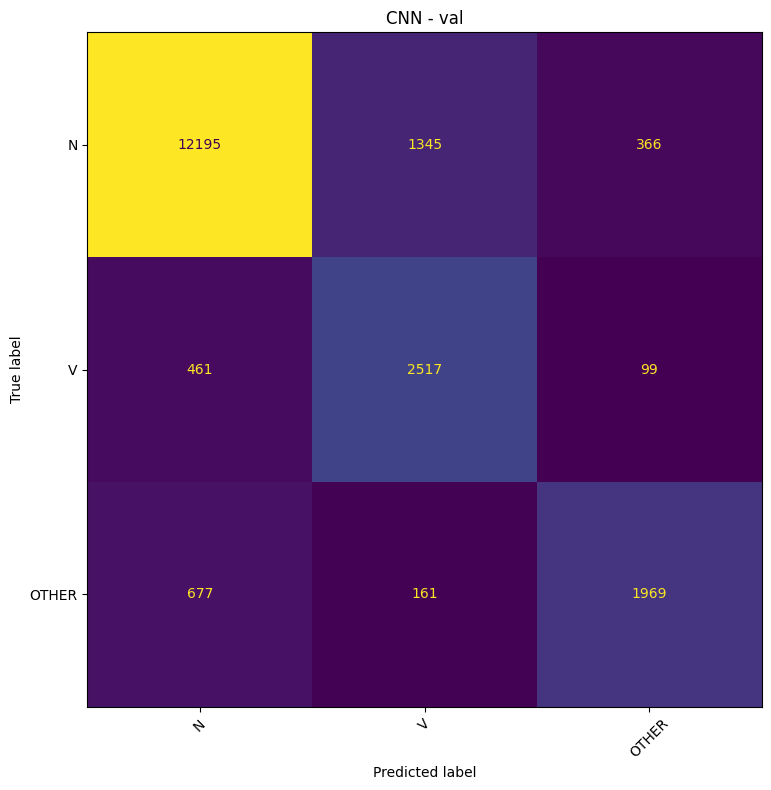

[FIGURE] /content/ECG/outputs/ternary_n_v_other/mitbih_cnn/cnn_test_confusion_matrix.png


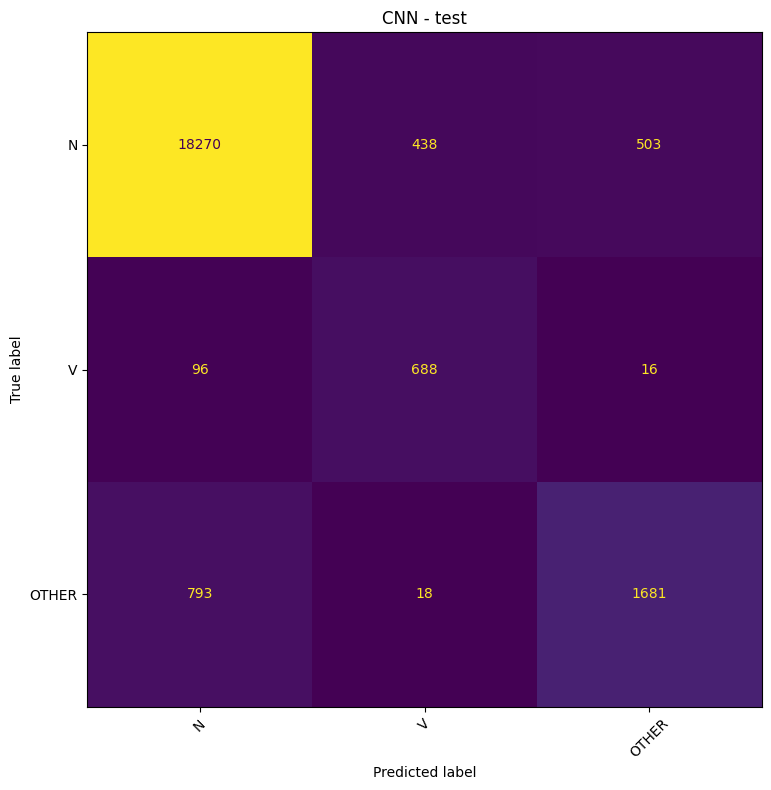

            model  split  n_samples  accuracy  macro_f1  weighted_f1  \
0  cnn_mitbih_1ch  train      67146  0.962753  0.898319     0.962036   
1  cnn_mitbih_1ch    val      19790  0.842900  0.785268     0.845998   
2  cnn_mitbih_1ch   test      22503  0.917167  0.792221     0.917506   

   macro_precision  macro_recall  
0         0.915845      0.882685  
1         0.783086      0.798808  
2         0.773029      0.828525  
[OK] Saved outputs to: /content/ECG/outputs/ternary_n_v_other/mitbih_cnn
[DONE] train_cnn_2ch::{"dataset": "mitbih", "variant": "2ch"}


In [5]:
SECTION = "mitbih"
COMMON = {"dataset": "mitbih"}

run_step_if_needed(SECTION, qc_dataset_ext, COMMON)
run_step_if_needed(SECTION, plot_preprocessing_comparison, {**COMMON, "record_name": "100"})

# 1ch baseline prepare + feature pipeline
run_step_if_needed(SECTION, prepare_mitbih_datasets)
run_step_if_needed(SECTION, build_general_features, COMMON)
run_step_if_needed(SECTION, build_morphology_features, COMMON)
run_step_if_needed(SECTION, report_features, COMMON)
run_step_if_needed(SECTION, train_featurext, COMMON)
run_step_if_needed(SECTION, plot_dataset_tsne, COMMON)
run_step_if_needed(SECTION, plot_tsne_featurext_vs_cnn, COMMON)
run_step_if_needed(SECTION, train_cnn, COMMON)

# 2ch CNN ág
run_step_if_needed(SECTION, prepare_mitbih_datasets_2ch, step_name="prepare_mitbih_datasets_2ch")
run_step_if_needed(
    SECTION,
    train_cnn,
    {**COMMON, "variant": "2ch"},
    step_name="train_cnn_2ch",
)

## INCART

Az INCART-nál a baseline 1 csatornás pipeline megmarad, de külön elkészül a **12 csatornás CNN dataset** is.  
Ez azért hasznos, mert itt közvetlenül mérhető, mennyit ad hozzá a több elvezetés a klasszifikációhoz.

[RUN ] qc_dataset_ext::{"dataset": "incart"}
Running extended QC on INCART 12-lead Arrhythmia Database...
[INFO] Total records: 75
[INFO] QC plot mode: random | plotting 12 record(s)
[INFO] QC random seed: 42
[QC 1/75] I01
[QC 2/75] I02
[QC 3/75] I03


[QC 4/75] I04
[QC 5/75] I05
[QC 6/75] I06
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I06_qc_row.png


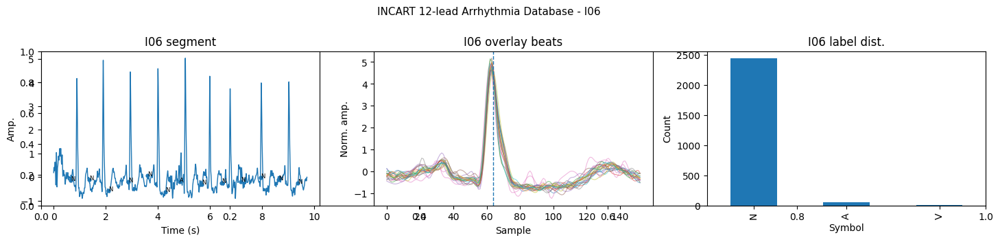

[QC 7/75] I07
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I07_qc_row.png


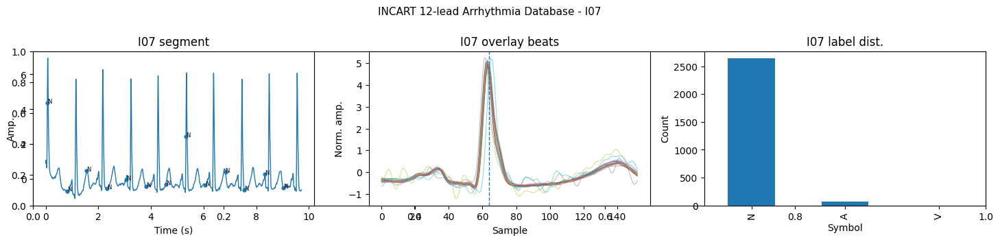

[QC 8/75] I08
[QC 9/75] I09
[QC 10/75] I10
[QC 11/75] I11
[QC 12/75] I12
[QC 13/75] I13
[QC 14/75] I14
[QC 15/75] I15
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I15_qc_row.png


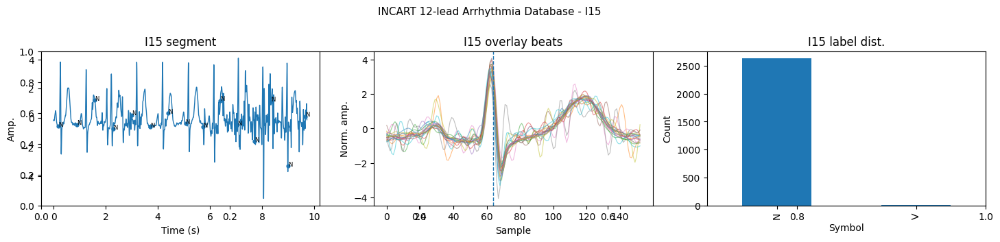

[QC 16/75] I16
[QC 17/75] I17
[QC 18/75] I18
[QC 19/75] I19
[QC 20/75] I20
[QC 21/75] I21
[QC 22/75] I22
[QC 23/75] I23
[QC 24/75] I24
[QC 25/75] I25
[QC 26/75] I26
[QC 27/75] I27
[QC 28/75] I28
[QC 29/75] I29
[QC 30/75] I30
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I30_qc_row.png


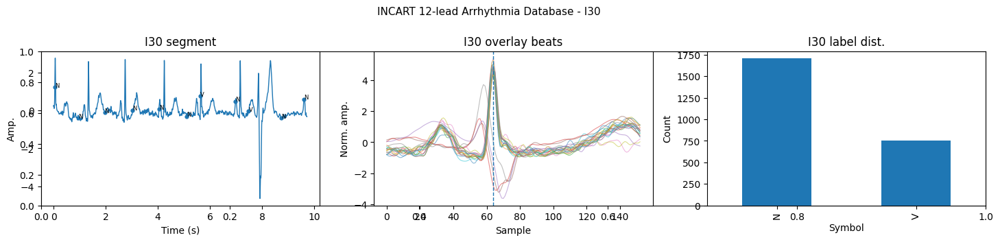

[QC 31/75] I31
[QC 32/75] I32
[QC 33/75] I33
[QC 34/75] I34
[QC 35/75] I35
[QC 36/75] I36
[QC 37/75] I37
[QC 38/75] I38
[QC 39/75] I39
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I39_qc_row.png


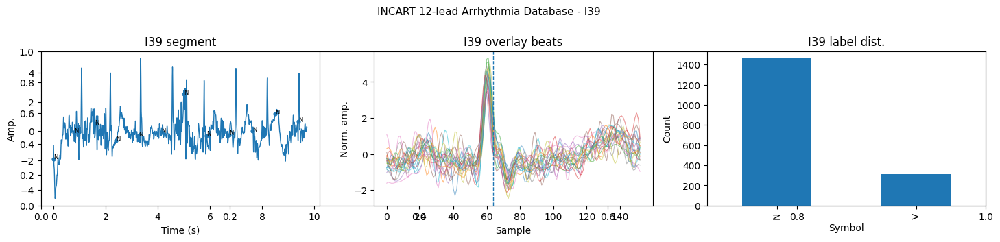

[QC 40/75] I40
[QC 41/75] I41
[QC 42/75] I42
[QC 43/75] I43
[QC 44/75] I44
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I44_qc_row.png


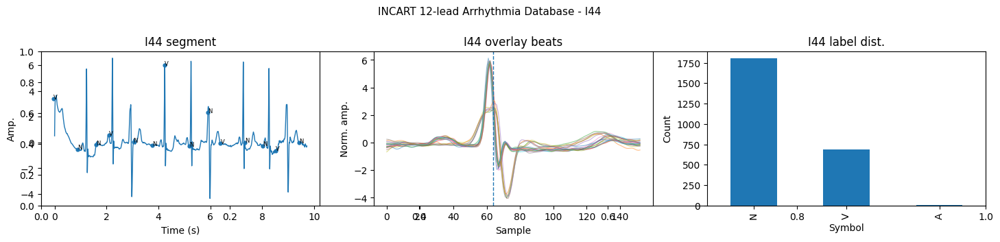

[QC 45/75] I45
[QC 46/75] I46
[QC 47/75] I47
[QC 48/75] I48
[QC 49/75] I49
[QC 50/75] I50
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I50_qc_row.png


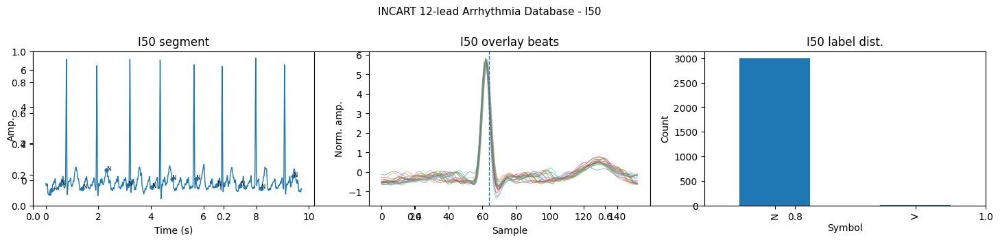

[QC 51/75] I51
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I51_qc_row.png


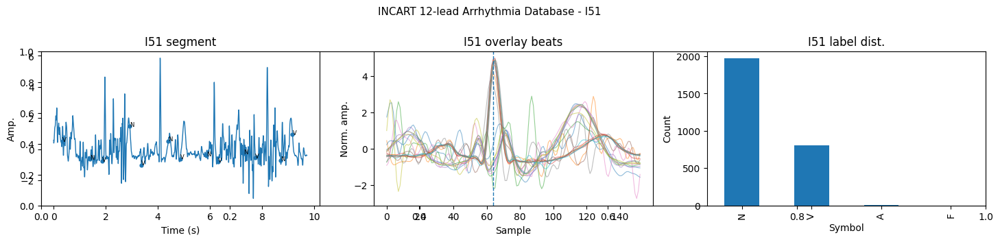

[QC 52/75] I52
[QC 53/75] I53
[QC 54/75] I54
[QC 55/75] I55
[QC 56/75] I56
[QC 57/75] I57
[QC 58/75] I58
[QC 59/75] I59
[QC 60/75] I60
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I60_qc_row.png


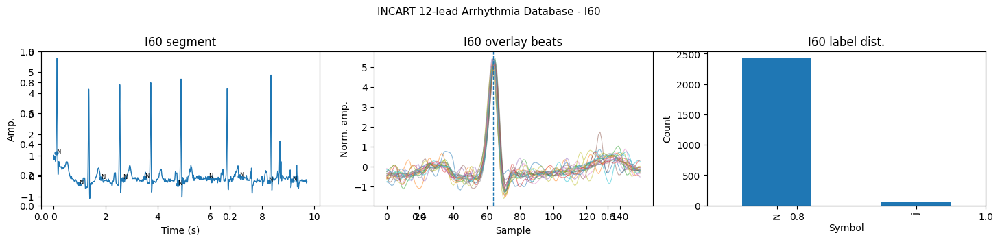

[QC 61/75] I61
[QC 62/75] I62
[QC 63/75] I63
[QC 64/75] I64
[QC 65/75] I65
[QC 66/75] I66
[QC 67/75] I67
[QC 68/75] I68
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I68_qc_row.png


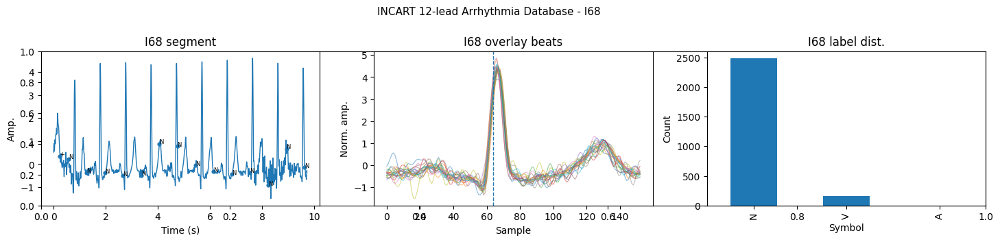

[QC 69/75] I69
[QC 70/75] I70
[QC 71/75] I71
[QC 72/75] I72
[QC 73/75] I73
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I73_qc_row.png


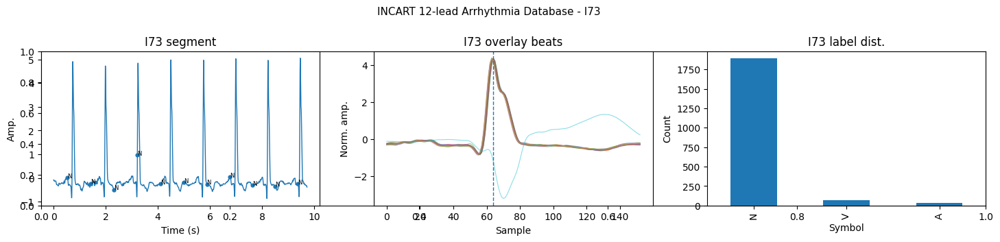

[QC 74/75] I74
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/I74_qc_row.png


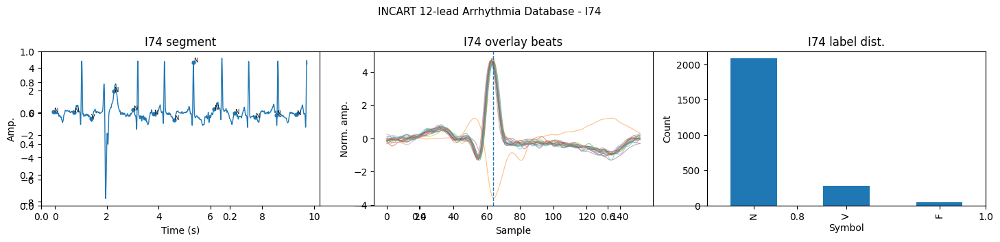

[QC 75/75] I75
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/global_beat_symbol_distribution.png


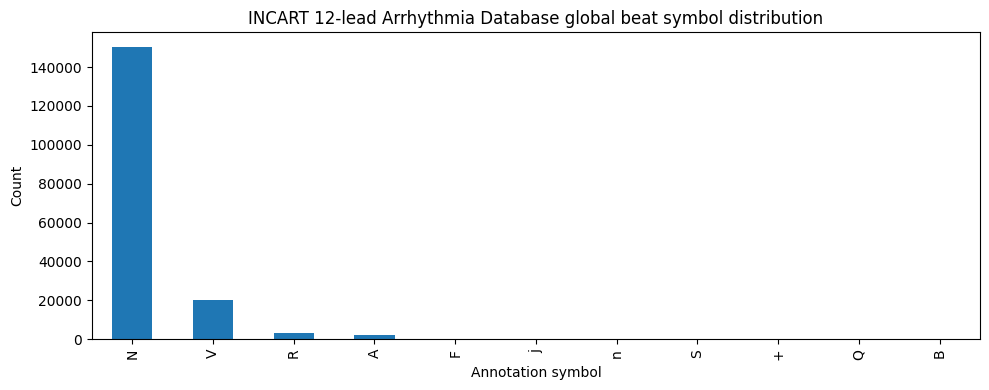

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs/global_aami_distribution.png


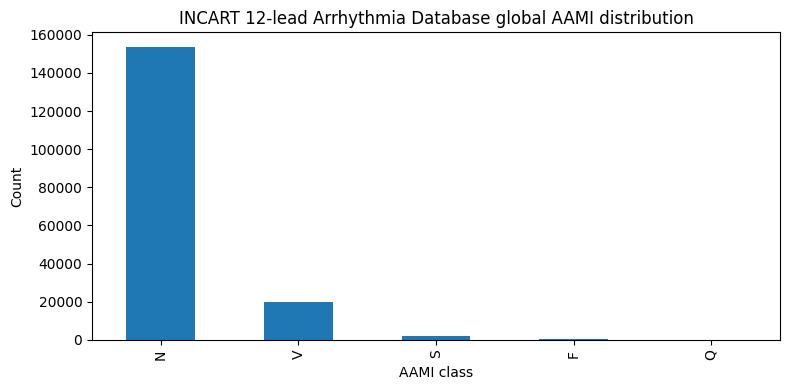


Saved:
- /content/ECG/outputs/ternary_n_v_other/incart_qc/qc_summary.csv
- /content/ECG/data/interim/ternary_n_v_other/beat_annotations.csv
- /content/ECG/outputs/ternary_n_v_other/incart_qc/problems.csv
- figures in /content/ECG/outputs/ternary_n_v_other/incart_qc/graphs
- plotted records: 12 / 75
[DONE] qc_dataset_ext::{"dataset": "incart"}
[RUN ] plot_preprocessing_comparison::{"dataset": "incart", "record_name": "I01"}
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart/preprocessing_comparison/incart_I01_ch0_preprocessing_comparison.png


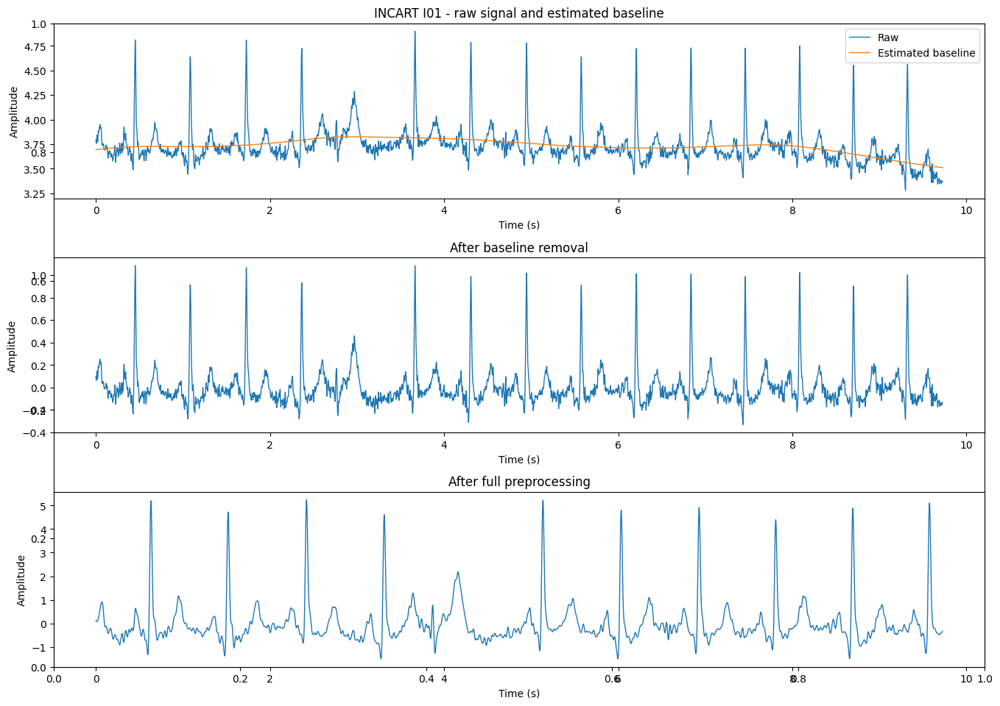

[OK] Saved figure to: /content/ECG/outputs/ternary_n_v_other/incart/preprocessing_comparison/incart_I01_ch0_preprocessing_comparison.png
[DONE] plot_preprocessing_comparison::{"dataset": "incart", "record_name": "I01"}
[RUN ] prepare_incart_datasets::{}
[OK] Saved to: /content/ECG/data/interim/ternary_n_v_other/incart_beats
[DONE] prepare_incart_datasets::{}
[RUN ] build_general_features::{"dataset": "incart"}
DATA DIR: /content/ECG/data/interim/ternary_n_v_other/incart_beats
OUT DIR: /content/ECG/data/interim/ternary_n_v_other/incart_features_general
[OK] Saved: /content/ECG/data/interim/ternary_n_v_other/incart_features_general/train_general_features.csv
[OK] Saved: /content/ECG/data/interim/ternary_n_v_other/incart_features_general/val_general_features.csv
[OK] Saved: /content/ECG/data/interim/ternary_n_v_other/incart_features_general/test_general_features.csv
[OK] Manifest: /content/ECG/data/interim/ternary_n_v_other/incart_features_general/manifest_general_features.json
[OK] Repor

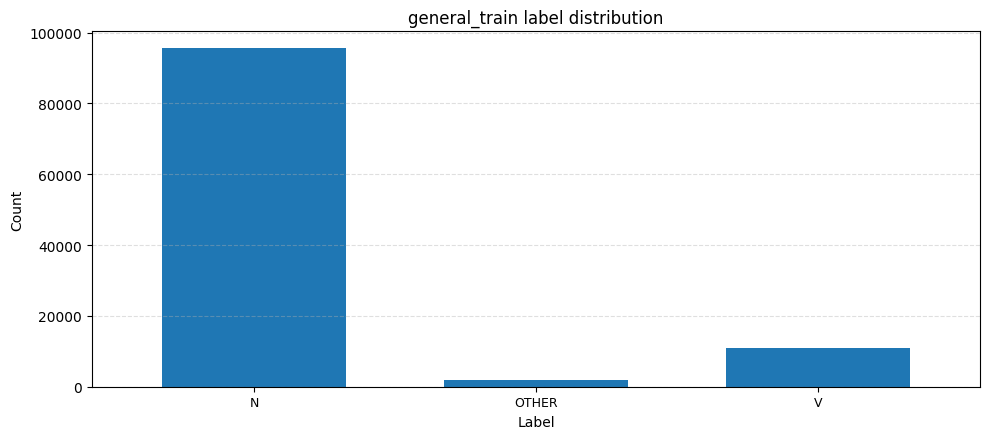

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_train_hist_mean.png


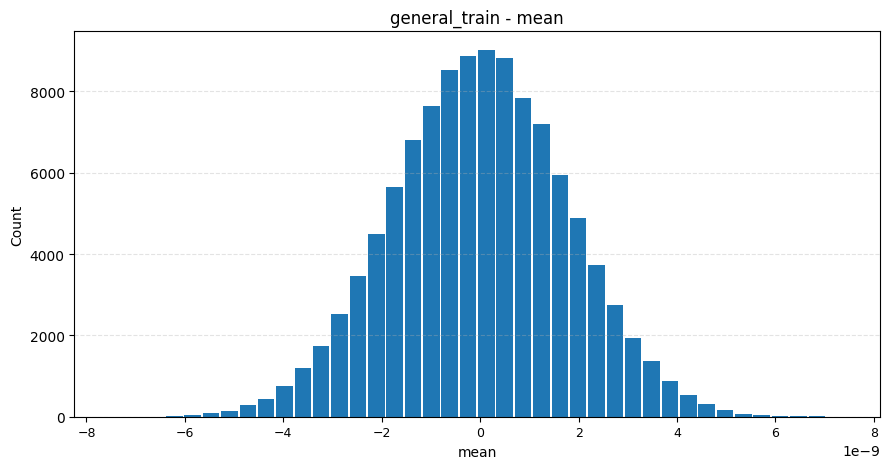

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_train_hist_std.png


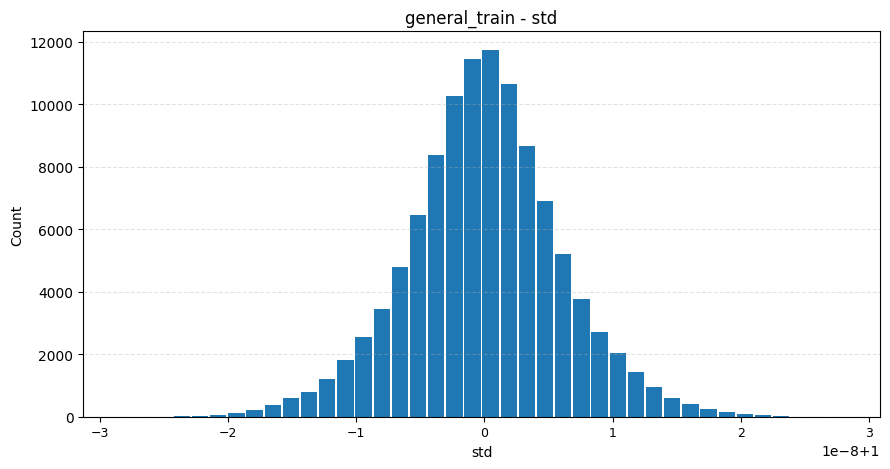

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_train_hist_min.png


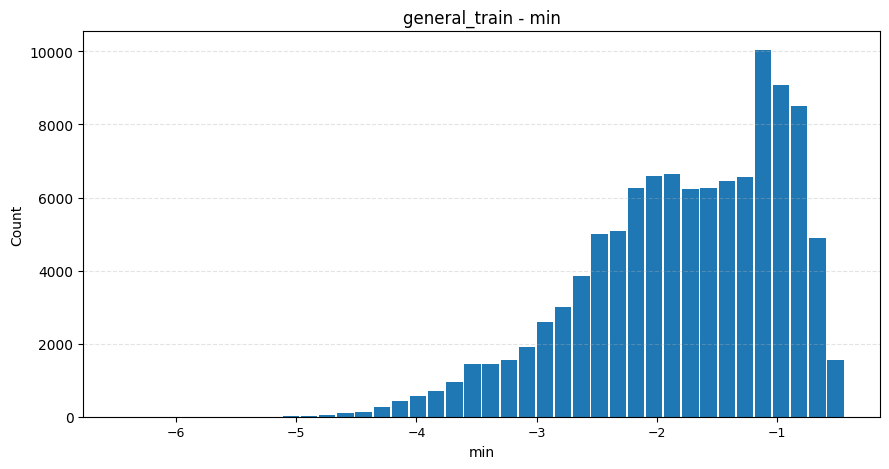

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_train_hist_max.png


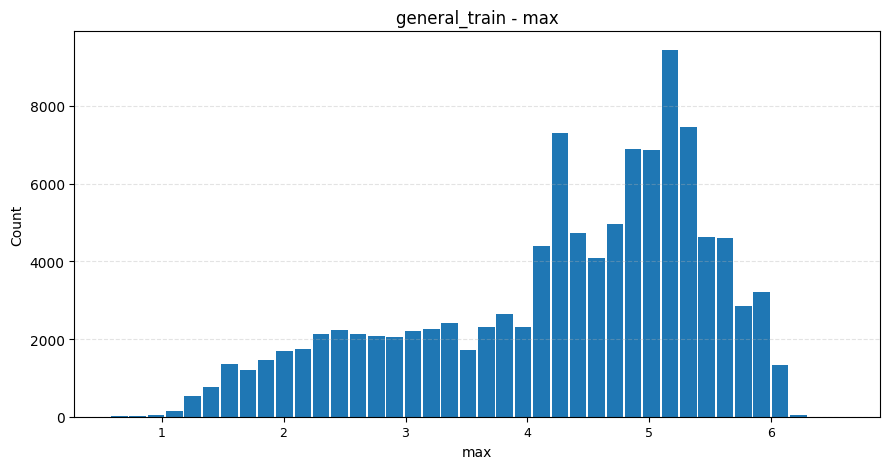

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_train_hist_ptp.png


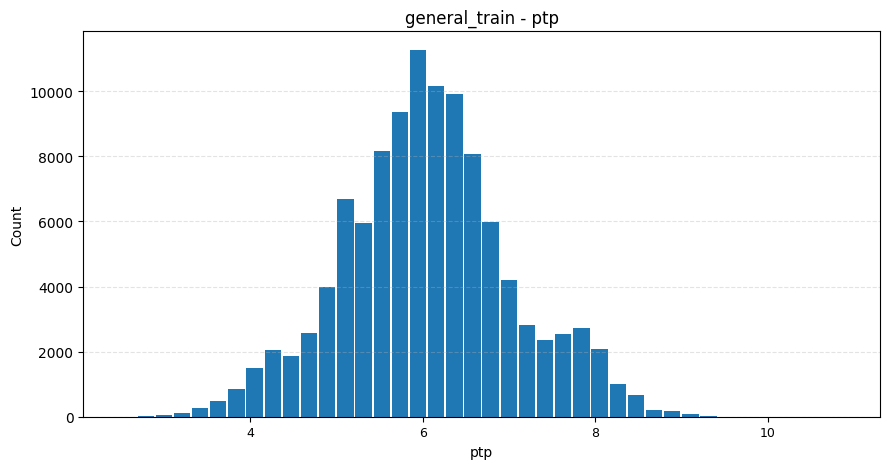

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_train_hist_median.png


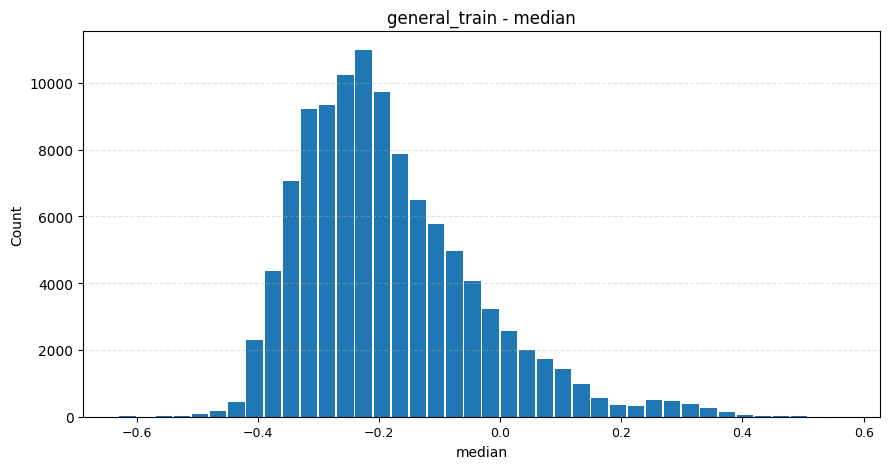

[INFO] Reporting general/val: /content/ECG/data/interim/ternary_n_v_other/incart_features_general/val_general_features.csv | shape=(29222, 29)
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_label_distribution.png


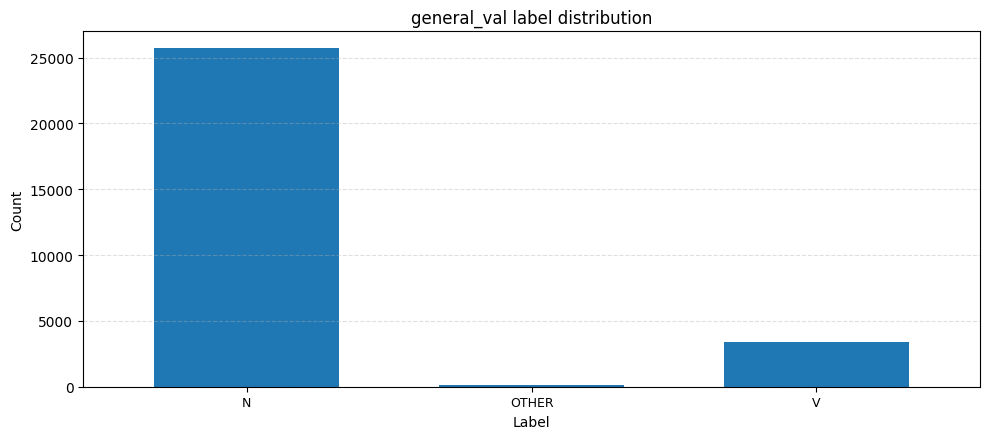

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_hist_mean.png


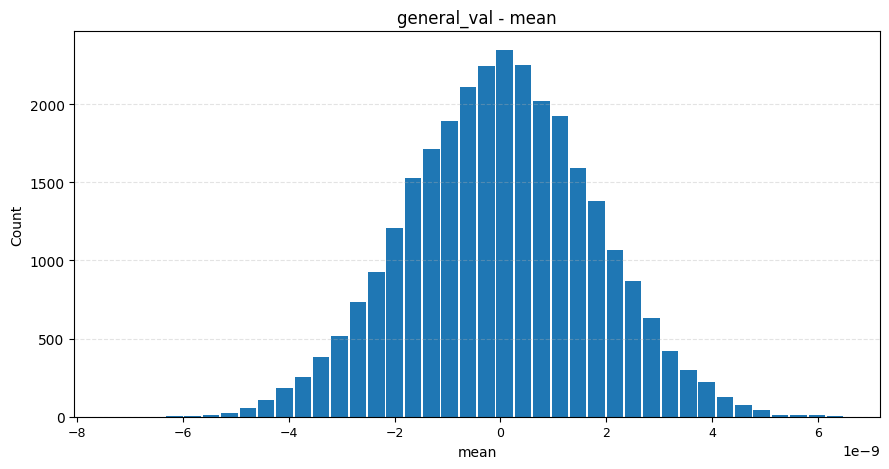

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_hist_std.png


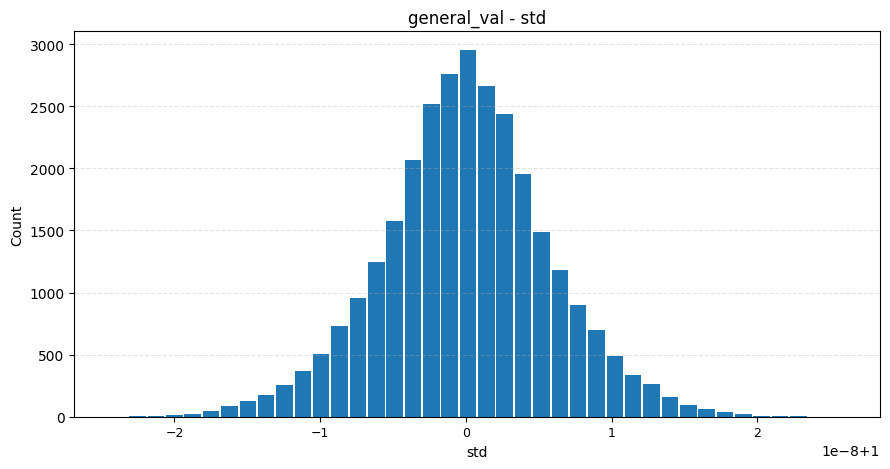

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_hist_min.png


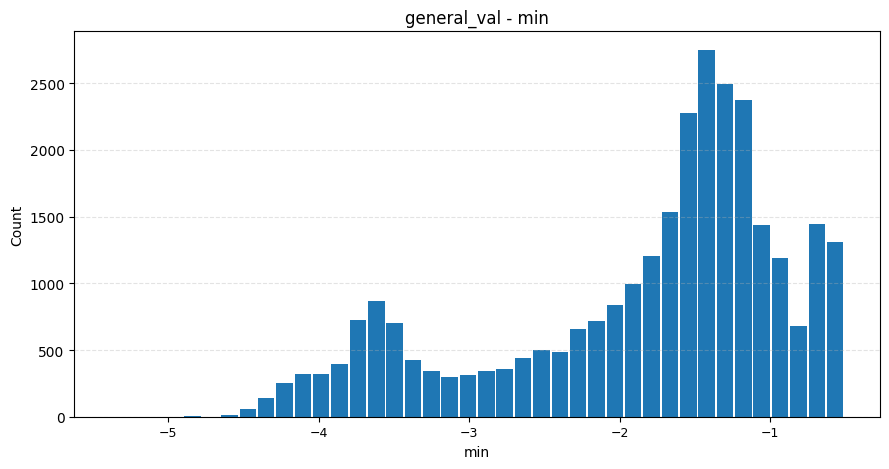

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_hist_max.png


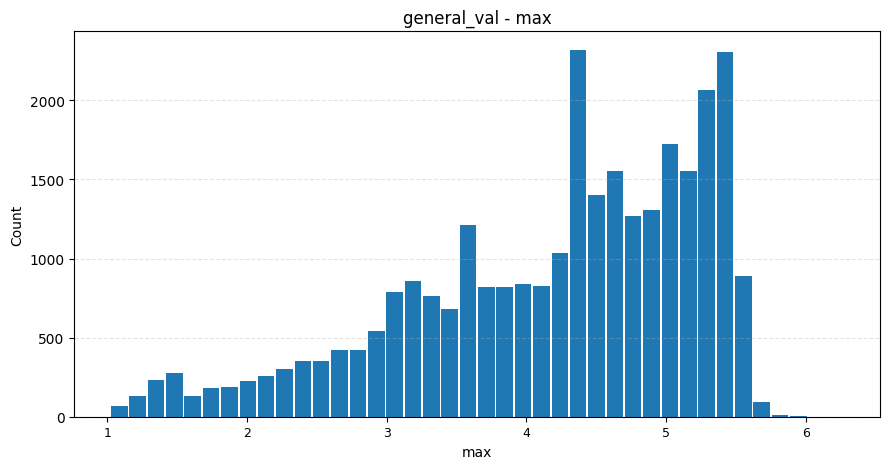

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_hist_ptp.png


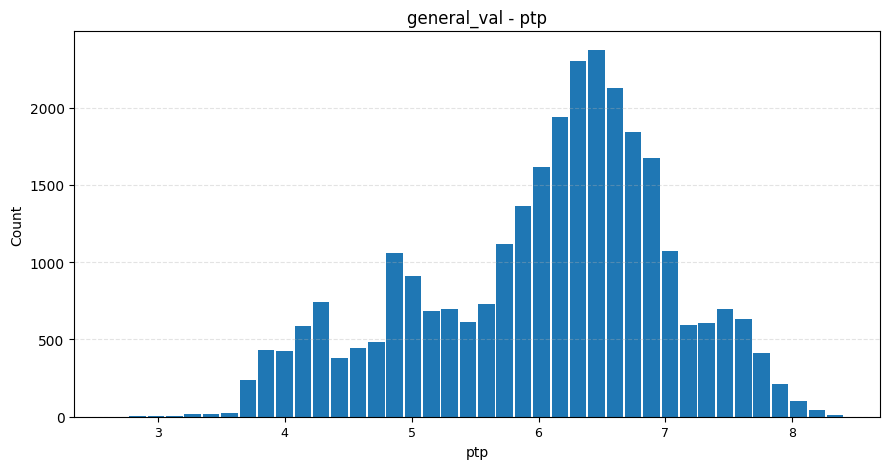

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_val_hist_median.png


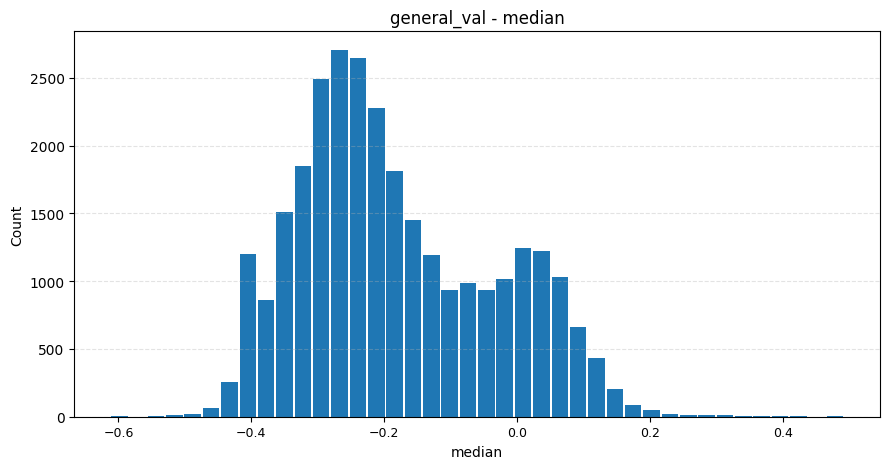

[INFO] Reporting general/test: /content/ECG/data/interim/ternary_n_v_other/incart_features_general/test_general_features.csv | shape=(38160, 29)
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_label_distribution.png


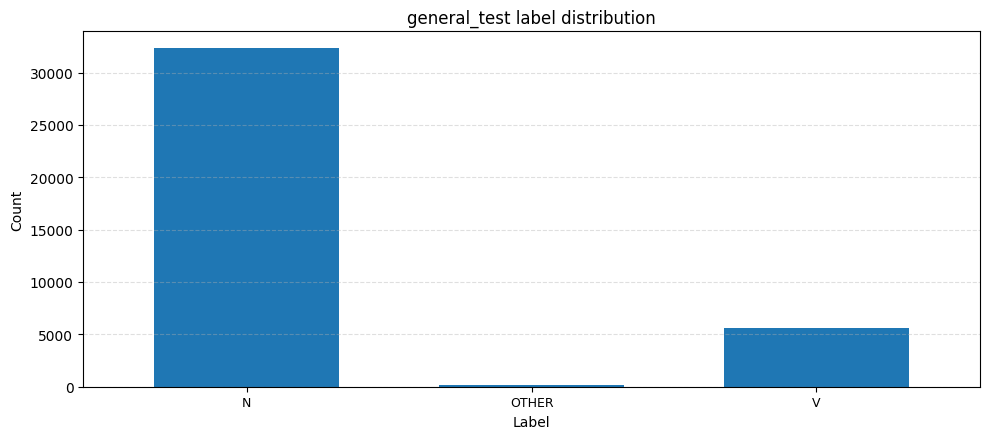

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_hist_mean.png


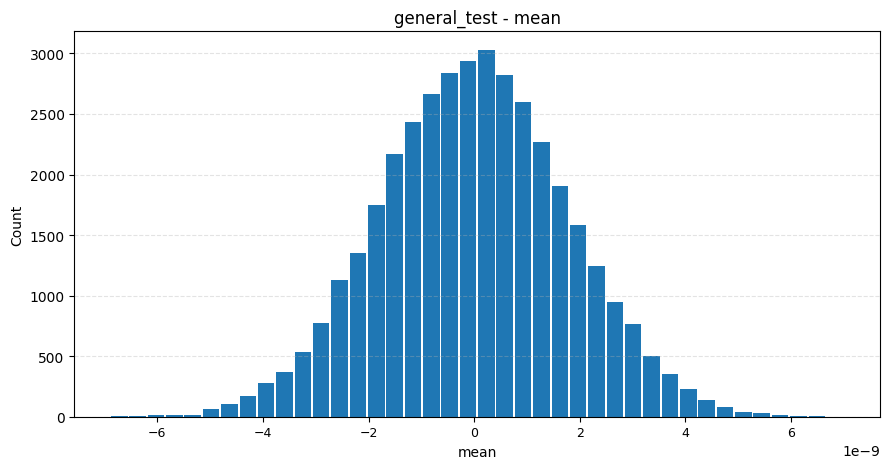

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_hist_std.png


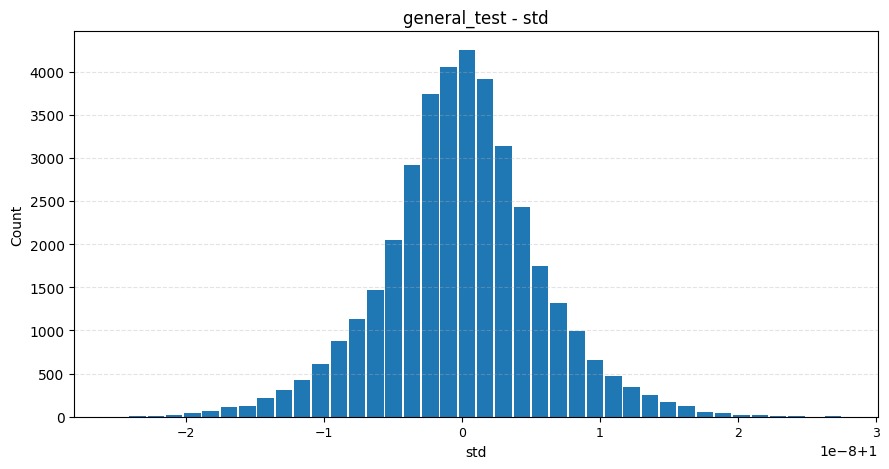

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_hist_min.png


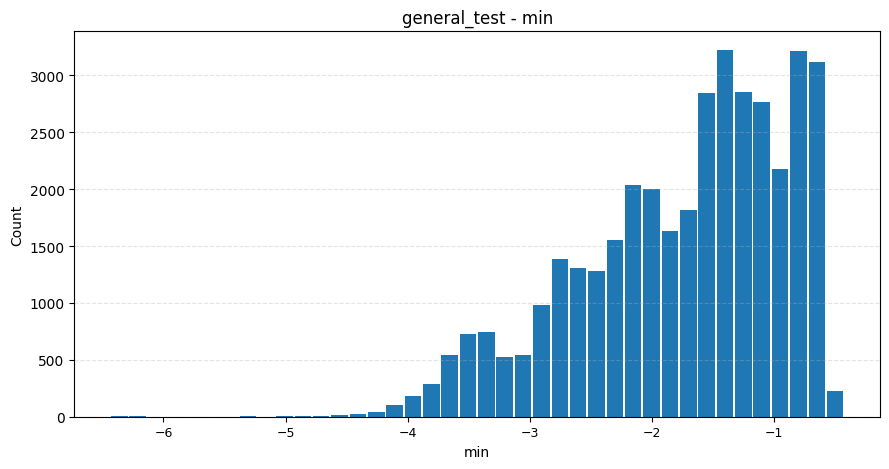

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_hist_max.png


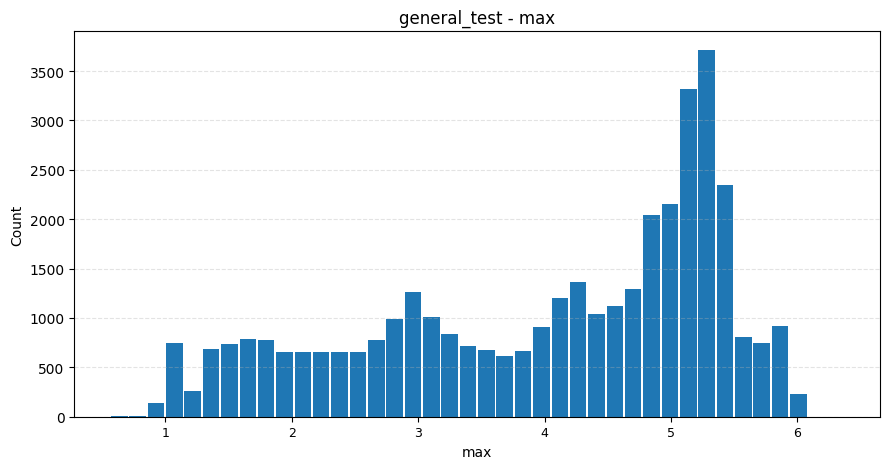

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_hist_ptp.png


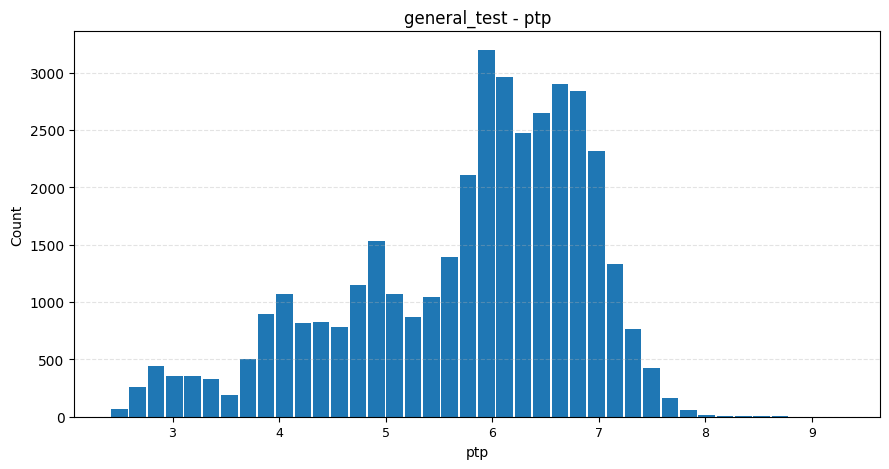

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/general_test_hist_median.png


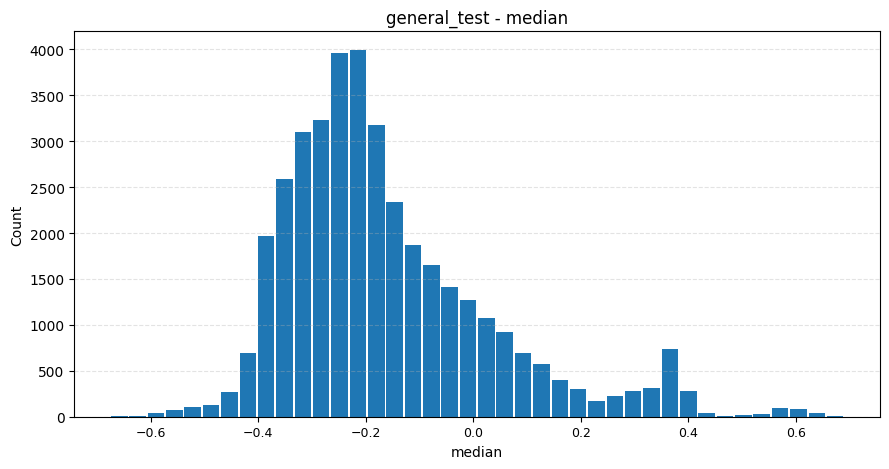

[INFO] Reporting morphology/train: /content/ECG/data/interim/ternary_n_v_other/incart_features_morphology/train_morphology_features.csv | shape=(108284, 36)
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_label_distribution.png


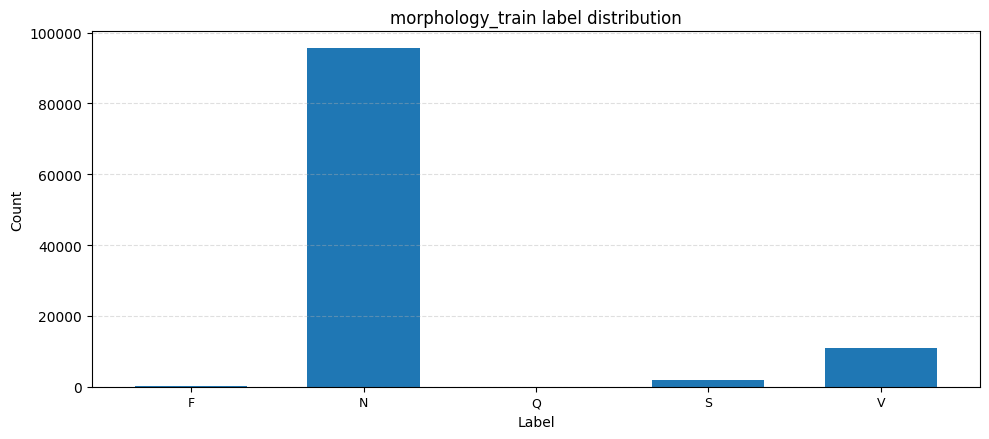

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_hist_beat_len.png


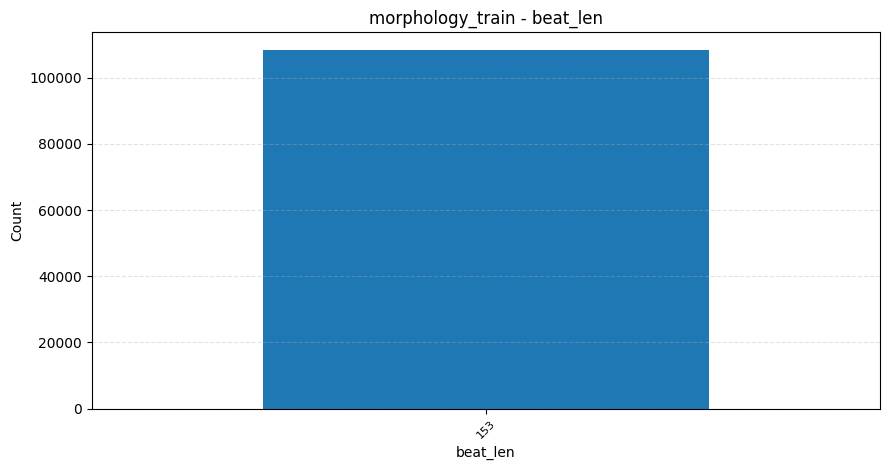

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_hist_beat_center_sample.png


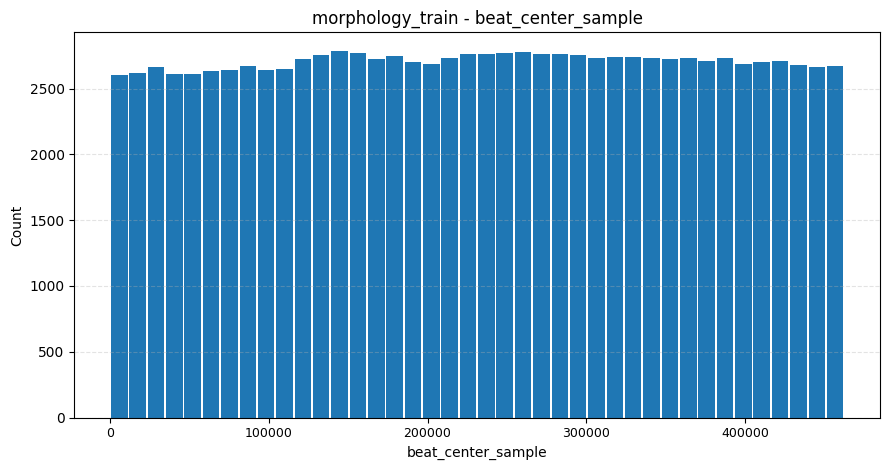

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_hist_rr_prev.png


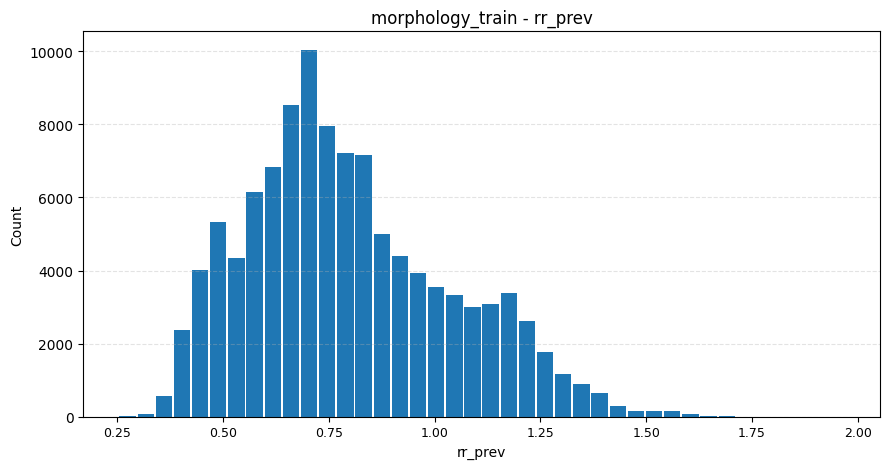

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_hist_rr_next.png


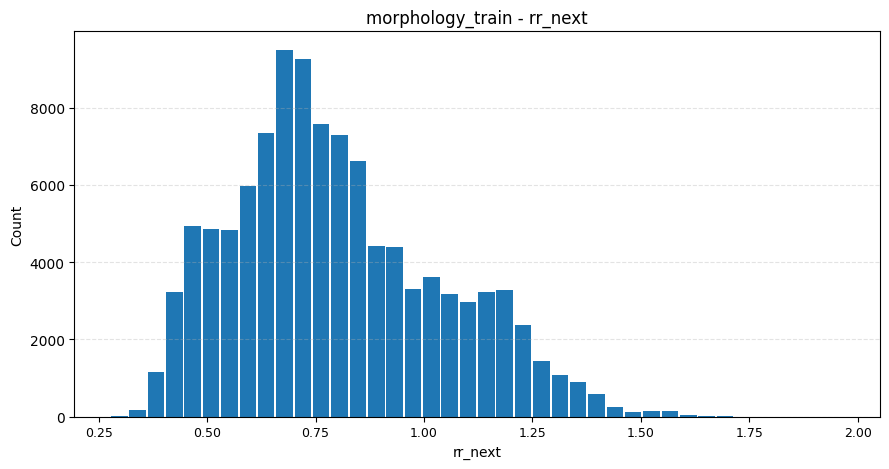

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_hist_r_amp.png


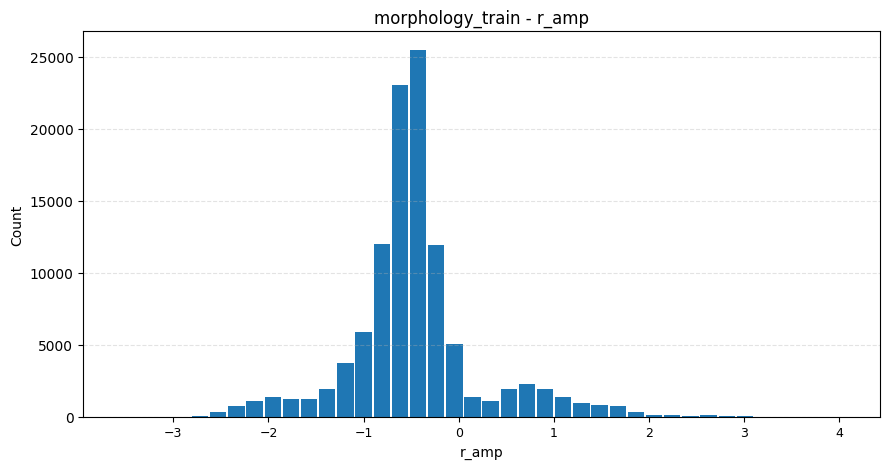

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_train_hist_max_amp.png


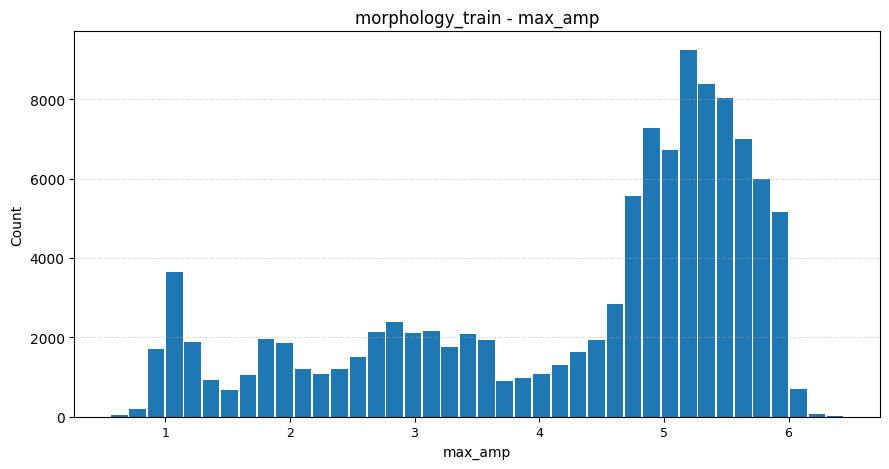

[INFO] Reporting morphology/val: /content/ECG/data/interim/ternary_n_v_other/incart_features_morphology/val_morphology_features.csv | shape=(29239, 36)
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_label_distribution.png


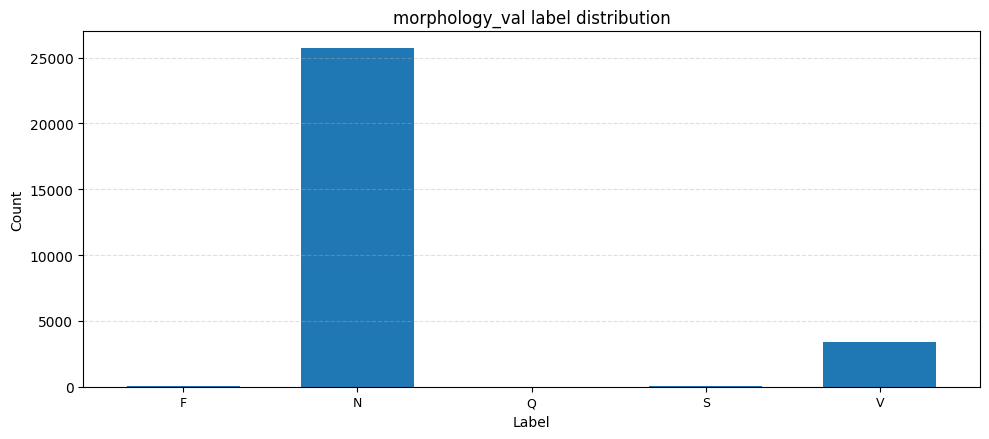

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_hist_beat_len.png


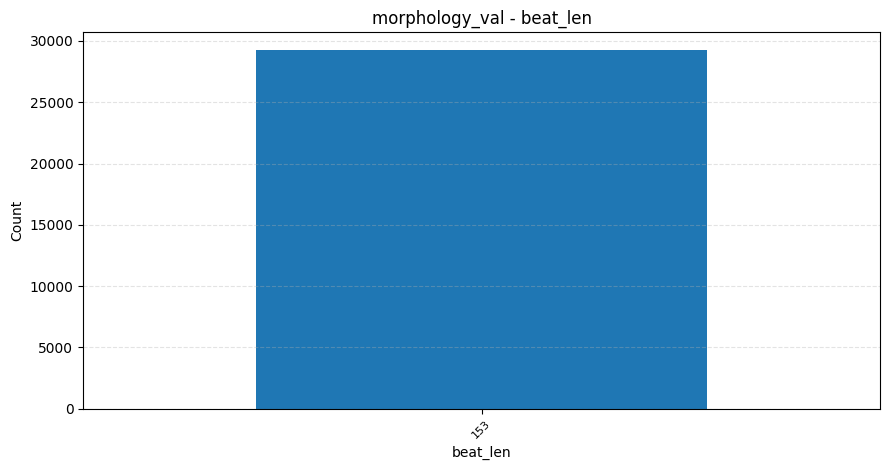

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_hist_beat_center_sample.png


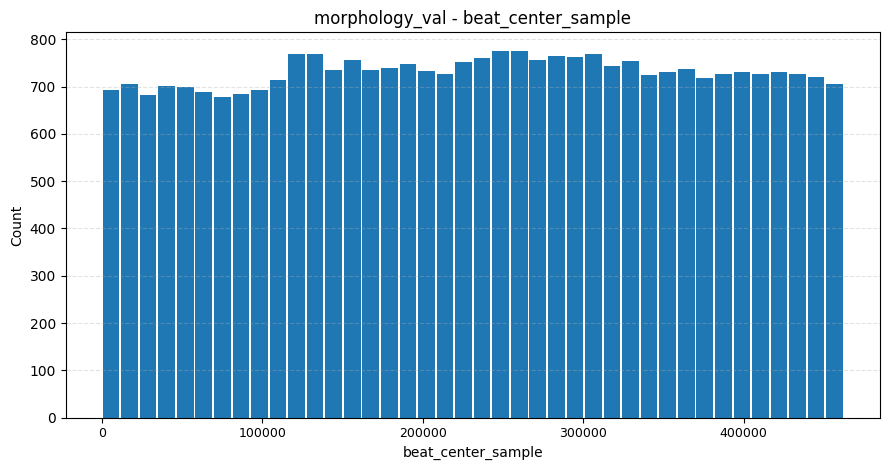

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_hist_rr_prev.png


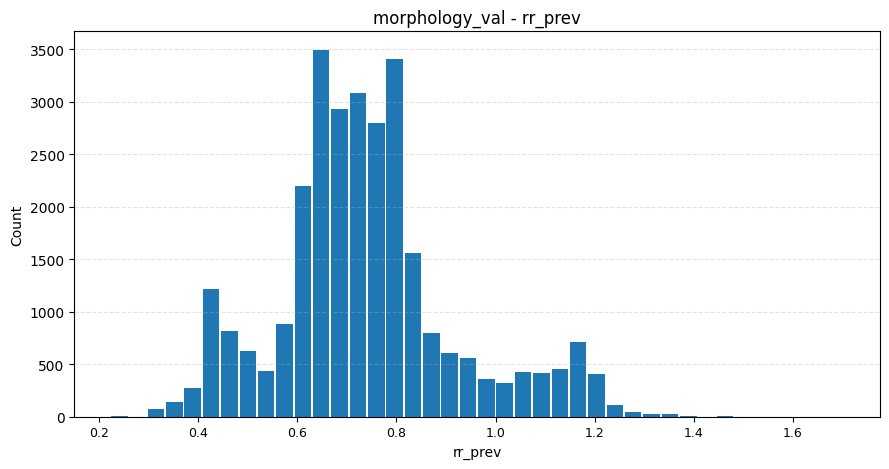

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_hist_rr_next.png


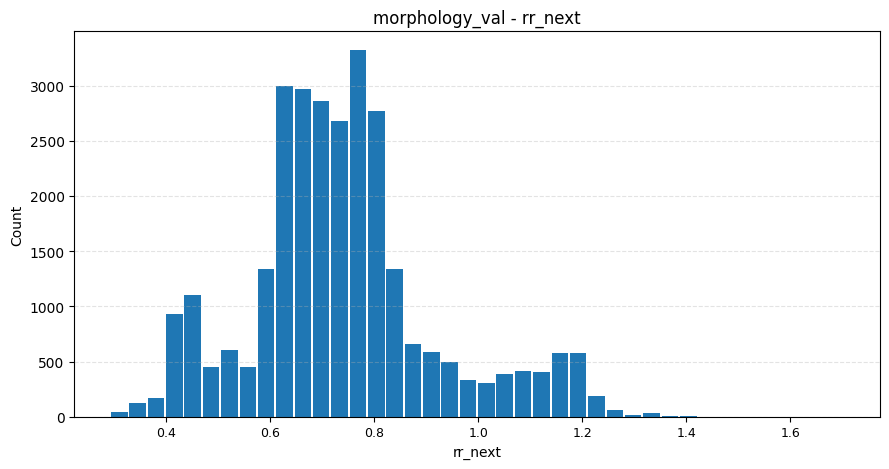

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_hist_r_amp.png


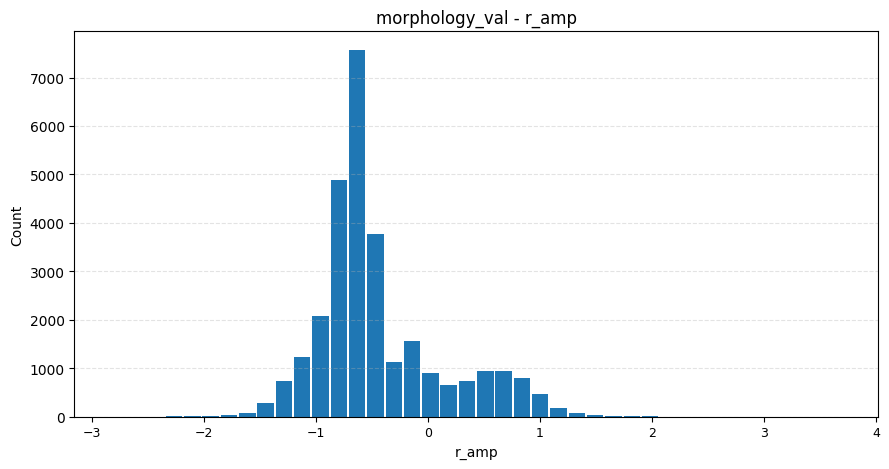

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_val_hist_max_amp.png


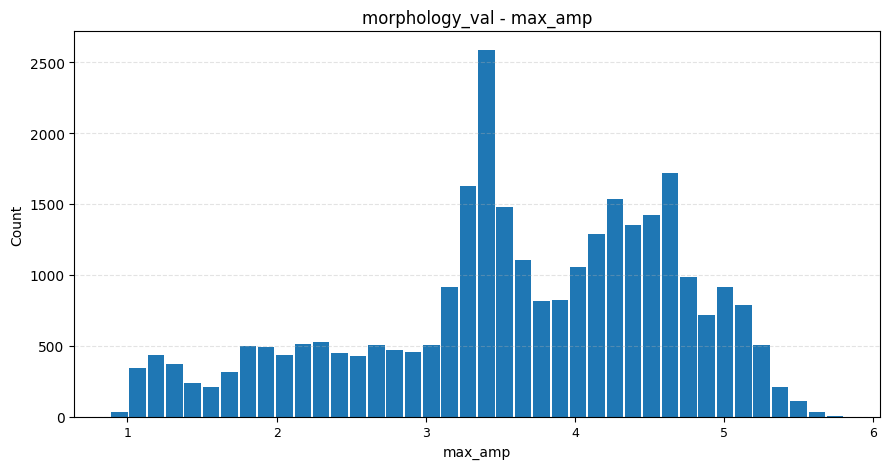

[INFO] Reporting morphology/test: /content/ECG/data/interim/ternary_n_v_other/incart_features_morphology/test_morphology_features.csv | shape=(38300, 36)
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_missing_values.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_label_means.csv
[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_correlation_matrix.csv
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_label_distribution.png


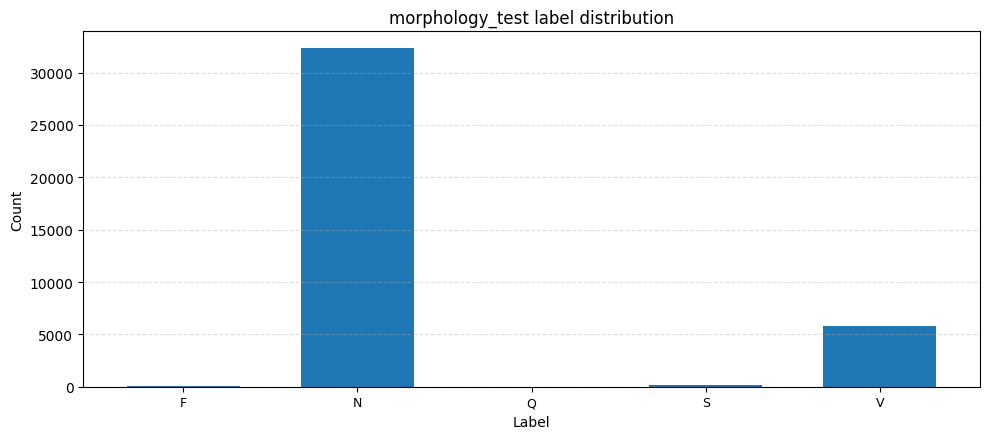

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_hist_beat_len.png


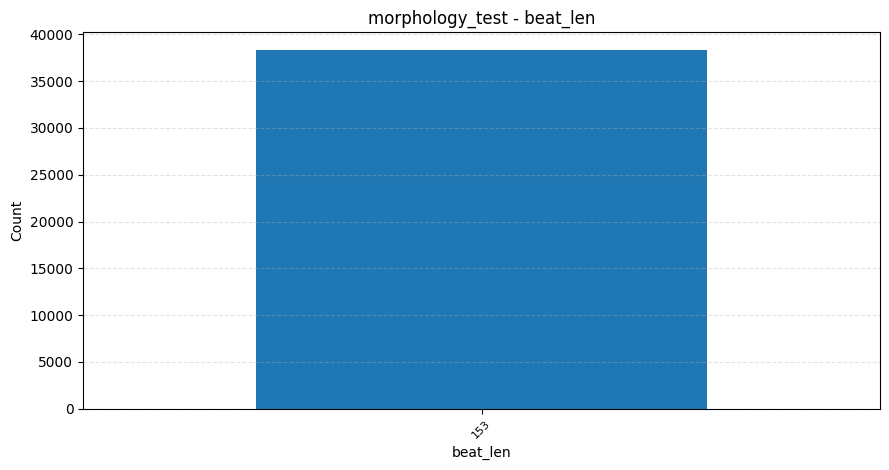

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_hist_beat_center_sample.png


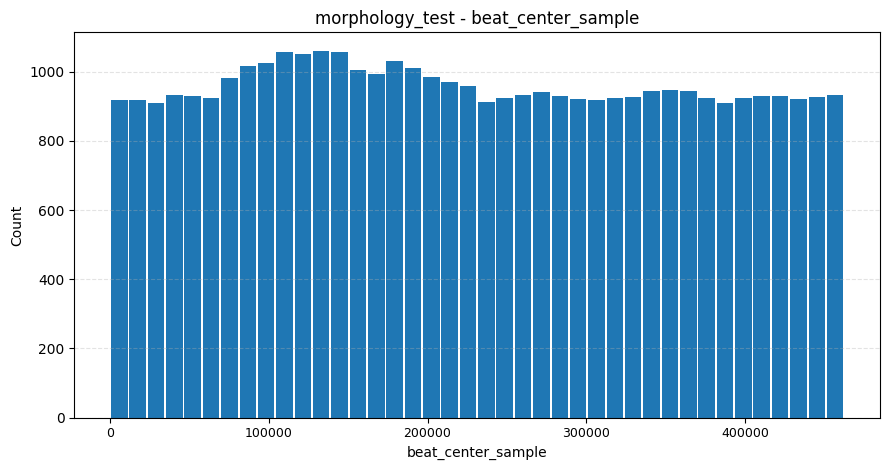

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_hist_rr_prev.png


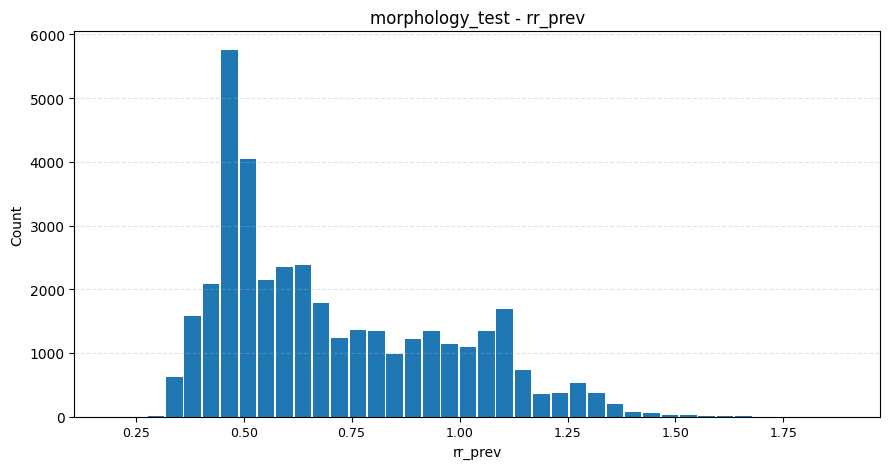

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_hist_rr_next.png


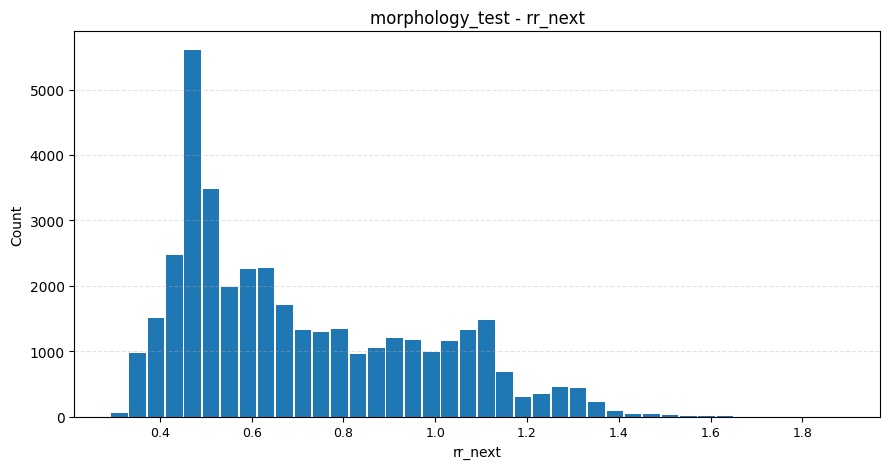

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_hist_r_amp.png


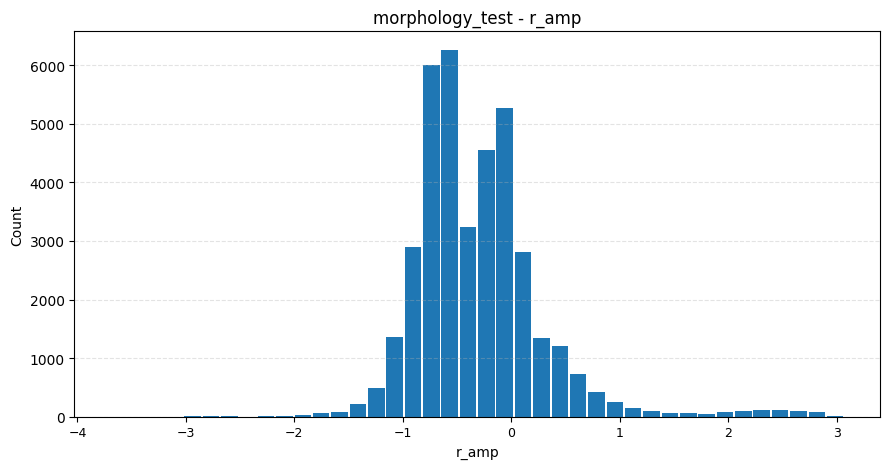

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/morphology_test_hist_max_amp.png


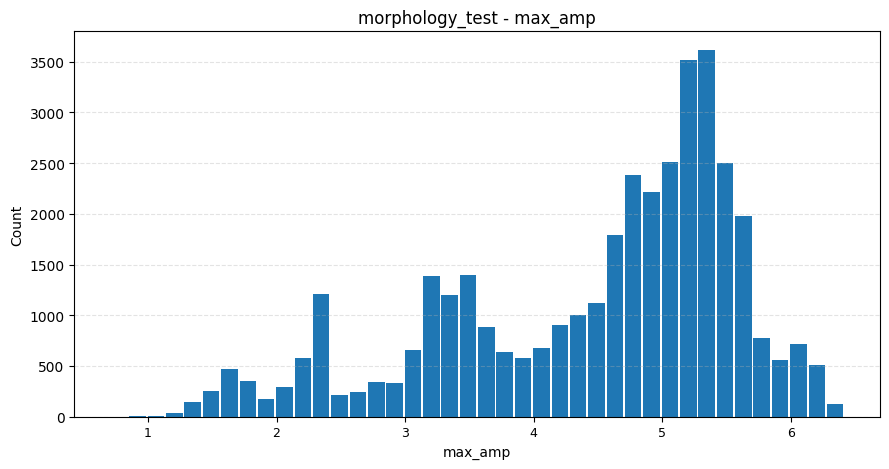

[TABLE] /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/feature_report_summary.csv
[OK] Feature report JSON: /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/report_input_features.json
[OK] Feature report summary: /content/ECG/outputs/ternary_n_v_other/incart_feature_reports/feature_report_summary.csv
[DONE] report_features::{"dataset": "incart"}
[RUN ] train_featurext::{"dataset": "incart"}

Training model: logreg
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_featurext/logreg_train_confusion_matrix.png


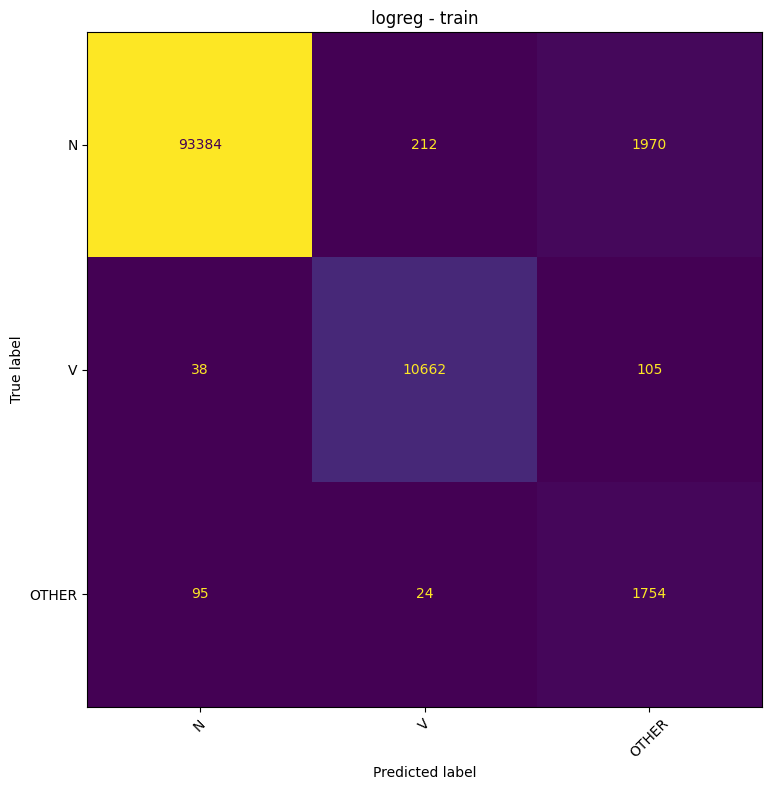

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_featurext/logreg_val_confusion_matrix.png


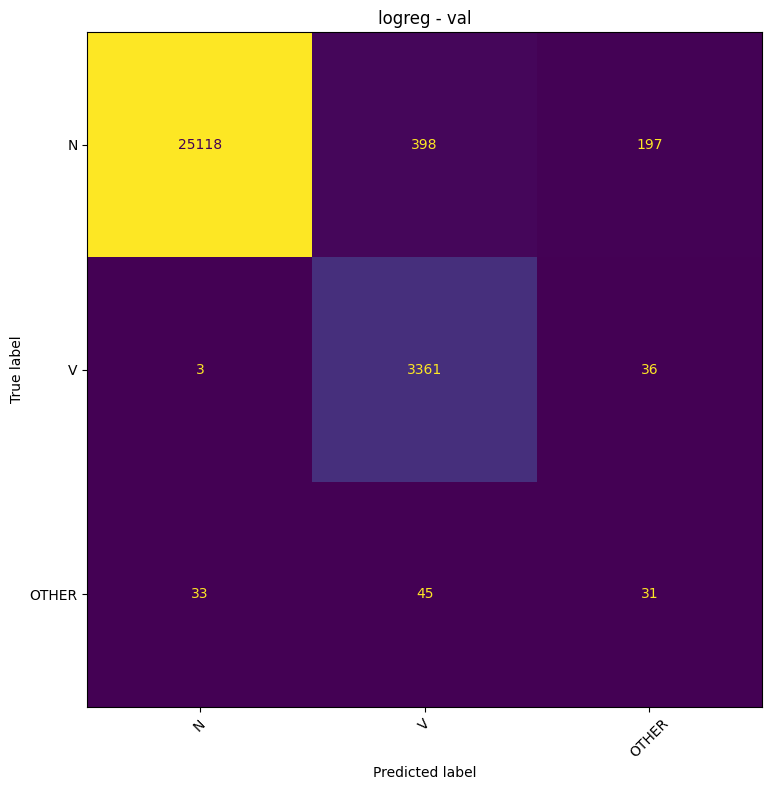

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_featurext/logreg_test_confusion_matrix.png


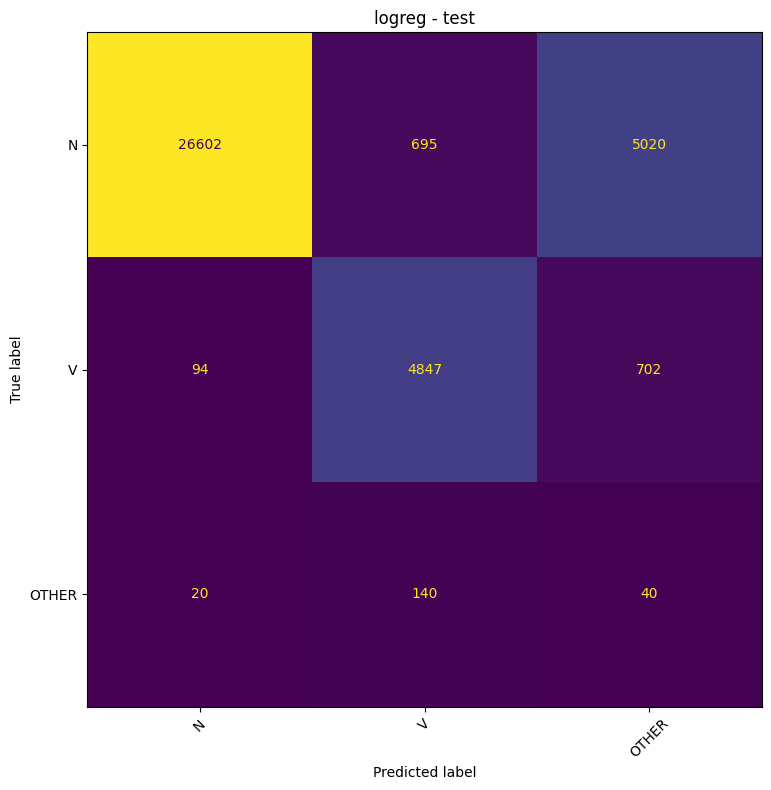


Training model: rf
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_featurext/rf_train_confusion_matrix.png


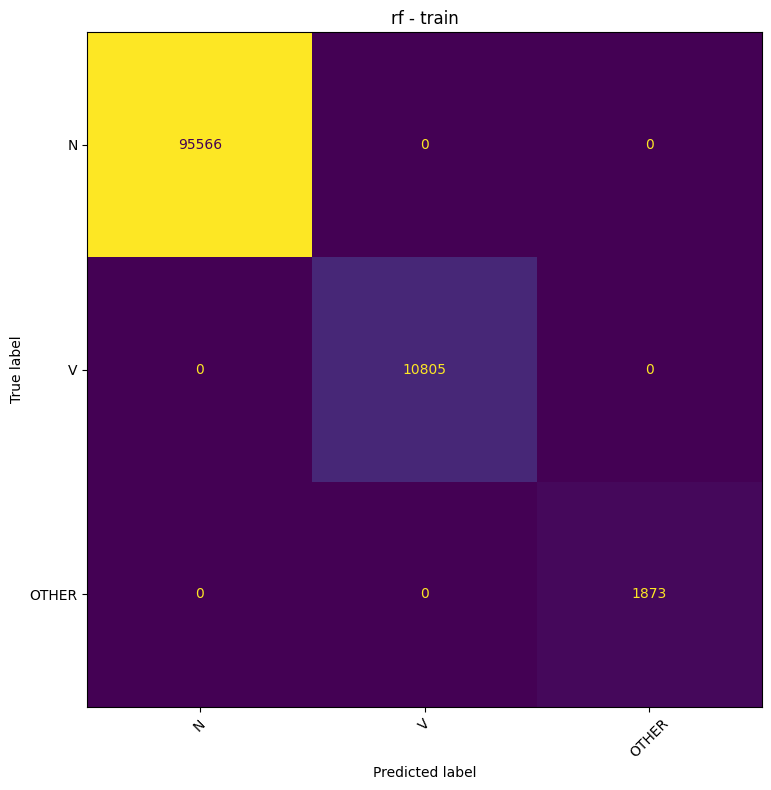

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_featurext/rf_val_confusion_matrix.png


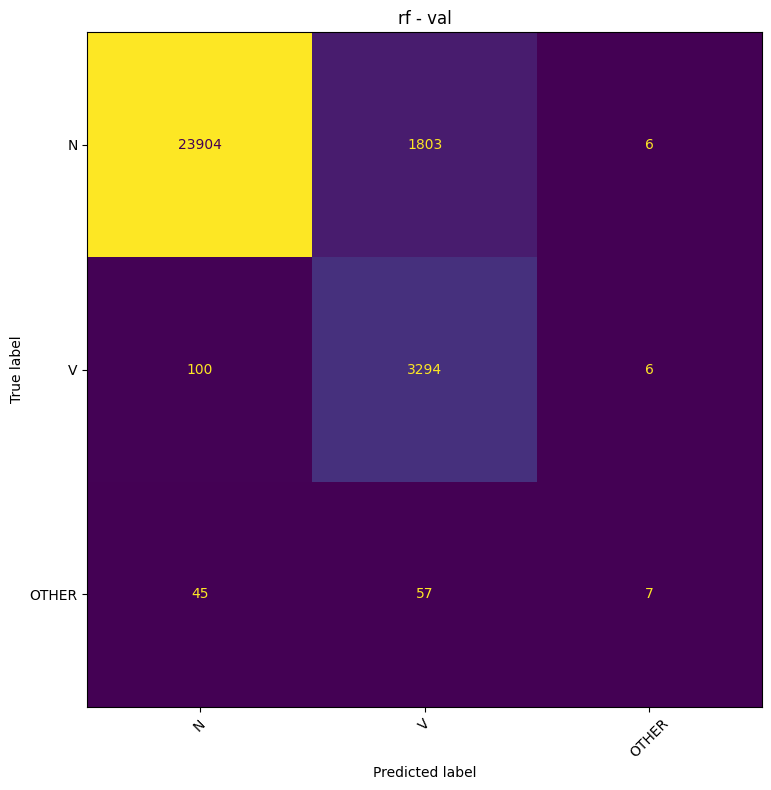

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_featurext/rf_test_confusion_matrix.png


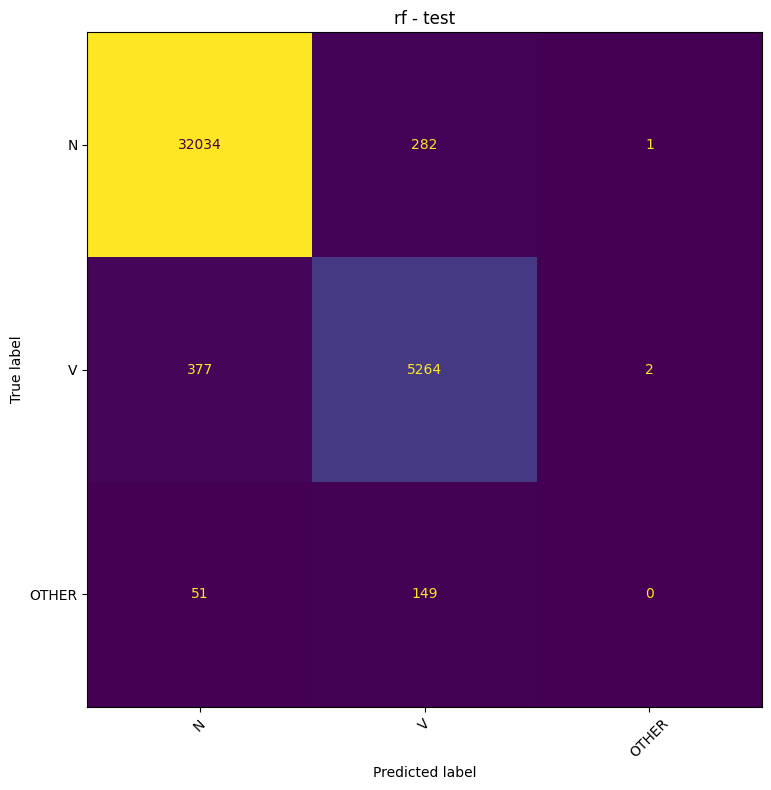

           model  split  n_samples  accuracy  macro_f1  weighted_f1
0  logreg_incart  train     108244  0.977421  0.861839     0.980790
1  logreg_incart    val      29222  0.975635  0.695636     0.978190
2  logreg_incart   test      38160  0.825183  0.590220     0.889910
3      rf_incart  train     108244  1.000000  1.000000     1.000000
4      rf_incart    val      29222  0.930977  0.613425     0.935385
5      rf_incart   test      38160  0.977411  0.639194     0.974899
[OK] Saved to: /content/ECG/outputs/ternary_n_v_other/incart_featurext
[DONE] train_featurext::{"dataset": "incart"}
[RUN ] plot_dataset_tsne::{"dataset": "incart"}
Starting t-SNE visualization for incart splits...
[INFO] Dataset dir: /content/ECG/data/interim/ternary_n_v_other/incart_beats
[INFO] Results dir: /content/ECG/outputs/ternary_n_v_other/incart_tsne
Processing dataset: incart
Processing split:   train
Input file:         /content/ECG/data/interim/ternary_n_v_other/incart_beats/train.npz
Original X shape: (10

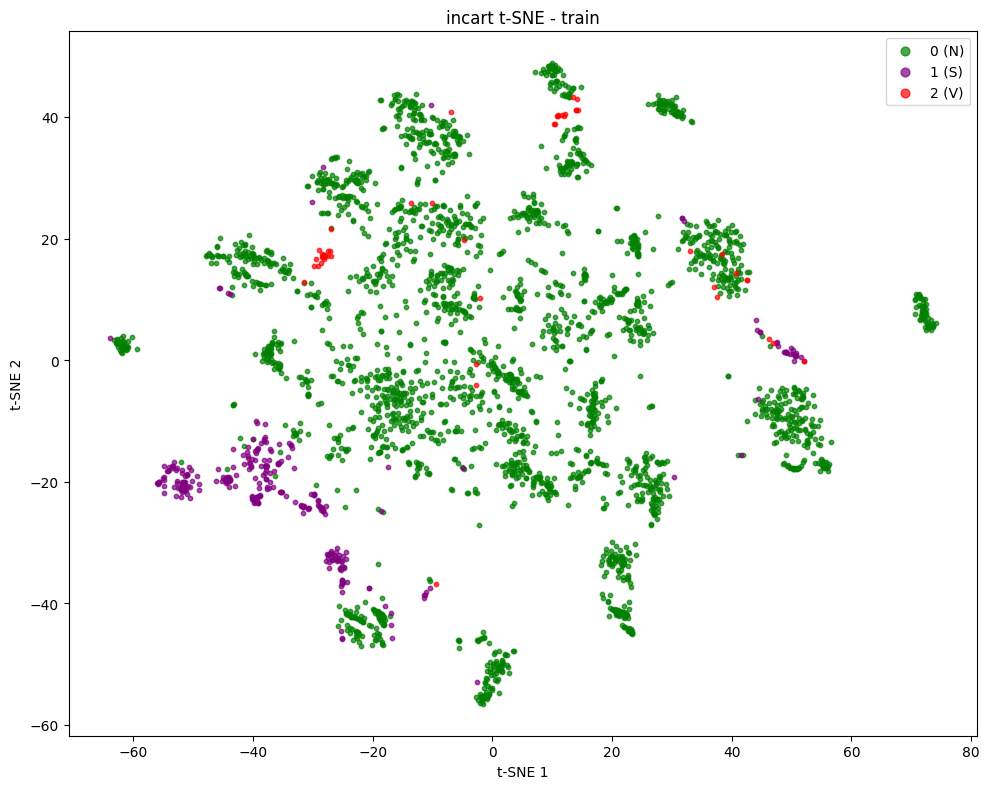

Saved plot: /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_train.png
Processing dataset: incart
Processing split:   val
Input file:         /content/ECG/data/interim/ternary_n_v_other/incart_beats/val.npz
Original X shape: (29222, 215)
Original y shape: (29222,)
Label distribution:
  0 (N): 25713
  1 (S): 3400
  2 (V): 109
Flattened X shape: (29222, 215)
Subsampled X shape: (3000, 215)
Subsampled y shape: (3000,)
Label distribution:
  0 (N): 2640
  1 (S): 349
  2 (V): 11
Running t-SNE...
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_val.png


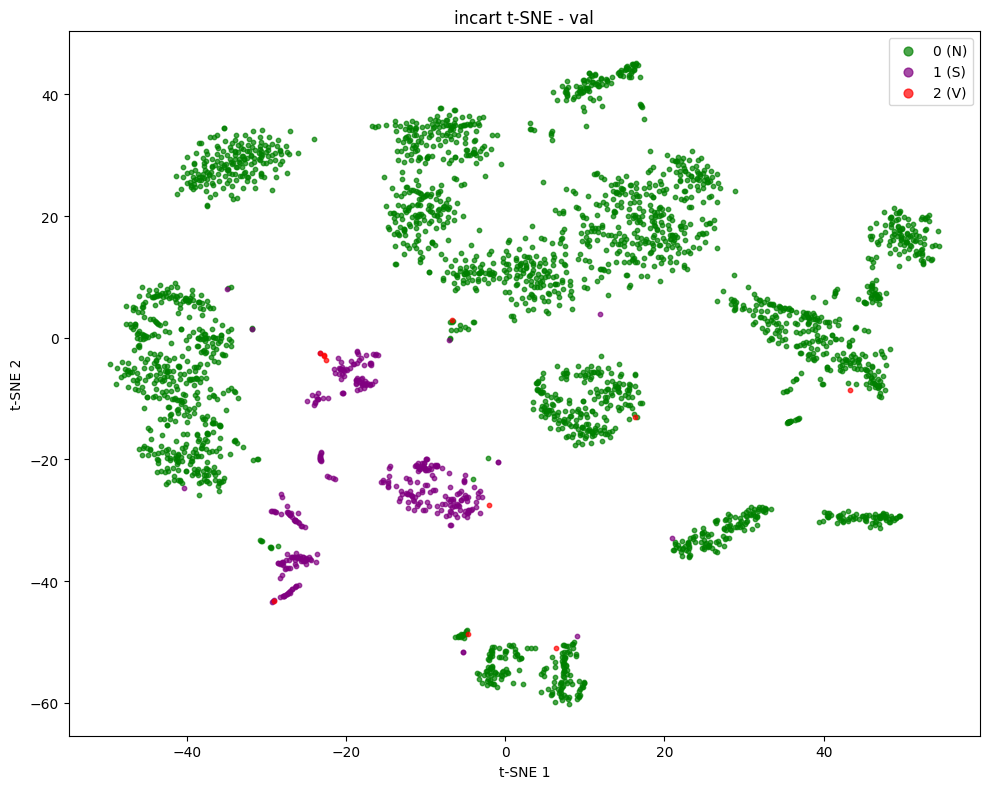

Saved plot: /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_val.png
Processing dataset: incart
Processing split:   test
Input file:         /content/ECG/data/interim/ternary_n_v_other/incart_beats/test.npz
Original X shape: (38160, 215)
Original y shape: (38160,)
Label distribution:
  0 (N): 32317
  1 (S): 5643
  2 (V): 200
Flattened X shape: (38160, 215)
Subsampled X shape: (3000, 215)
Subsampled y shape: (3000,)
Label distribution:
  0 (N): 2541
  1 (S): 444
  2 (V): 15
Running t-SNE...
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_test.png


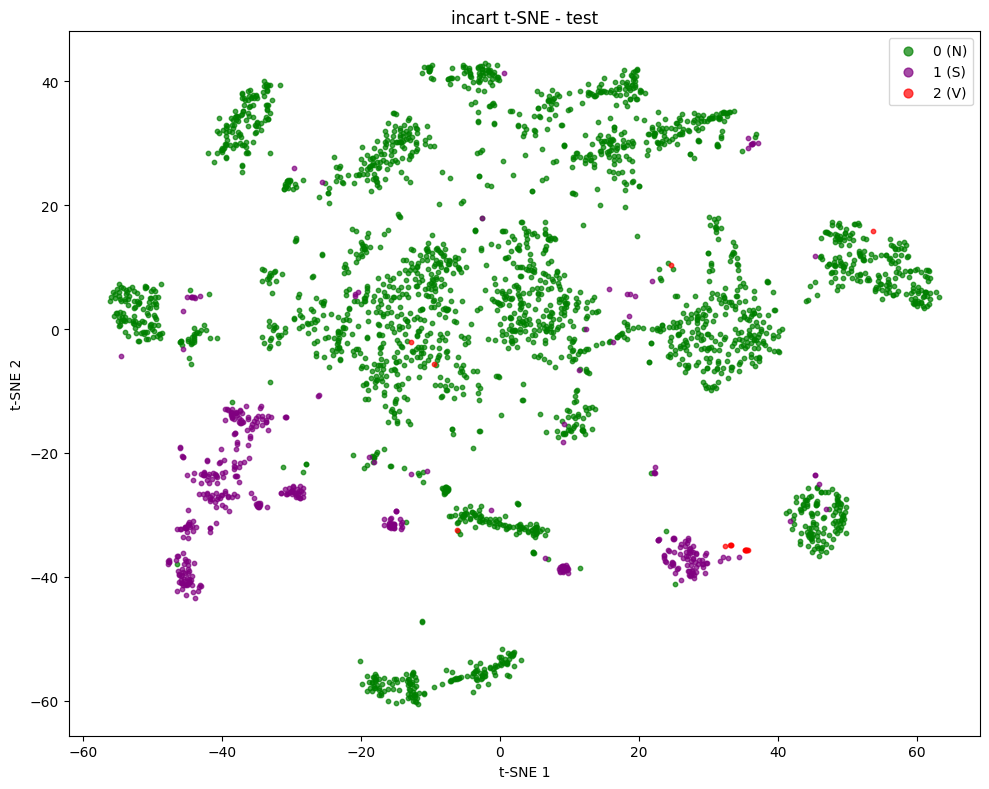

Saved plot: /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_test.png
Done.
[DONE] plot_dataset_tsne::{"dataset": "incart"}
[RUN ] plot_tsne_featurext_vs_cnn::{"dataset": "incart"}
Starting featurext vs CNN t-SNE comparison...
Dataset dir: /content/ECG/data/interim/ternary_n_v_other/incart_beats
Feature dir: /content/ECG/data/interim/ternary_n_v_other/incart_features_general
Results dir: /content/ECG/outputs/ternary_n_v_other/incart_tsne
Processing split: train
Merged sample count: 108244
Subsampled count:    3000
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_featurext_vs_cnn_train.png


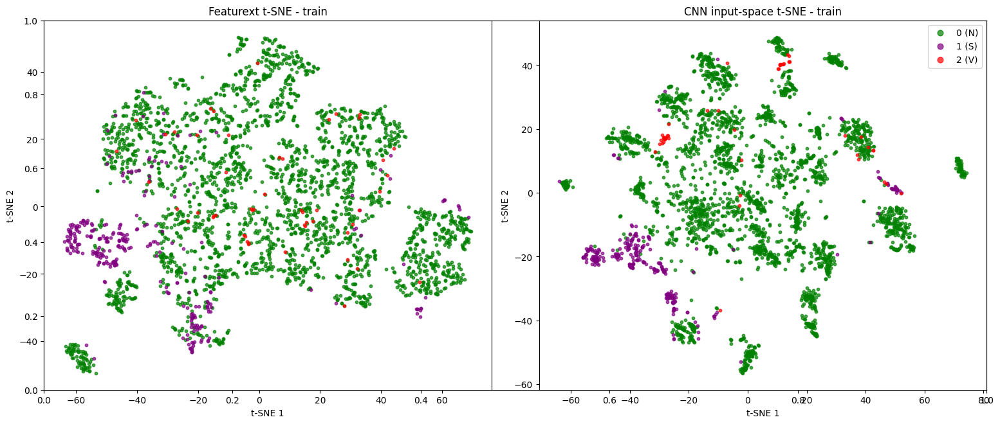

Saved plot: /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_featurext_vs_cnn_train.png
Saved table: /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_featurext_vs_cnn_train.csv
Processing split: val
Merged sample count: 29222
Subsampled count:    3000
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_featurext_vs_cnn_val.png


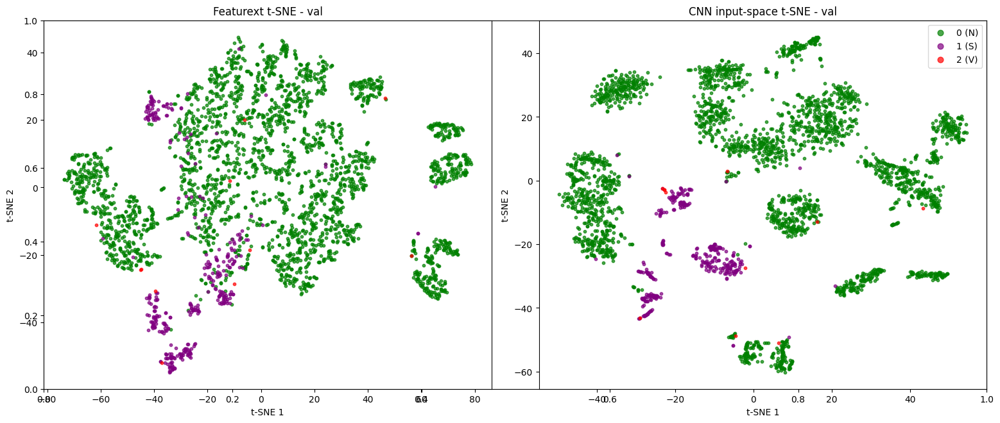

Saved plot: /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_featurext_vs_cnn_val.png
Saved table: /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_featurext_vs_cnn_val.csv
Processing split: test
Merged sample count: 38160
Subsampled count:    3000
[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_featurext_vs_cnn_test.png


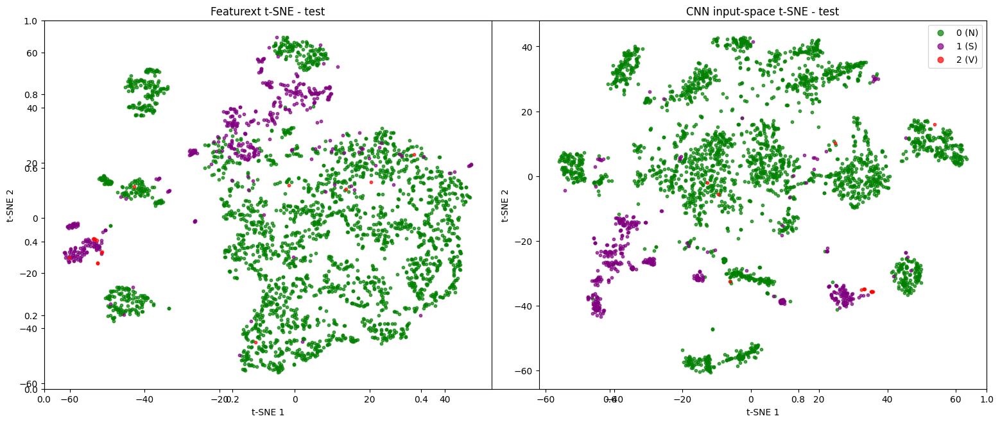

Saved plot: /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_featurext_vs_cnn_test.png
Saved table: /content/ECG/outputs/ternary_n_v_other/incart_tsne/tsne_featurext_vs_cnn_test.csv
Done.
[DONE] plot_tsne_featurext_vs_cnn::{"dataset": "incart"}
[RUN ] train_cnn::{"dataset": "incart"}
Epoch 1/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6224 - loss: 0.6589 — val_macro_f1: 0.507326
212/212 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6146 - loss: 0.6327 - val_accuracy: 0.8758 - val_loss: 0.6555 - val_macro_f1: 0.5073 - learning_rate: 0.0010
Epoch 2/20
211/212 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7044 - loss: 0.6500 — val_macro_f1: 0.464886
212/212 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5855 - loss: 0.6207 - val_accuracy: 0.8081 - val_loss: 0.7907 - val_macro_f1: 0.4649 - learning_rate: 0.0010
Epoch 3/20
208/212 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8395 - loss: 0.6264 — val_macro_f1: 0.464886 (előző érték megtartva)
212/212 ━━━━━━━━━━━━

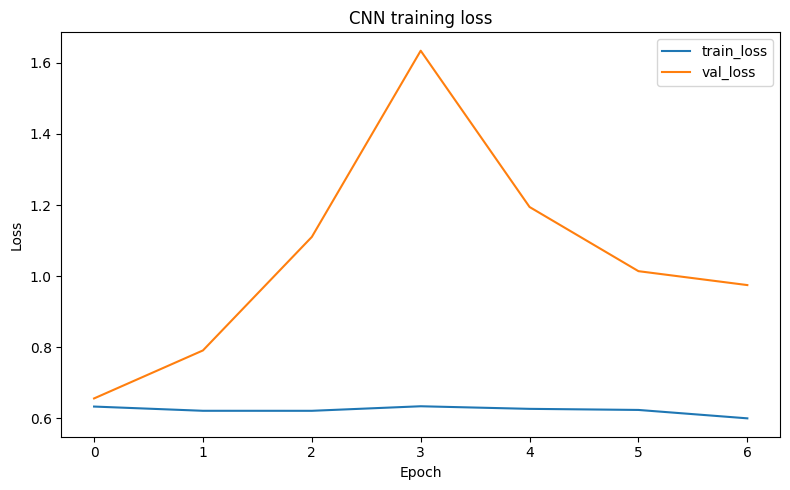

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn/training_accuracy.png


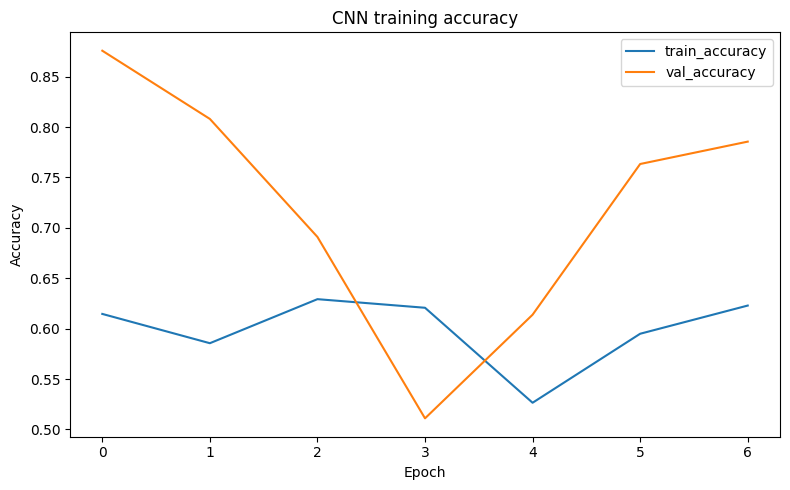

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn/validation_macro_f1.png


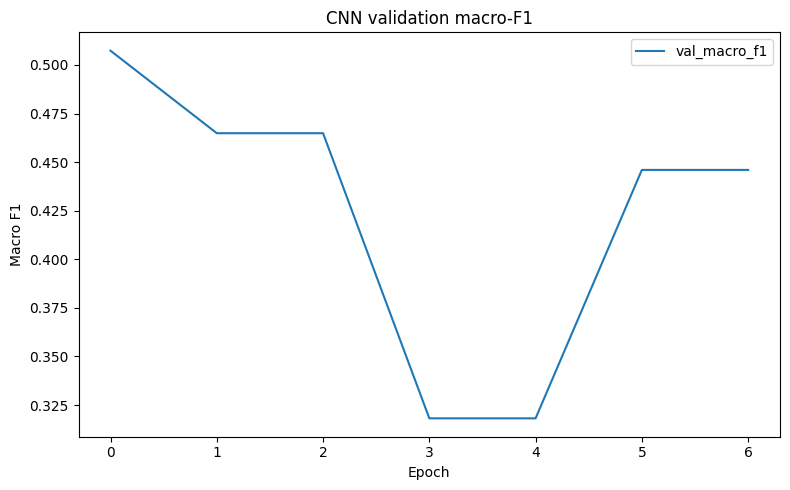

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn/cnn_train_confusion_matrix.png


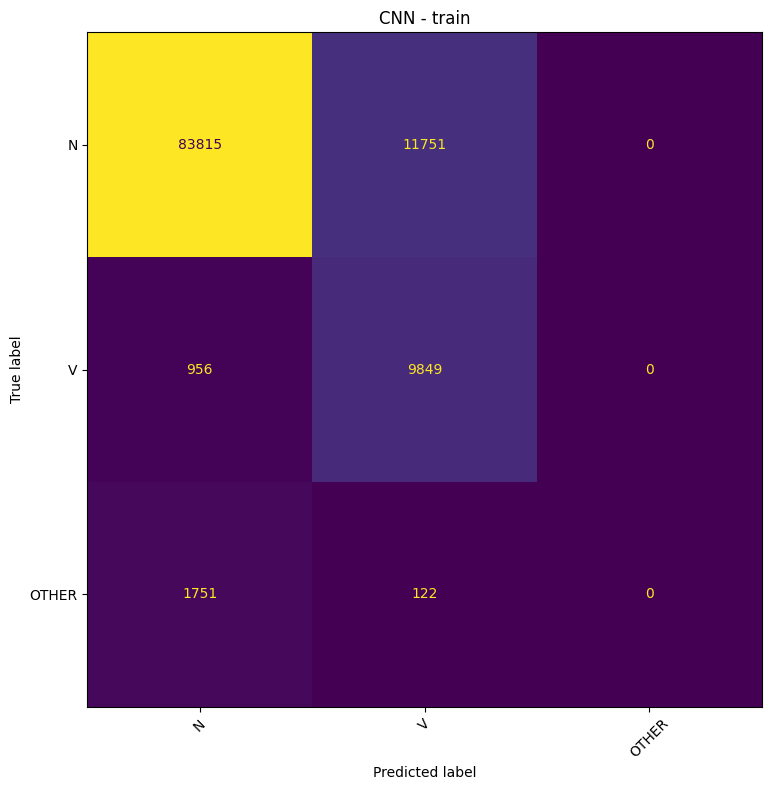

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn/cnn_val_confusion_matrix.png


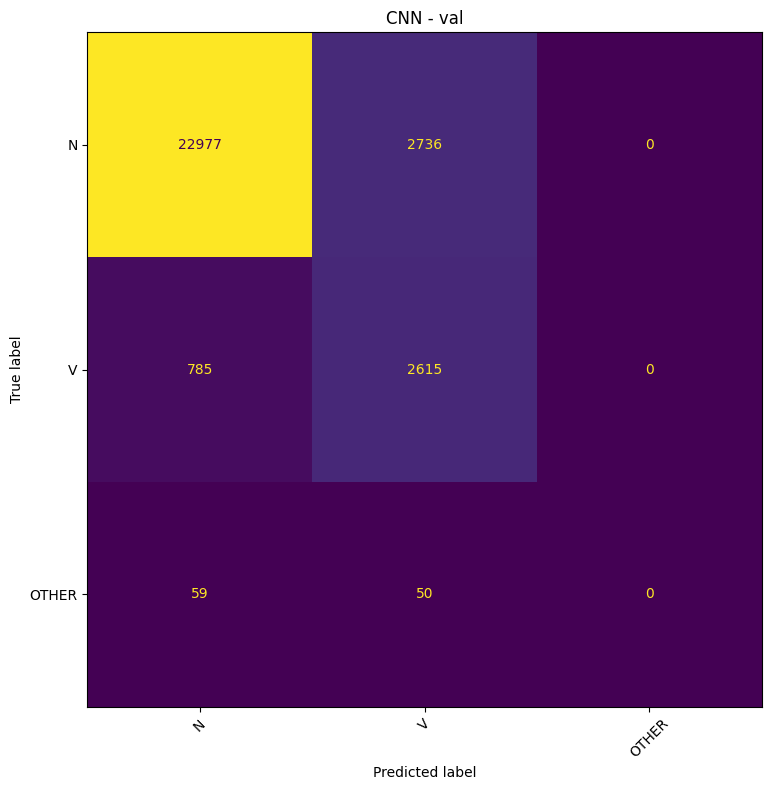

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn/cnn_test_confusion_matrix.png


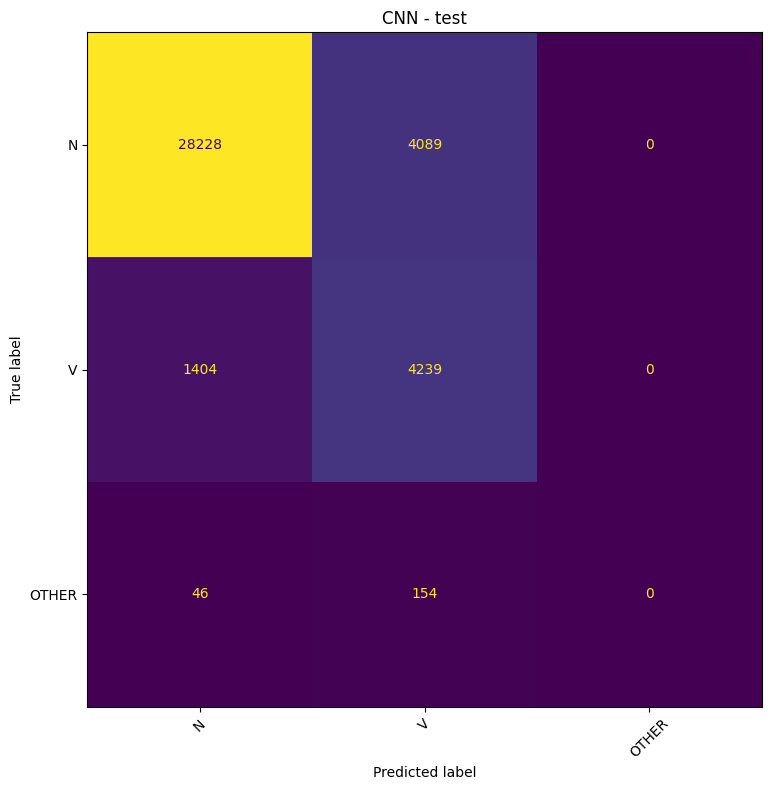

            model  split  n_samples  accuracy  macro_f1  weighted_f1  \
0  cnn_incart_1ch  train     108244  0.865304  0.508729     0.873225   
1  cnn_incart_1ch    val      29222  0.875779  0.507326     0.885466   
2  cnn_incart_1ch   test      38160  0.850812  0.503622     0.859974   

   macro_precision  macro_recall  
0         0.474041      0.596187  
1         0.482913      0.554237  
2         0.483635      0.541556  
[OK] Saved outputs to: /content/ECG/outputs/ternary_n_v_other/incart_cnn
[DONE] train_cnn::{"dataset": "incart"}
[RUN ] prepare_incart_datasets_12ch::{}
[BUILD-12CH] I56
[load_incart_record] I56 | shape=(462600, 12), fs=257.0, ch=12, ann=1705
[BUILD-12CH] I57
[load_incart_record] I57 | shape=(462600, 12), fs=257.0, ch=12, ann=2871
[BUILD-12CH] I22
[load_incart_record] I22 | shape=(462600, 12), fs=257.0, ch=12, ann=3126
[BUILD-12CH] I20
[load_incart_record] I20 | shape=(462600, 12), fs=257.0, ch=12, ann=2652
[BUILD-12CH] I45
[load_incart_record] I45 | shape=(462600,

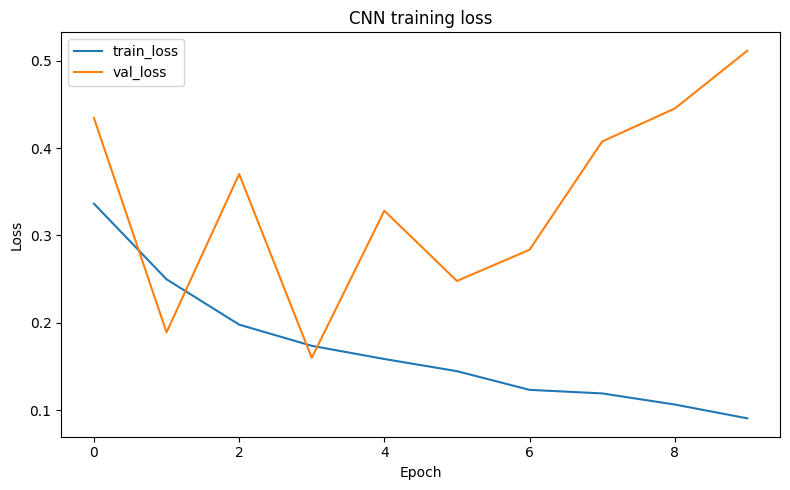

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn_12ch/training_accuracy.png


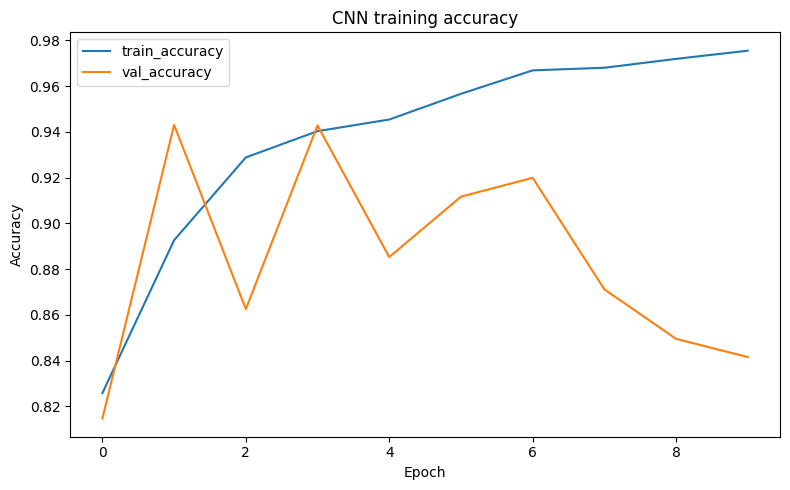

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn_12ch/validation_macro_f1.png


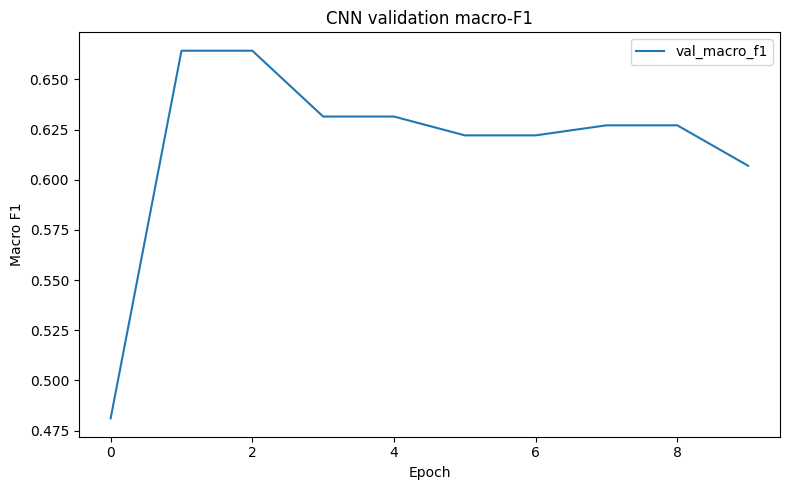

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn_12ch/cnn_train_confusion_matrix.png


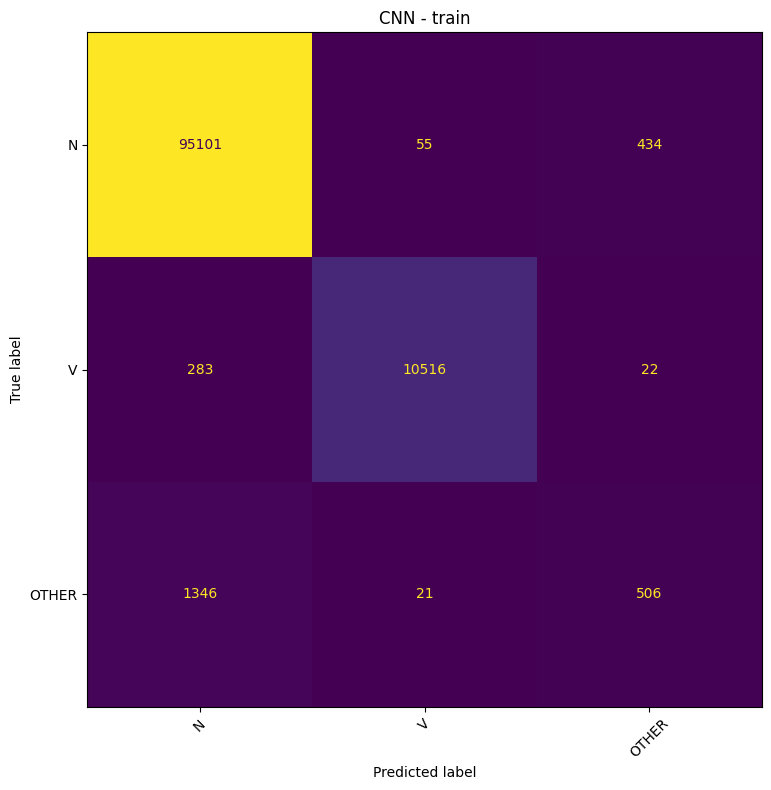

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn_12ch/cnn_val_confusion_matrix.png


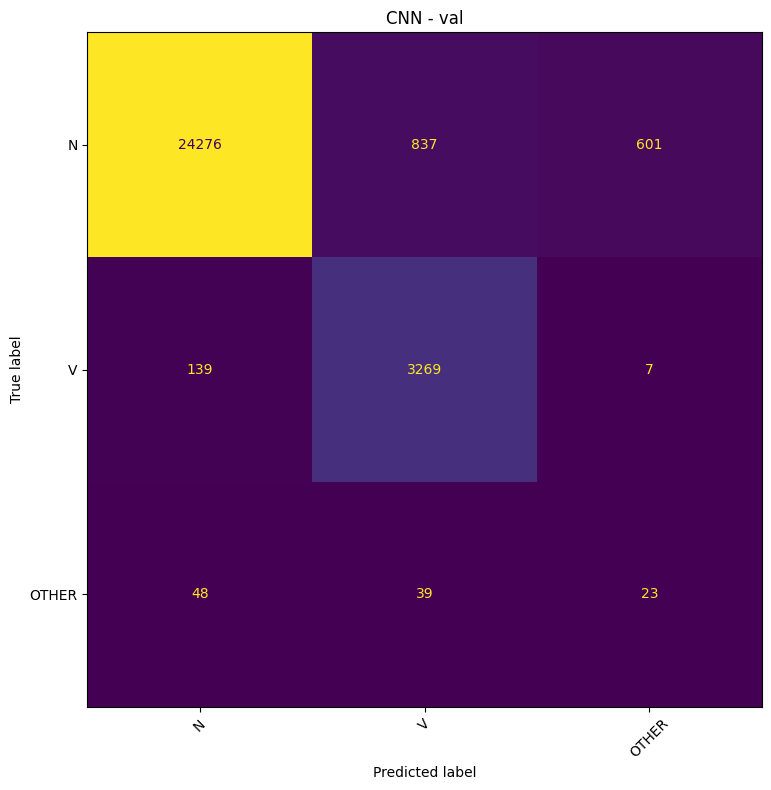

[FIGURE] /content/ECG/outputs/ternary_n_v_other/incart_cnn_12ch/cnn_test_confusion_matrix.png


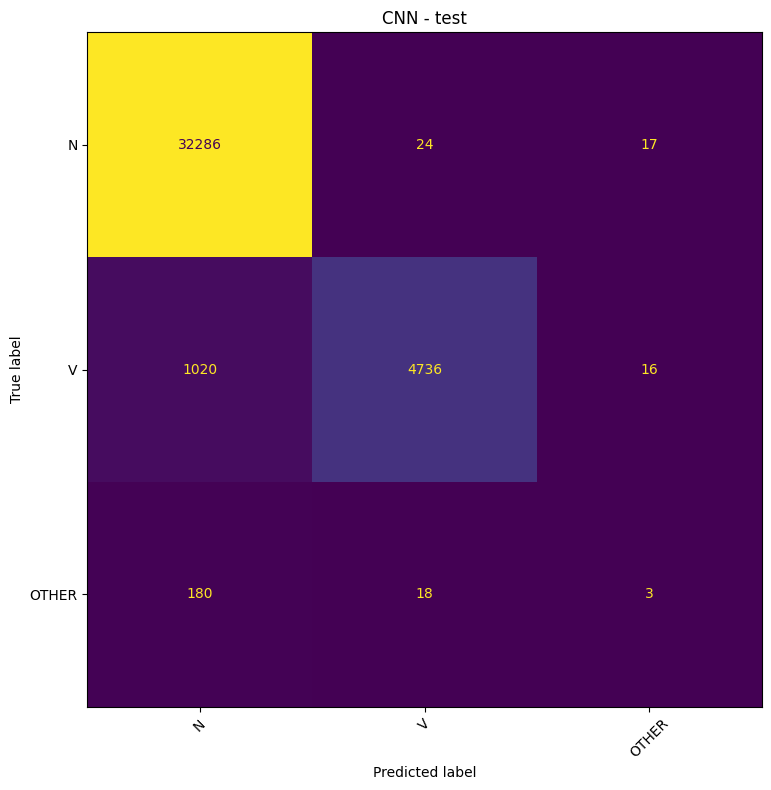

             model  split  n_samples  accuracy  macro_f1  weighted_f1  \
0  cnn_incart_12ch  train     108284  0.980043  0.776054     0.977377   
1  cnn_incart_12ch    val      29239  0.942850  0.631503     0.952201   
2  cnn_incart_12ch   test      38300  0.966710  0.634760     0.963570   

   macro_precision  macro_recall  
0         0.833991      0.745618  
1         0.605822      0.703472  
2         0.679569      0.611390  
[OK] Saved outputs to: /content/ECG/outputs/ternary_n_v_other/incart_cnn_12ch
[DONE] train_cnn_12ch::{"dataset": "incart", "variant": "12ch"}


In [6]:
SECTION = "incart"
COMMON = {"dataset": "incart"}

run_step_if_needed(SECTION, qc_dataset_ext, COMMON)
run_step_if_needed(SECTION, plot_preprocessing_comparison, {**COMMON, "record_name": "I01"})

# 1ch baseline prepare + feature pipeline
run_step_if_needed(SECTION, prepare_incart_datasets)
run_step_if_needed(SECTION, build_general_features, COMMON)
run_step_if_needed(SECTION, build_morphology_features, COMMON)
run_step_if_needed(SECTION, report_features, COMMON)
run_step_if_needed(SECTION, train_featurext, COMMON)
run_step_if_needed(SECTION, plot_dataset_tsne, COMMON)
run_step_if_needed(SECTION, plot_tsne_featurext_vs_cnn, COMMON)
run_step_if_needed(SECTION, train_cnn, COMMON)

# 12ch CNN ág
run_step_if_needed(SECTION, prepare_incart_datasets_12ch, step_name="prepare_incart_datasets_12ch")
run_step_if_needed(
    SECTION,
    train_cnn,
    {**COMMON, "variant": "12ch"},
    step_name="train_cnn_12ch",
)

## CROSS TEST

Ez a szekció a cross-dataset általánosítási kísérletekhez tartozik.  
A jelen notebookban ez a rész **az eredeti baseline logikát követi**, vagyis itt elsősorban az 1 csatornás összehasonlítás a fő fókusz.

[RUN ] prepare_cross_dataset_splits::{}
✔️ Kész.
[DONE] prepare_cross_dataset_splits::{}
[RUN ] train_cnn::{"data_dir": "/content/ECG/data/interim/ternary_n_v_other/cross_dataset/cross_test", "dataset": "cross_test", "results_dir": "/content/ECG/outputs/ternary_n_v_other/cross_test_cnn"}
Epoch 1/20
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.7406 - loss: 0.5957 — val_macro_f1: 0.172228
132/132 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.8234 - loss: 0.4291 - val_accuracy: 0.2444 - val_loss: 1.8001 - val_macro_f1: 0.1722 - learning_rate: 0.0010
Epoch 2/20
119/132 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8351 - loss: 0.4889 — val_macro_f1: 0.445562
132/132 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8640 - loss: 0.3736 - val_accuracy: 0.6739 - val_loss: 1.1934 - val_macro_f1: 0.4456 - learning_rate: 0.0010
Epoch 3/20
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8615 - loss: 0.4447 — val_macro_f1: 0.445562 (előző érték megtartva)
132/132 ━━━━━━━━━━━━━━━

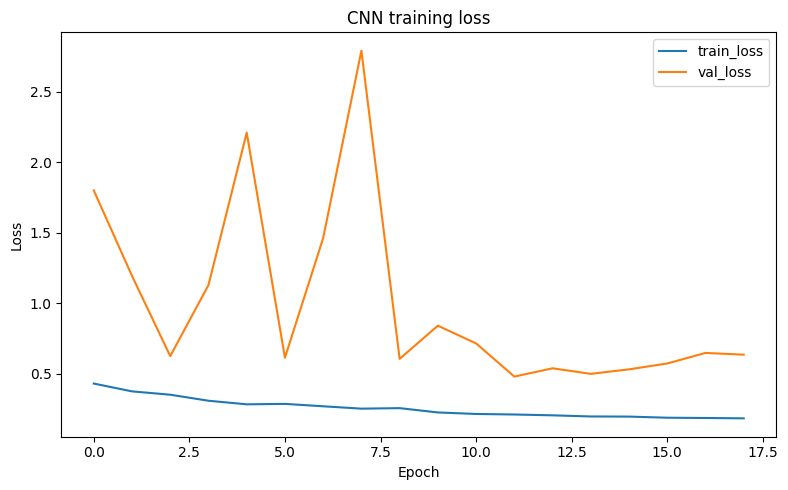

[FIGURE] /content/ECG/outputs/ternary_n_v_other/cross_test_cnn/training_accuracy.png


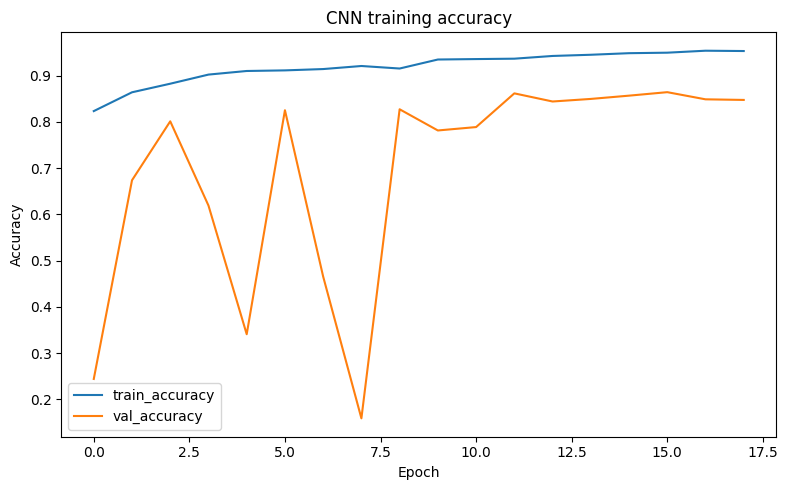

[FIGURE] /content/ECG/outputs/ternary_n_v_other/cross_test_cnn/validation_macro_f1.png


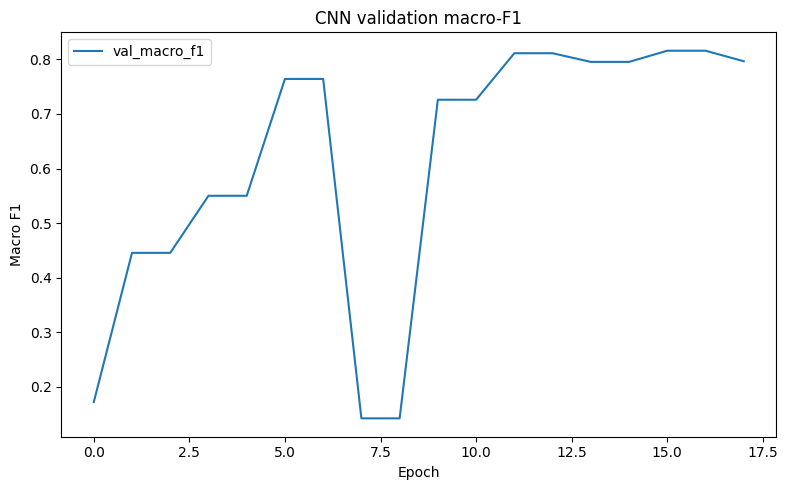

[FIGURE] /content/ECG/outputs/ternary_n_v_other/cross_test_cnn/cnn_train_confusion_matrix.png


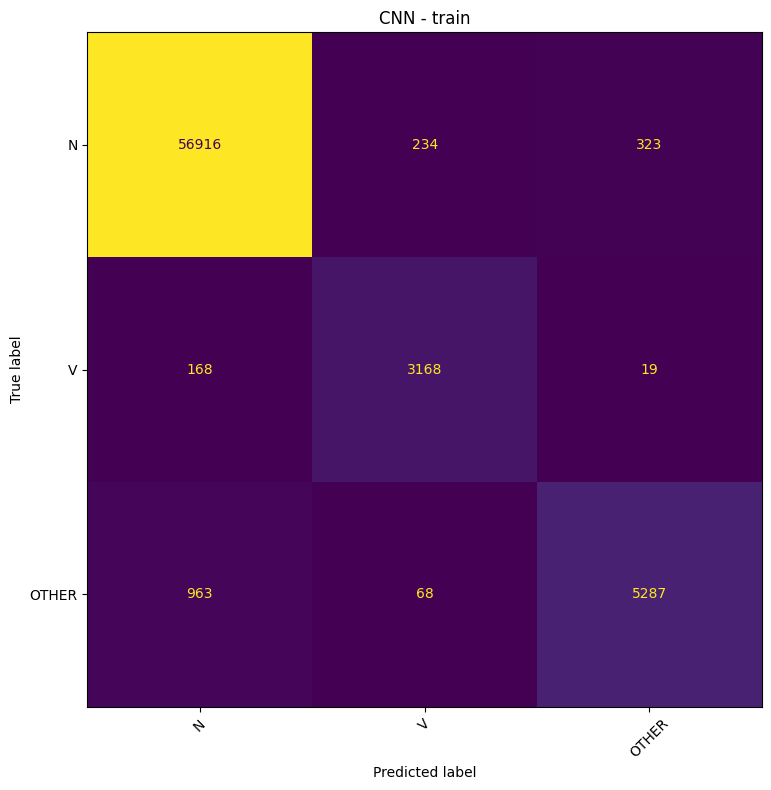

[FIGURE] /content/ECG/outputs/ternary_n_v_other/cross_test_cnn/cnn_val_confusion_matrix.png


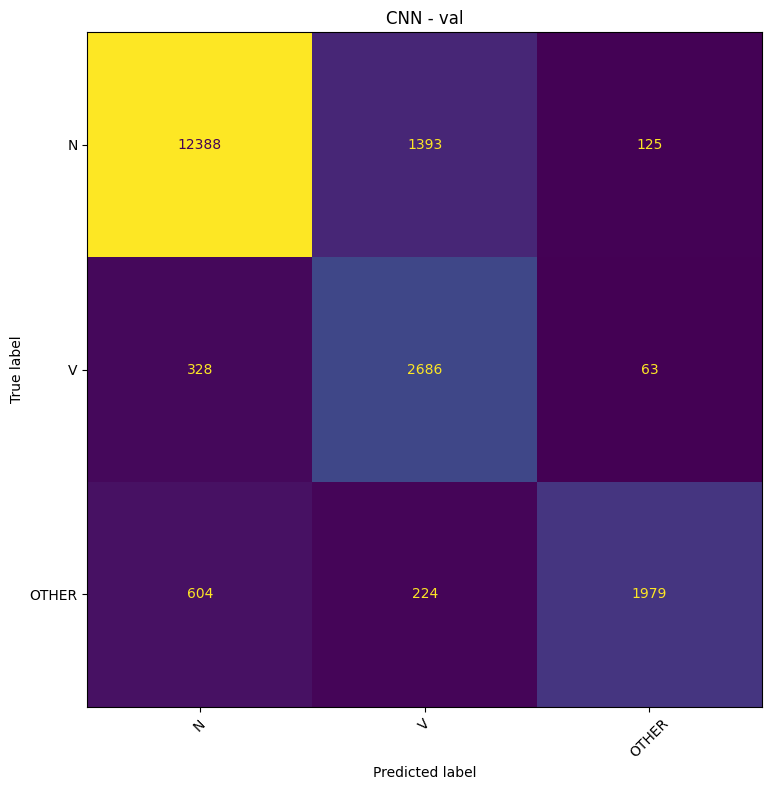

[FIGURE] /content/ECG/outputs/ternary_n_v_other/cross_test_cnn/cnn_test_confusion_matrix.png


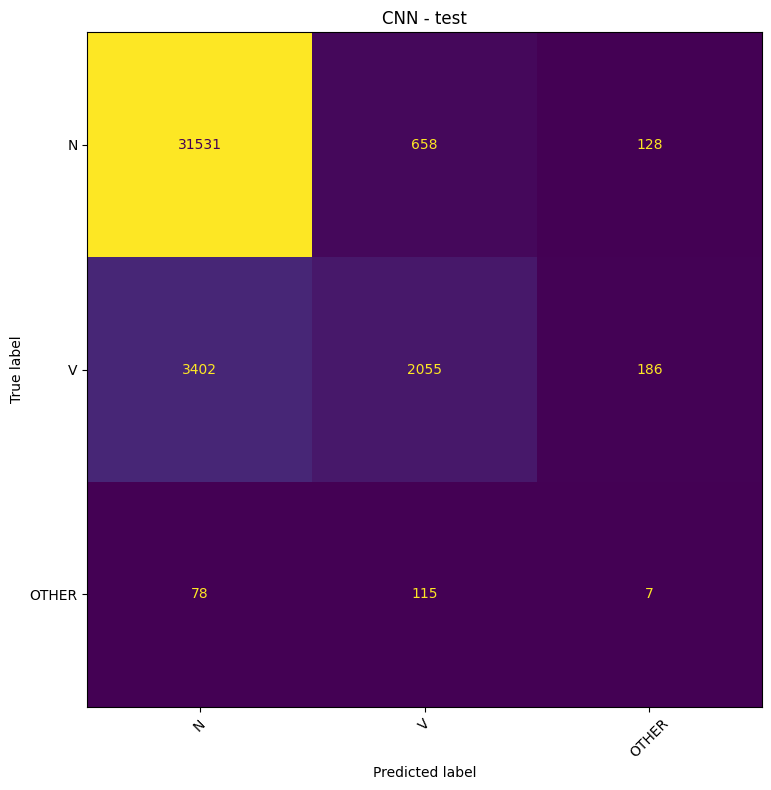

                model  split  n_samples  accuracy  macro_f1  weighted_f1  \
0  cnn_cross_test_1ch  train      67146  0.973565  0.932938     0.973099   
1  cnn_cross_test_1ch    val      19790  0.861698  0.811221     0.865491   
2  cnn_cross_test_1ch   test      38160  0.880320  0.482898     0.865111   

   macro_precision  macro_recall  
0         0.944242      0.923795  
1         0.822497      0.822930  
2         0.549690      0.458282  
[OK] Saved outputs to: /content/ECG/outputs/ternary_n_v_other/cross_test_cnn
[DONE] train_cnn::{"data_dir": "/content/ECG/data/interim/ternary_n_v_other/cross_dataset/cross_test", "dataset": "cross_test", "results_dir": "/content/ECG/outputs/ternary_n_v_other/cross_test_cnn"}


In [7]:
SECTION = "cross_test"
BASE = Path(get_ds_par("cross_test", "beats_dir"))

run_step_if_needed(SECTION, prepare_cross_dataset_splits)

run_step_if_needed(
    SECTION,
    train_cnn,
    {
        "dataset": "cross_test",
        "data_dir": str(BASE),
        "results_dir": str(OUTPUT_DIR / "cross_test_cnn"),
    },
)

# A feature-es és morphology-s cross-dataset ág itt meghagyható külön,
# ha a saját projektverziódban ezek a wrapper-ek támogatják a szükséges paramétereket.

## MIXED

Vegyes tanítóhalmaz: MIT-BIH + INCART.  
Ez a rész továbbra is főleg arra jó, hogy lásd, mennyit segít a vegyes tanítás a generalizáción.

In [ ]:
SECTION = "mixed"
BASE = Path(get_ds_par("mixed", "beats_dir"))

run_step_if_needed(SECTION, prepare_cross_dataset_splits)

run_step_if_needed(
    SECTION,
    train_cnn,
    {
        "dataset": "mixed",
        "data_dir": str(BASE),
        "results_dir": str(OUTPUT_DIR / "mixed_cnn"),
    },
)

[RUN ] prepare_cross_dataset_splits::{}


## DOMAIN GENERALIZATION

Ebben a blokkban a cél az, hogy a tanítás és a teszt különböző domainből jöjjön, és látszódjon, mennyire robusztus a modell.  
Itt is a baseline CNN ág marad a fő futási út.

[RUN ] prepare_cross_dataset_splits::{}
✔️ Kész.
[DONE] prepare_cross_dataset_splits::{}
[RUN ] train_cnn::{"data_dir": "/content/ECG/data/interim/ternary_n_v_other/cross_dataset/domain_generalization", "dataset": "domain_generalization", "results_dir": "/content/ECG/outputs/ternary_n_v_other/domain_generalization_cnn"}
Epoch 1/20
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.7406 - loss: 0.5963 — val_macro_f1: 0.270724
132/132 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.8253 - loss: 0.4296 - val_accuracy: 0.4088 - val_loss: 1.3978 - val_macro_f1: 0.2707 - learning_rate: 0.0010
Epoch 2/20
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8403 - loss: 0.4799 — val_macro_f1: 0.453553
132/132 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8652 - loss: 0.3786 - val_accuracy: 0.7561 - val_loss: 0.6330 - val_macro_f1: 0.4536 - learning_rate: 0.0010
Epoch 3/20
129/132 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8574 - loss: 0.4655 — val_macro_f1: 0.453553 (előző érték 

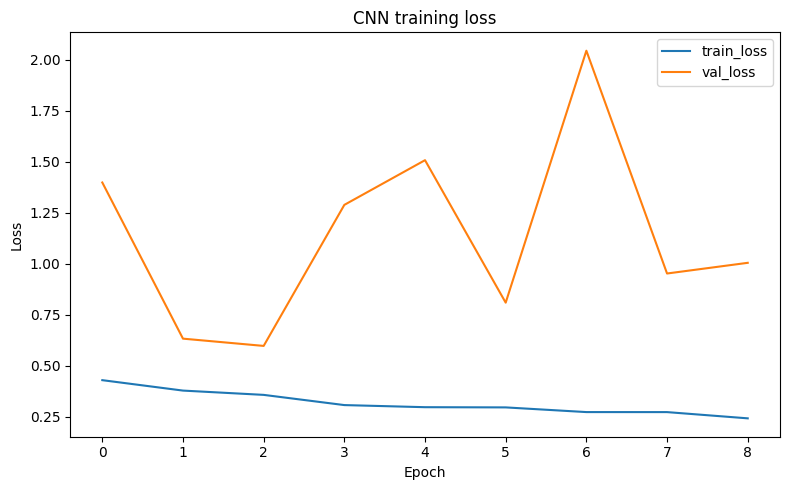

[FIGURE] /content/ECG/outputs/ternary_n_v_other/domain_generalization_cnn/training_accuracy.png


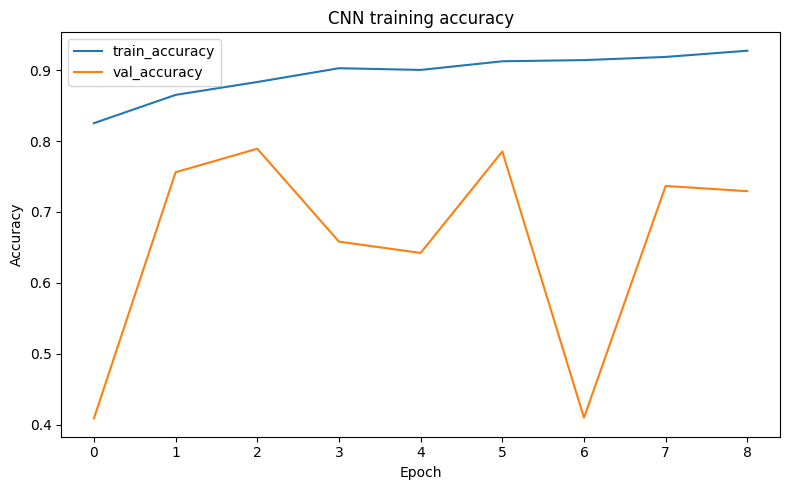

[FIGURE] /content/ECG/outputs/ternary_n_v_other/domain_generalization_cnn/validation_macro_f1.png


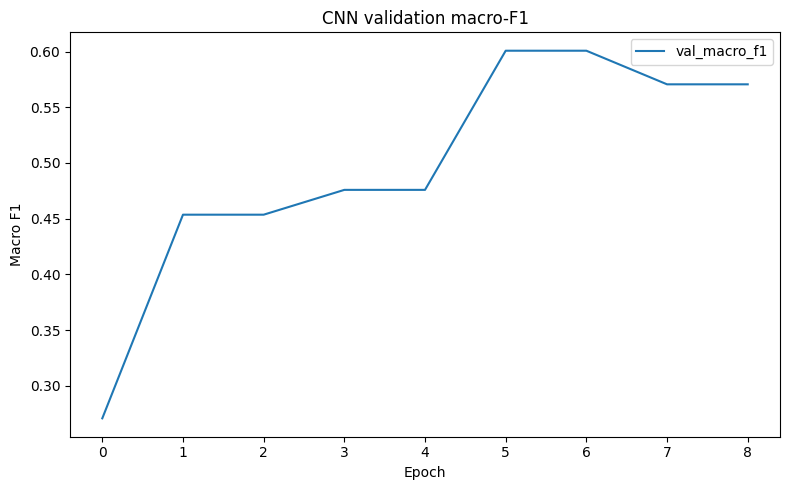

[FIGURE] /content/ECG/outputs/ternary_n_v_other/domain_generalization_cnn/cnn_train_confusion_matrix.png


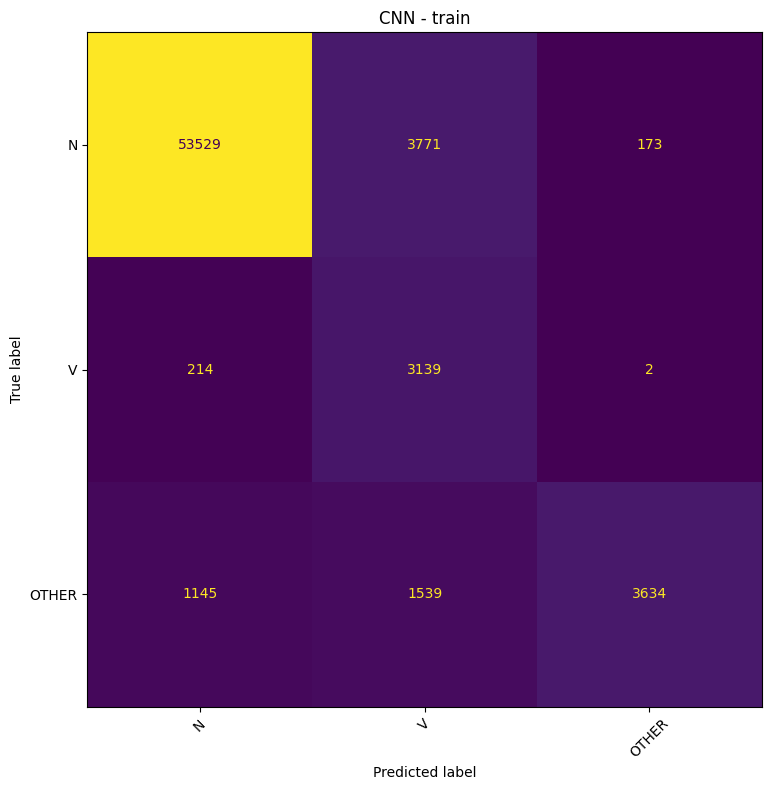

[FIGURE] /content/ECG/outputs/ternary_n_v_other/domain_generalization_cnn/cnn_val_confusion_matrix.png


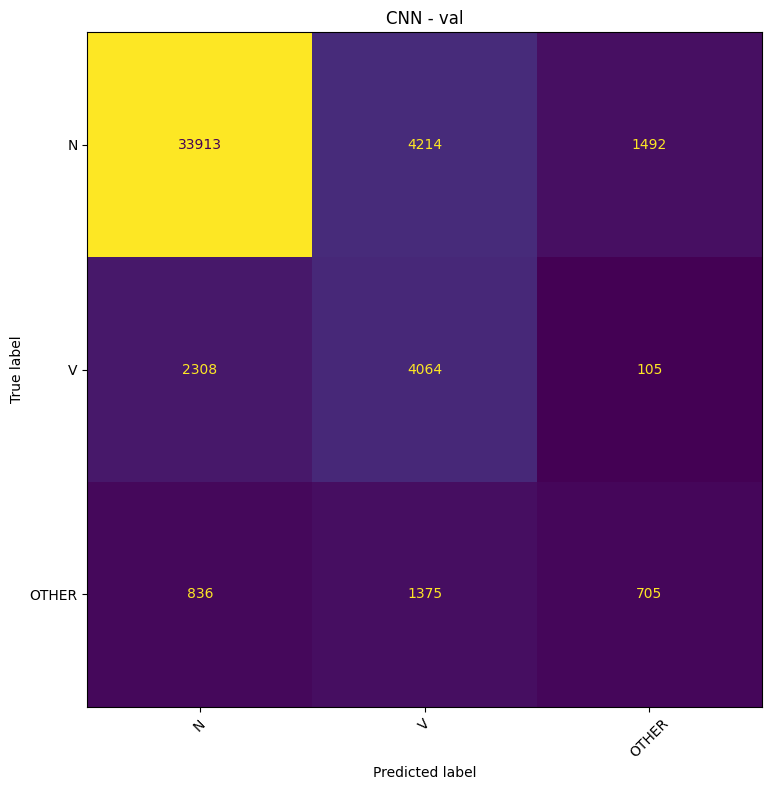

[FIGURE] /content/ECG/outputs/ternary_n_v_other/domain_generalization_cnn/cnn_test_confusion_matrix.png


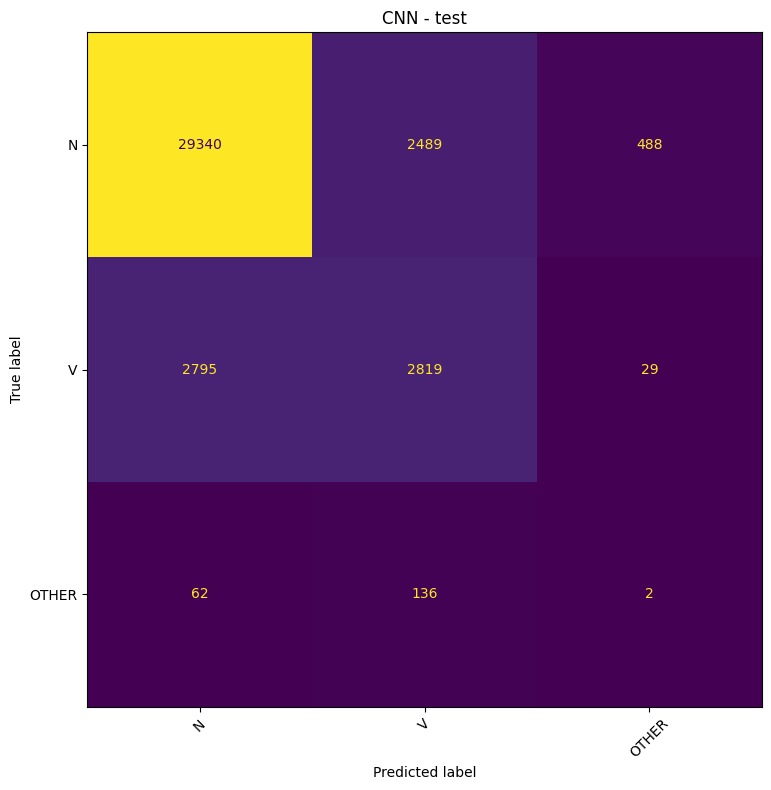

                           model  split  n_samples  accuracy  macro_f1  \
0  cnn_domain_generalization_1ch  train      67146  0.898073  0.734114   
1  cnn_domain_generalization_1ch    val      49012  0.789235  0.552901   
2  cnn_domain_generalization_1ch   test      38160  0.842794  0.474552   

   weighted_f1  macro_precision  macro_recall  
0     0.909648         0.766940      0.814059  
1     0.797721         0.547474      0.575066  
2     0.845526         0.477645      0.472479  
[OK] Saved outputs to: /content/ECG/outputs/ternary_n_v_other/domain_generalization_cnn
[DONE] train_cnn::{"data_dir": "/content/ECG/data/interim/ternary_n_v_other/cross_dataset/domain_generalization", "dataset": "domain_generalization", "results_dir": "/content/ECG/outputs/ternary_n_v_other/domain_generalization_cnn"}


In [ ]:
SECTION = "domain_generalization"
BASE = Path(get_ds_par("domain_generalization", "beats_dir"))

run_step_if_needed(SECTION, prepare_cross_dataset_splits)

run_step_if_needed(
    SECTION,
    train_cnn,
    {
        "dataset": "domain_generalization",
        "data_dir": str(BASE),
        "results_dir": str(OUTPUT_DIR / "domain_generalization_cnn"),
    },
)

## COMPARE

Ebben a részben készülnek az összehasonlító ábrák és táblázatok.

**Rövid értelmezés**
- MIT-BIH-nál a fő kérdés: javít-e a **2 csatornás CNN** az 1 csatornás baseline-hoz képest.
- INCART-nál a fő kérdés: mennyit ad hozzá a **12 csatorna** a FeatureXt és az 1ch CNN mellé.
- A compare script már a confusion matrix-eket is egymás mellé tudja rajzolni.

In [12]:
SECTION = "compare"

run_step_if_needed(
    SECTION,
    plot_cross_dataset_tsne,
    {
        "source_dataset": "mitbih",
        "target_dataset": "incart",
        "split": "test",
    },
)

run_step_if_needed(
    SECTION,
    compare_dataset_models_extended,
    {
        "dataset": "mitbih",
        "left_family": "featurext",
        "right_family": "cnn",
        "third_family": "cnn2",
        "results_subdir": "mitbih_featurext_vs_cnn_vs_cnn2_extended",
        "select_best_left": True,
    },
    step_name="compare_models_extended_mitbih_3way",
)

run_step_if_needed(
    SECTION,
    compare_dataset_models_extended,
    {
        "dataset": "incart",
        "left_family": "featurext",
        "right_family": "cnn",
        "third_family": "cnn12",
        "results_subdir": "incart_featurext_vs_cnn_vs_cnn12_extended",
        "select_best_left": True,
    },
    step_name="compare_models_extended_incart_3way",
)

run_step_if_needed(
    SECTION,
    compare_dataset_models_extended,
    {
        "dataset": "incart",
        "left_family": "cnn",
        "right_family": "cnn12",
        "results_subdir": "incart_cnn_vs_cnn12ch_extended",
    },
    step_name="compare_models_extended_incart_cnn_vs_cnn12",
)

[RUN ] plot_cross_dataset_tsne::{"dataset_left": "mitbih", "dataset_right": "incart", "split": "test"}


TypeError: plot_cross_dataset_tsne() got an unexpected keyword argument 'dataset_left'

In [ ]:
from pathlib import Path
import shutil
from src.config import LOGS_DIR

print("Másolás a GDRIVE-ra.")

# 1) OUTPUTS + LOGS másolás

targets = [
    (Path(OUTPUT_DIR), Path(GDRIVE_ROOT) / "outputs"),
    (Path(LOGS_DIR), Path(GDRIVE_ROOT) / "logs"),
]

for src, dst in targets:
    if not src.exists():
        print(f"[WARN] Forrás nem létezik, kihagyva: {src}")
        continue
    dst.mkdir(parents=True, exist_ok=True)
    shutil.copytree(src, dst, dirs_exist_ok=True)
    print(f"[OK] Másolva: {src} -> {dst}")

# 2) Notebook mentés outputokkal együtt
from google.colab import _message

nb_payload = _message.blocking_request("get_ipynb")
nb_json = nb_payload["ipynb"]  # tartalmazza a cella outputokat is
nb_out_dir = Path(GDRIVE_ROOT) / "notebooks"
nb_out_dir.mkdir(parents=True, exist_ok=True)
ts = datetime.now().strftime("%Y%m%d_%H%M%S")
nb_out_path = nb_out_dir / f"ecg_full_20260506_with_outputs_{ts}.ipynb"
with open(nb_out_path, "w", encoding="utf-8") as f:
    json.dump(nb_json, f, ensure_ascii=False, indent=2)
print(f"[OK] Notebook mentve outputokkal: {nb_out_path}")

print("Projekt vége.")
print("====================================")

: 

## Rövid záró értelmezés

A notebook végére várhatóan három fontos összehasonlításod lesz:

1. **MIT-BIH:** FeatureXt vs CNN 1ch vs CNN 2ch  
2. **INCART:** FeatureXt vs CNN 1ch vs CNN 12ch  
3. **Cross-dataset:** mennyire romlik a teljesítmény domainváltásnál

Érdemes külön figyelni:
- a **macro-F1** változására,
- a **confusion matrix**-ben a V és OTHER osztályok keveredésére,
- valamint arra, hogy a többcsatornás modellek valóban stabilabban viselkednek-e a teszt splitben.